# Housing : Price Prediction

Problem Statement : 
Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.
A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?

Business Goal:
You are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market

Technical Requirements:
• Data contains 1460 entries each having 81 variables.

• Data contains Null values. You need to treat them using the domain knowledge and your own understanding.

• Extensive EDA has to be performed to gain relationships of important variable and price.

• Data contains numerical as well as categorical variable. You need to handle them accordingly.

• You have to build Machine Learning models, apply regularization and determine the optimal values of Hyper Parameters.

• You need to find important features which affect the price positively or negatively.

• Two datasets are being provided to you (test.csv, train.csv). You will train on train.csv dataset and predict on test.csv
file.

The “Data file.csv” and “Data description.txt” are enclosed with this file.

In [427]:
#Import libraries for data analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [428]:
#Load the dataset
df = pd.read_csv('C:/Users/User/Desktop/Data Science/Internship_28/Project-Housing_splitted/train.csv')

df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


Data Description : 

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density
	
LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access to property

       Grvl	Gravel	
       Pave	Paved
       	
Alley: Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
		
LotShape: General shape of property

       Reg	Regular	
       IR1	Slightly irregular
       IR2	Moderately Irregular
       IR3	Irregular
       
LandContour: Flatness of the property

       Lvl	Near Flat/Level	
       Bnk	Banked - Quick and significant rise from street grade to building
       HLS	Hillside - Significant slope from side to side
       Low	Depression
		
Utilities: Type of utilities available
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	
	
LotConfig: Lot configuration

       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property
	
LandSlope: Slope of property
		
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope
	
Neighborhood: Physical locations within Ames city limits

       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       IDOTRR	Iowa DOT and Rail Road
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker
			
Condition1: Proximity to various conditions
	
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
Condition2: Proximity to various conditions (if more than one is present)
		
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
BldgType: Type of dwelling
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit
	
HouseStyle: Style of dwelling
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level
	
OverallQual: Rates the overall material and finish of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor
	
OverallCond: Rates the overall condition of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average	
       5	Average
       4	Below Average	
       3	Fair
       2	Poor
       1	Very Poor
		
YearBuilt: Original construction date

YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)

RoofStyle: Type of roof

       Flat	Flat
       Gable	Gable
       Gambrel	Gabrel (Barn)
       Hip	Hip
       Mansard	Mansard
       Shed	Shed
		
RoofMatl: Roof material

       ClyTile	Clay or Tile
       CompShg	Standard (Composite) Shingle
       Membran	Membrane
       Metal	Metal
       Roll	Roll
       Tar&Grv	Gravel & Tar
       WdShake	Wood Shakes
       WdShngl	Wood Shingles
		
Exterior1st: Exterior covering on house

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
Exterior2nd: Exterior covering on house (if more than one material)

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
MasVnrType: Masonry veneer type

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
	
MasVnrArea: Masonry veneer area in square feet

ExterQual: Evaluates the quality of the material on the exterior 
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
ExterCond: Evaluates the present condition of the material on the exterior
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Foundation: Type of foundation
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood
		
BsmtQual: Evaluates the height of the basement

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
BsmtCond: Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
BsmtExposure: Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
	
BsmtFinType1: Rating of basement finished area

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
		
BsmtFinSF1: Type 1 finished square feet

BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtFinSF2: Type 2 finished square feet

BsmtUnfSF: Unfinished square feet of basement area

TotalBsmtSF: Total square feet of basement area

Heating: Type of heating
		
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace
		
HeatingQC: Heating quality and condition

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
CentralAir: Central air conditioning

       N	No
       Y	Yes
		
Electrical: Electrical system

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
		
1stFlrSF: First Floor square feet
 
2ndFlrSF: Second floor square feet

LowQualFinSF: Low quality finished square feet (all floors)

GrLivArea: Above grade (ground) living area square feet

BsmtFullBath: Basement full bathrooms

BsmtHalfBath: Basement half bathrooms

FullBath: Full bathrooms above grade

HalfBath: Half baths above grade

Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

Kitchen: Kitchens above grade

KitchenQual: Kitchen quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

Functional: Home functionality (Assume typical unless deductions are warranted)

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only
		
Fireplaces: Number of fireplaces

FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
GarageType: Garage location
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
		
GarageYrBlt: Year garage was built
		
GarageFinish: Interior finish of the garage

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
		
GarageCars: Size of garage in car capacity

GarageArea: Size of garage in square feet

GarageQual: Garage quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
GarageCond: Garage condition

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
PavedDrive: Paved driveway

       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel
		
WoodDeckSF: Wood deck area in square feet

OpenPorchSF: Open porch area in square feet

EnclosedPorch: Enclosed porch area in square feet

3SsnPorch: Three season porch area in square feet

ScreenPorch: Screen porch area in square feet

PoolArea: Pool area in square feet

PoolQC: Pool quality
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
		
Fence: Fence quality
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
	
MiscFeature: Miscellaneous feature not covered in other categories
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
		
MiscVal: $Value of miscellaneous feature

MoSold: Month Sold (MM)

YrSold: Year Sold (YYYY)

SaleType: Type of sale
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other
		
SaleCondition: Condition of sale

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)

In [429]:
#Shape of the dataset
df.shape

(1168, 81)

In [430]:
#Column names of the dataset
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [431]:
#Information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [432]:
#datatype about the dataset
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

# EDA

In [433]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [434]:
#statistical summary
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1168.000000,1168.000000,954.00000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1161.000000,1168.000000,...,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,724.136130,56.767979,70.98847,10484.749144,6.104452,5.595890,1970.930651,1984.758562,102.310078,444.726027,...,96.206336,46.559932,23.015411,3.639555,15.051370,3.448630,47.315068,6.344178,2007.804795,181477.005993
std,416.159877,41.940650,24.82875,8957.442311,1.390153,1.124343,30.145255,20.785185,182.595606,462.664785,...,126.158988,66.381023,63.191089,29.088867,55.080816,44.896939,543.264432,2.686352,1.329738,79105.586863
min,1.000000,20.000000,21.00000,1300.000000,1.000000,1.000000,1875.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,360.500000,20.000000,60.00000,7621.500000,5.000000,5.000000,1954.000000,1966.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000
50%,714.500000,50.000000,70.00000,9522.500000,6.000000,5.000000,1972.000000,1993.000000,0.000000,385.500000,...,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163995.000000
75%,1079.500000,70.000000,80.00000,11515.500000,7.000000,6.000000,2000.000000,2004.000000,160.000000,714.500000,...,171.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,215000.000000
max,1460.000000,190.000000,313.00000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


The above cell shows the statistical summary of numerical variables.

In [435]:
df.describe(include=['O'])

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,1168,1168,77,1168,1168,1168,1168,1168,1168,1168,...,1104,1104,1104,1104,1168,7,237,44,1168,1168
unique,5,2,2,4,4,1,5,3,25,9,...,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,928,1164,41,740,1046,1168,842,1105,182,1005,...,691,487,1050,1061,1071,3,129,40,999,945


The above cell shows the statistical summary of categorical variables.

<AxesSubplot:>

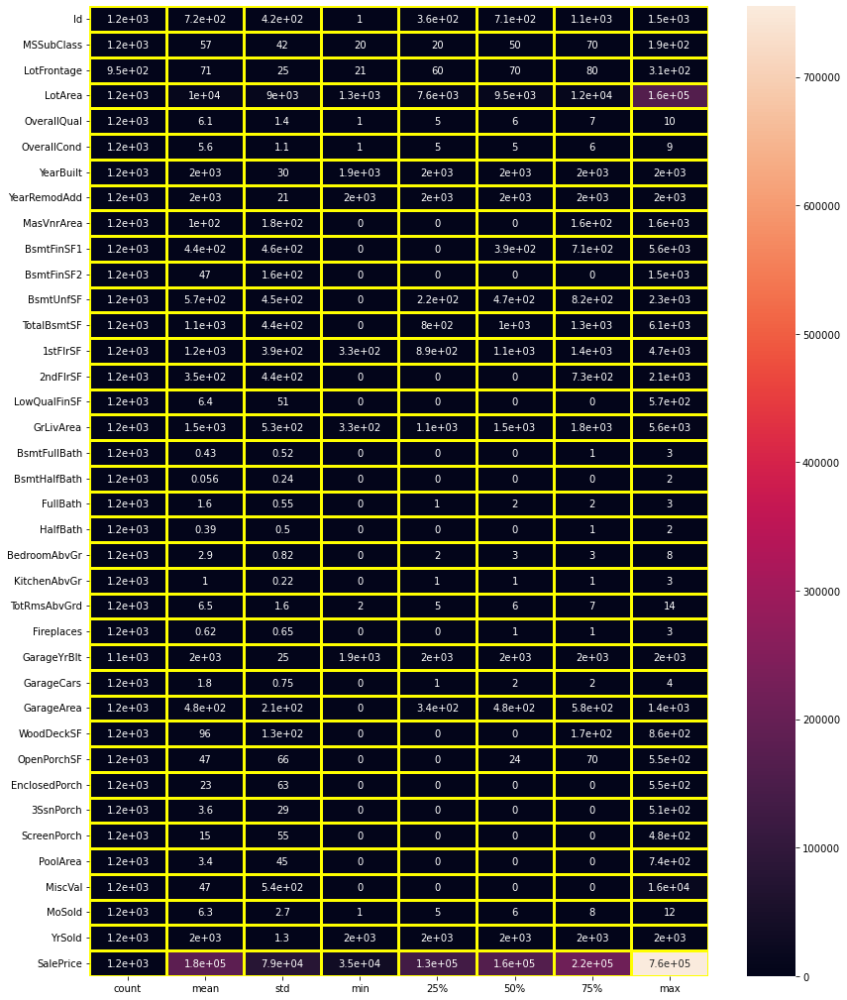

In [436]:
#Graphical representation of describe method

plt.figure(figsize=(14,18))
sns.heatmap(df.describe().T,annot=True,linecolor='yellow',linewidths=3)

# Missing values

Now I will check for missing values

In [437]:
print(df.isnull().sum().to_string())

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

Missing values are present in LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,
FireplaceQu,GarageType ,GarageYrBlt ,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature

In [438]:
#Create a variable and store the variables having null values
null_values = df[['LotFrontage','Alley','MasVnrType','MasVnrArea','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','FireplaceQu',
                  'GarageType' ,'GarageYrBlt' ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']]

In [439]:
null_values

,LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,NaN,NaN,None,0.0,Gd,TA,No,ALQ,Unf,TA,Attchd,1977.0,RFn,TA,TA,NaN,NaN,NaN
1,95.0,NaN,None,0.0,TA,Gd,Gd,ALQ,Rec,TA,Attchd,1970.0,Unf,TA,TA,NaN,NaN,NaN
2,92.0,NaN,None,0.0,Gd,TA,Av,GLQ,Unf,TA,Attchd,1997.0,Unf,TA,TA,NaN,NaN,NaN
3,105.0,NaN,BrkFace,480.0,Gd,TA,No,BLQ,Unf,TA,Attchd,1977.0,RFn,TA,TA,NaN,MnPrv,NaN
4,NaN,NaN,Stone,126.0,Gd,TA,No,ALQ,Unf,TA,Attchd,1977.0,Fin,TA,TA,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,NaN,NaN,BrkFace,31.0,TA,TA,No,BLQ,Unf,NaN,Detchd,1970.0,Unf,TA,TA,NaN,MnPrv,NaN
1164,67.0,NaN,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN,Detchd,2002.0,Fin,TA,TA,NaN,MnPrv,NaN
1165,24.0,NaN,None,0.0,Gd,TA,No,ALQ,Unf,TA,Attchd,1976.0,Unf,TA,TA,NaN,NaN,NaN
1166,50.0,Pave,None,0.0,TA,TA,No,Unf,Unf,NaN,Detchd,1920.0,Unf,TA,Fa,NaN,MnPrv,NaN


I have created a variable called 'null values' which will store the variables from the df dataset having null values.Next I will check for how many null values are present in each column which I will tune it for my next analysis part.

In [440]:
#Check for null values in null_values data
null_values.isnull().sum()

LotFrontage      214
Alley           1091
MasVnrType         7
MasVnrArea         7
BsmtQual          30
BsmtCond          30
BsmtExposure      31
BsmtFinType1      30
BsmtFinType2      31
FireplaceQu      551
GarageType        64
GarageYrBlt       64
GarageFinish      64
GarageQual        64
GarageCond        64
PoolQC          1161
Fence            931
MiscFeature     1124
dtype: int64

In [441]:
#Total null values count
null_values.isnull().sum().sum()

5558

In [442]:
#Datatype for each column present in null values variable
null_values.dtypes

LotFrontage     float64
Alley            object
MasVnrType       object
MasVnrArea      float64
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
BsmtFinType2     object
FireplaceQu      object
GarageType       object
GarageYrBlt     float64
GarageFinish     object
GarageQual       object
GarageCond       object
PoolQC           object
Fence            object
MiscFeature      object
dtype: object

The above cell consists of columns which have missing values of type categorical consisting of 15 columns and type numerical consisting of 3 columns.

I will use Simple Imputer to fill the missing values

In [443]:
from sklearn.impute import SimpleImputer

si = SimpleImputer(strategy='most_frequent')

Now I will fill missing values for object datatype

In [444]:
#Checking count of values for each variable of object datatype having null values
for col in null_values.select_dtypes(include=['O']):
    print(df[col].value_counts())
    print('-'*20)

Grvl    41
Pave    36
Name: Alley, dtype: int64
--------------------
None       696
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64
--------------------
TA    517
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64
--------------------
TA    1041
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64
--------------------
No    756
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64
--------------------
Unf    345
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64
--------------------
Unf    1002
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64
--------------------
Gd    301
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64
--------------------
Attchd     691
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64
--------------------
Unf    487
RFn    339
Fin    278
Name: GarageFinis

In [445]:
#Filling missing values in null values variable having object datatype
for i in null_values.select_dtypes(include=['O']):
    df[i] = si.fit_transform(df[[i]])

In [446]:
#Updated main df 
df.select_dtypes(include=['O']).isnull().sum()

MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
SaleType         0
SaleCondition    0
dtype: int64

From the above cell I have filled missing values in columns which are of object datatype.

In [447]:
#Checking count of values for each variable of object datatype after filling null values
for col in null_values.select_dtypes(include=['O']):
    print(df[col].value_counts())
    print('-'*20)

Grvl    1132
Pave      36
Name: Alley, dtype: int64
--------------------
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64
--------------------
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64
--------------------
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64
--------------------
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64
--------------------
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64
--------------------
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64
--------------------
Gd    852
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64
--------------------
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64
--------------------
Unf    551
RFn    339
Fin    278
Name: GarageF

Now I will proceed to fill missing values for numerical datatype

In [448]:
#Checking count of values for each variable of numerical datatype having null values
for number in null_values.select_dtypes(include=['number']):
    print(df[number].value_counts())
    print('-'*20)

60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
        ... 
102.0      1
144.0      1
112.0      1
149.0      1
153.0      1
Name: LotFrontage, Length: 106, dtype: int64
--------------------
0.0      692
72.0       7
180.0      6
120.0      6
106.0      5
        ... 
653.0      1
975.0      1
226.0      1
204.0      1
31.0       1
Name: MasVnrArea, Length: 283, dtype: int64
--------------------
2006.0    52
2005.0    51
2007.0    40
2003.0    37
2004.0    36
          ..
1900.0     1
1927.0     1
1908.0     1
1933.0     1
1906.0     1
Name: GarageYrBlt, Length: 97, dtype: int64
--------------------


In [449]:
#create object for Simple Imputer
si_numerical = SimpleImputer(strategy='mean')
si_numerical

SimpleImputer()

In [450]:
#Filling missing values in null values variable having object datatype
for n in null_values.select_dtypes(include=['number']):
    df[n] = si.fit_transform(df[[n]])

In [451]:
#Updated main df 
df.select_dtypes(include=['number']).isnull().sum()

Id               0
MSSubClass       0
LotFrontage      0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
SalePrice        0
dtype: int64

From the above cell I have filled missing values in columns which are of numerical datatype.

In [452]:
#Checking count of values for each variable of numerical datatype after filling null values
for col1 in null_values.select_dtypes(include=['number']):
    print(df[col1].value_counts())
    print('-'*20)

60.0     325
80.0      60
70.0      58
75.0      46
50.0      44
        ... 
102.0      1
144.0      1
112.0      1
149.0      1
153.0      1
Name: LotFrontage, Length: 106, dtype: int64
--------------------
0.0      699
72.0       7
180.0      6
120.0      6
106.0      5
        ... 
653.0      1
975.0      1
226.0      1
204.0      1
31.0       1
Name: MasVnrArea, Length: 283, dtype: int64
--------------------
2006.0    116
2005.0     51
2007.0     40
2003.0     37
2004.0     36
         ... 
1900.0      1
1927.0      1
1908.0      1
1933.0      1
1906.0      1
Name: GarageYrBlt, Length: 97, dtype: int64
--------------------


In [453]:
#Print the main df and checking for missing values
print(df.isnull().sum().to_string())

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

The missing values has been filled by Simple Imputer method and now I will proceed with the visualization part.

# Univariate Analysis

In [454]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,60.0,4928,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,1,2010,COD,Normal,190000
4,422,20,RL,60.0,16635,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2009,WD,Normal,215000


First I will explore the categorical variables in the dataset.

In [455]:
#Checking count of each columns in the df dataset
for count in df.select_dtypes(include=['O']):
    frequency = df[count].value_counts()
    print(frequency)
    print('-'*50)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
--------------------------------------------------
Pave    1164
Grvl       4
Name: Street, dtype: int64
--------------------------------------------------
Grvl    1132
Pave      36
Name: Alley, dtype: int64
--------------------------------------------------
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64
--------------------------------------------------
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64
--------------------------------------------------
AllPub    1168
Name: Utilities, dtype: int64
--------------------------------------------------
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64
--------------------------------------------------
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64
--------------------------------------------------
NAmes      182

---------------------------------UNIVARIATE ANALYSIS FOR CATEGORICAL VARIABLES------------------------------------


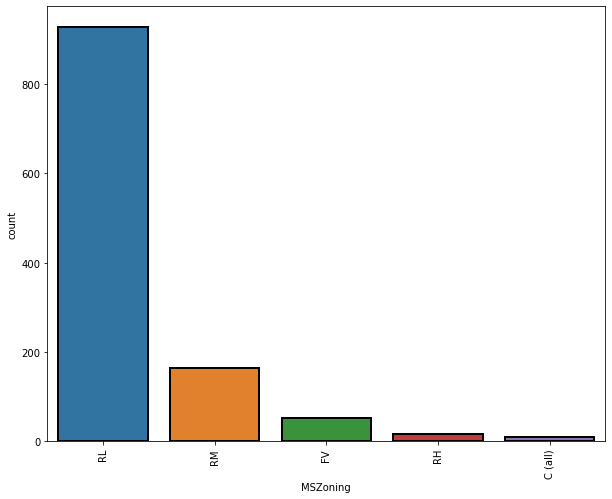

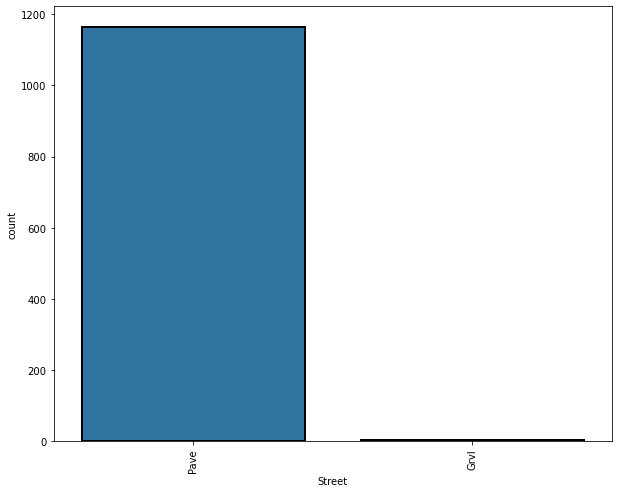

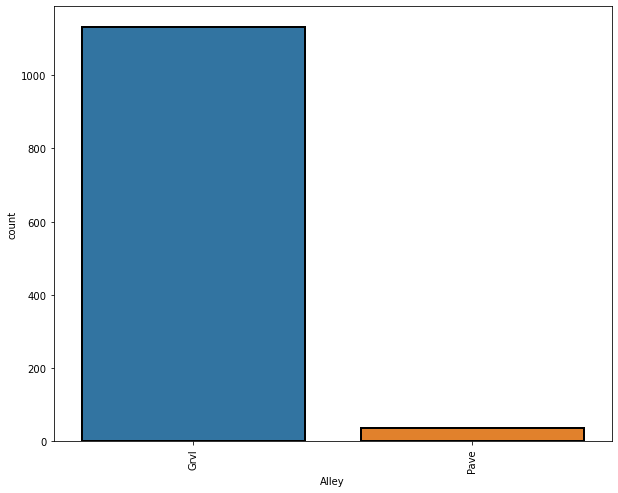

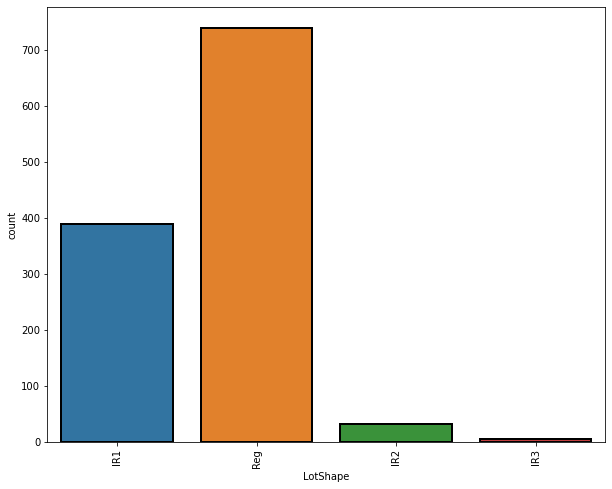

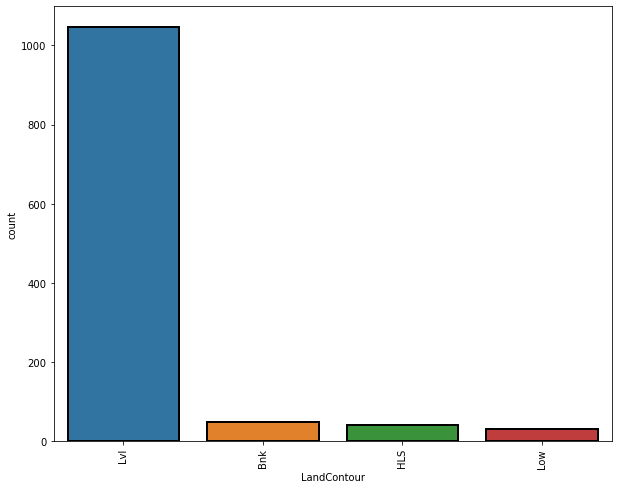

...

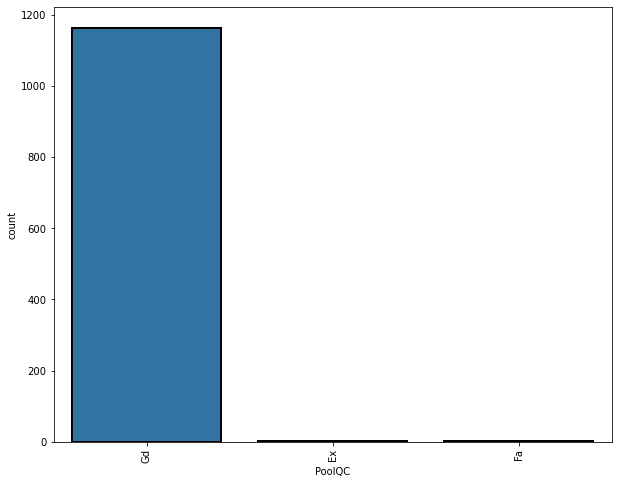

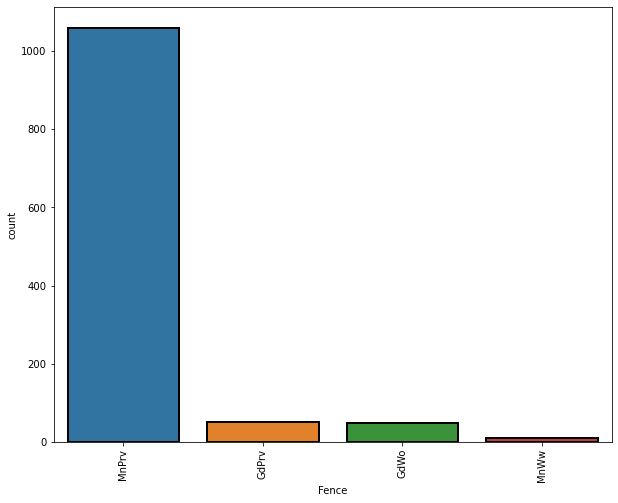

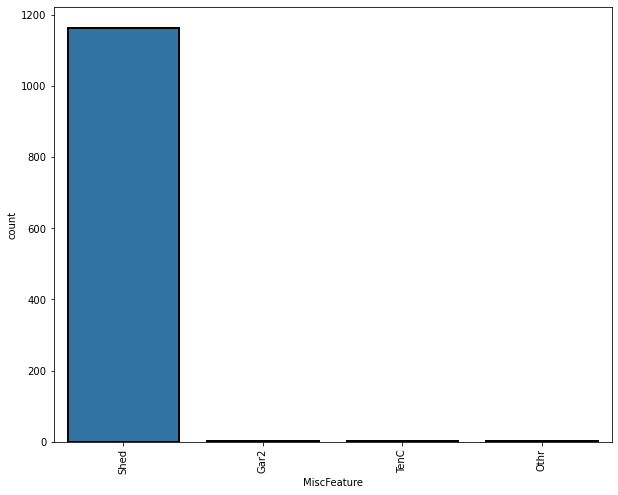

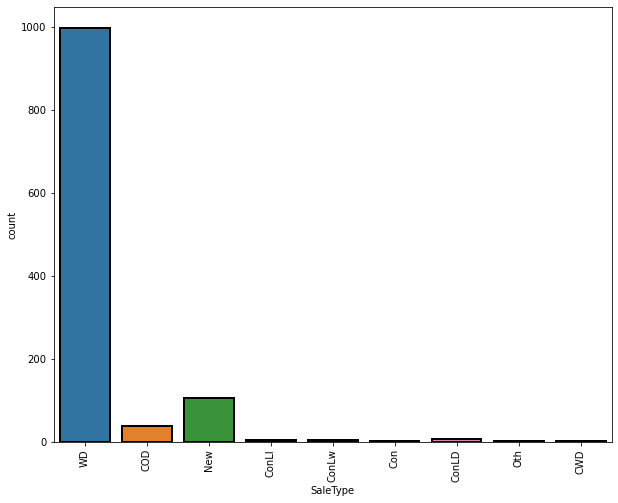

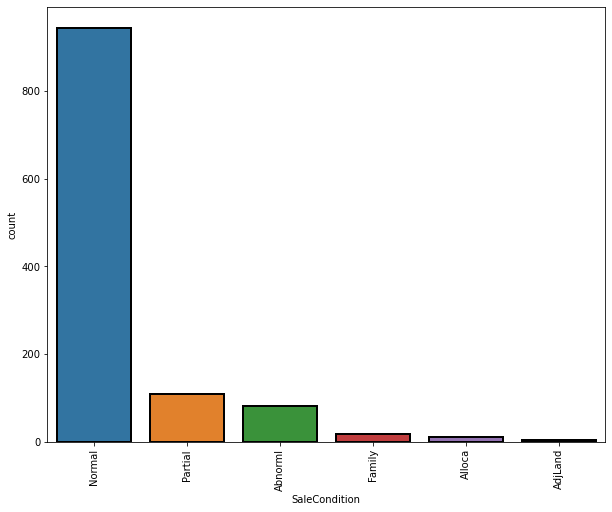

In [456]:
print("---------------------------------UNIVARIATE ANALYSIS FOR CATEGORICAL VARIABLES------------------------------------")
def generate_plot():
    for g in df.select_dtypes(include=['O']):
        plt.figure(figsize=(10,8))
        count_plot = sns.countplot(df[g],edgecolor='black',linewidth=2)
        plt.xticks(rotation=90)
generate_plot()

Exploring numerical variables in df dataset

-----------------------------------UNIVARIATE ANALYSIS FOR NUMERICAL VARIABLES(Histogram)------------------------------------


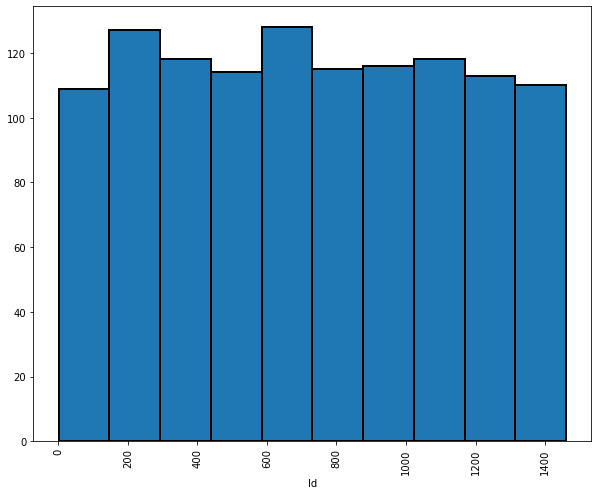

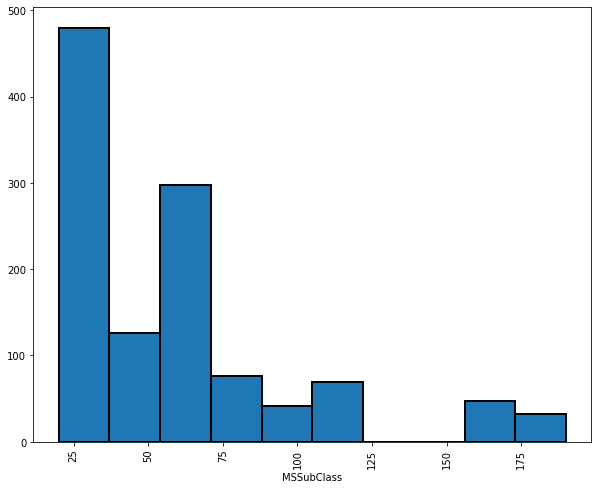

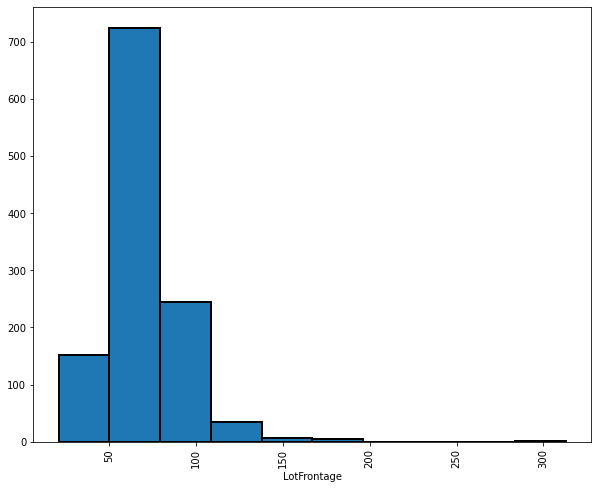

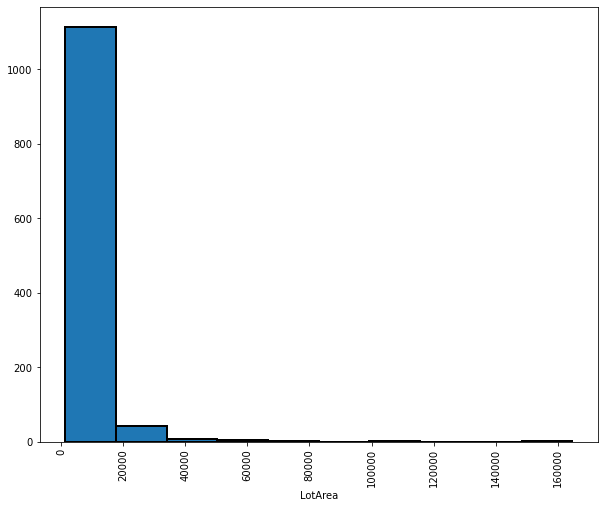

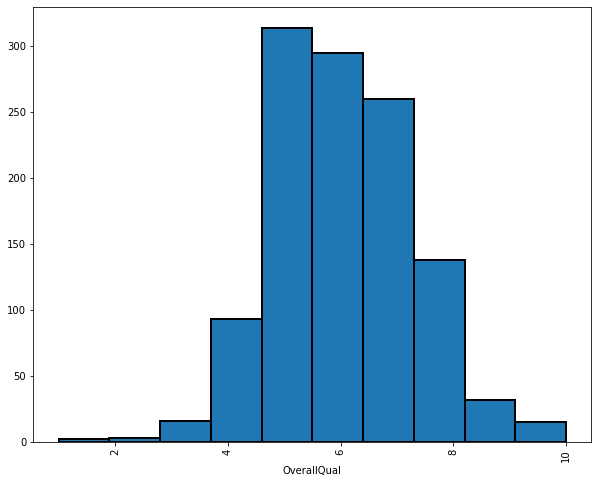

...

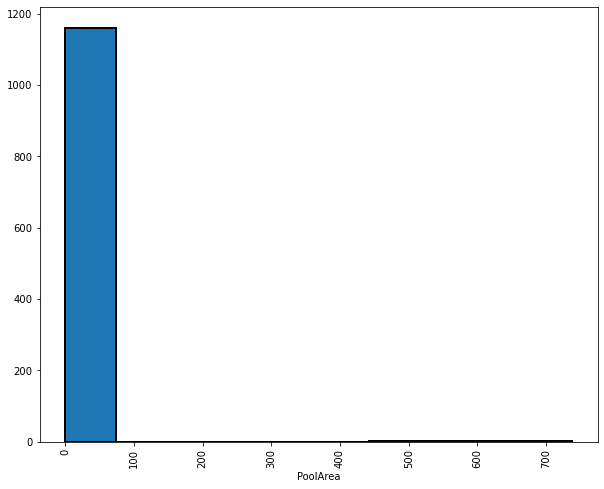

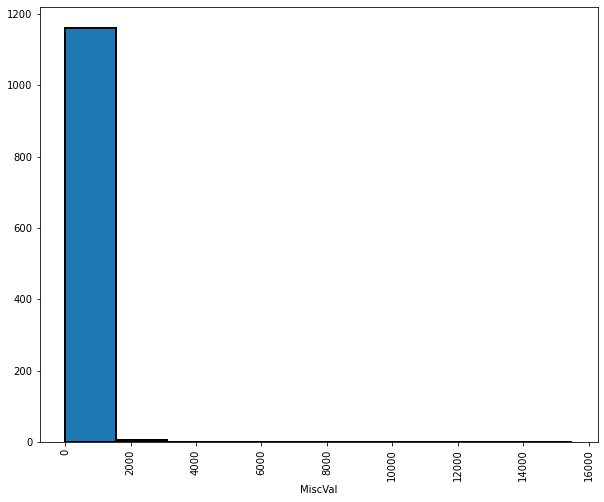

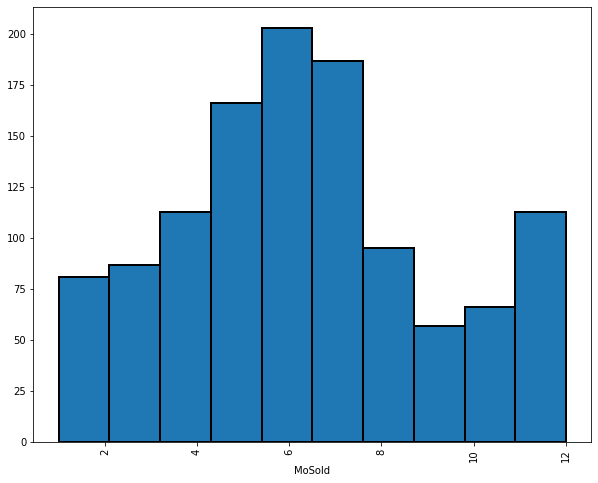

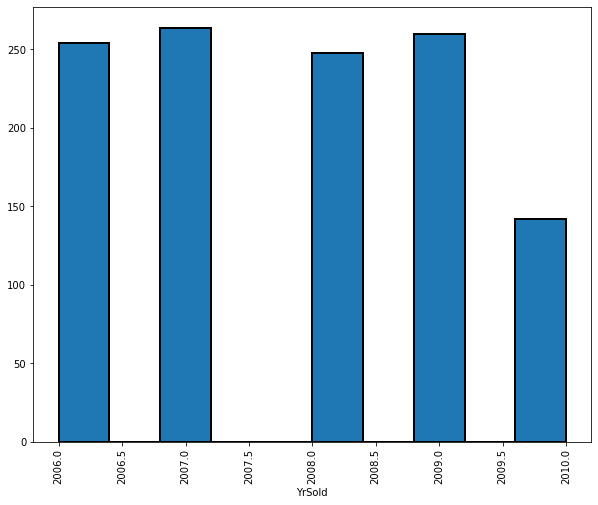

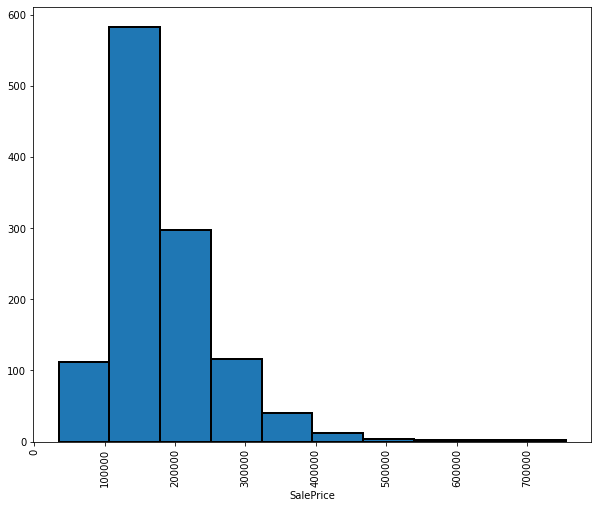

In [457]:
print("-----------------------------------UNIVARIATE ANALYSIS FOR NUMERICAL VARIABLES(Histogram)------------------------------------")
def generate_plot_numerical():
    for gg in df.select_dtypes(include=['number']):
        plt.figure(figsize=(10,8))
        hist_ = plt.hist(df[gg],edgecolor='black',linewidth=2)
        plt.xlabel(gg)
        plt.xticks(rotation=90)
generate_plot_numerical()

I have plotted histogram for numerical variables and now I will plot density plot for numerical variables also.

----------------------------------UNIVARIATE ANALYSIS FOR NUMERICAL VARIABLES(Distplot)------------------------------------


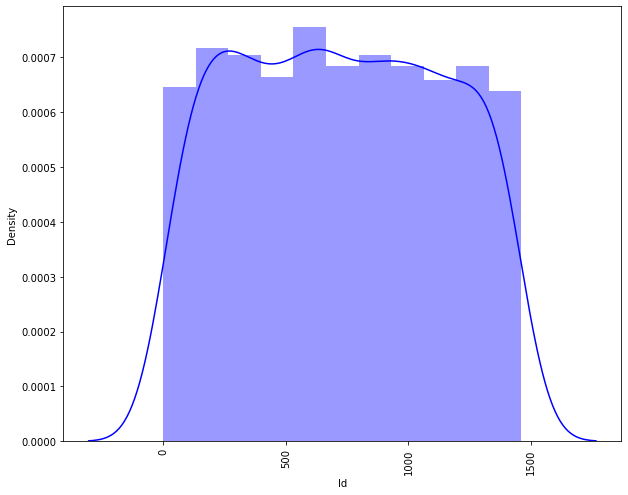

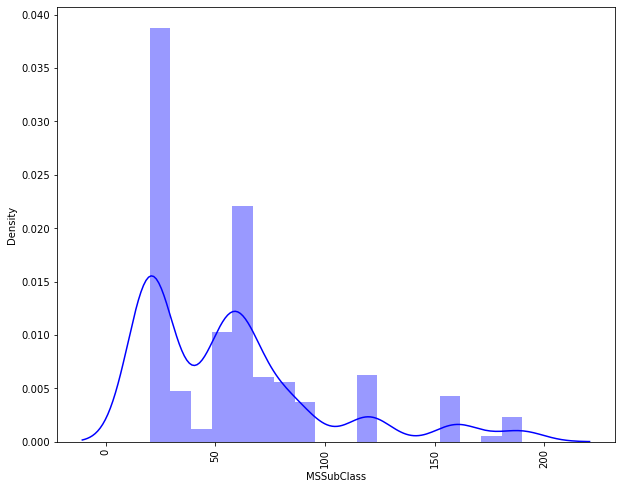

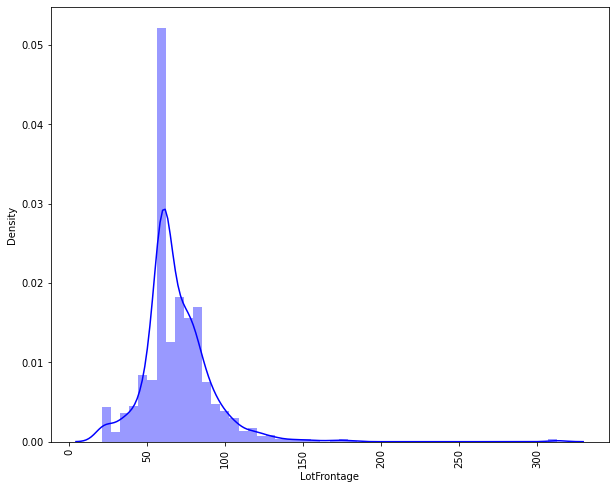

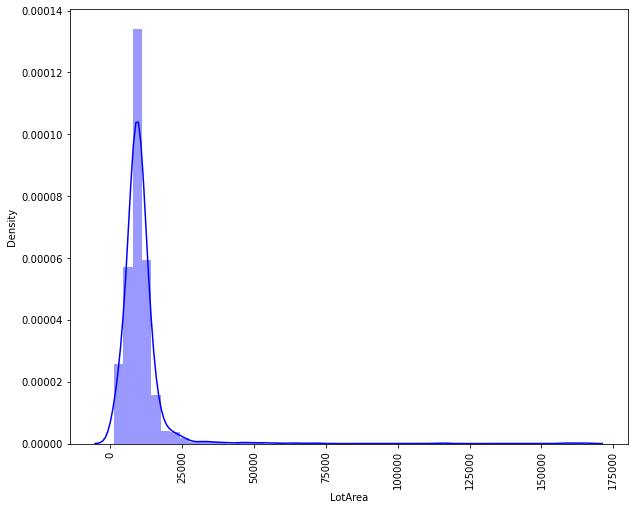

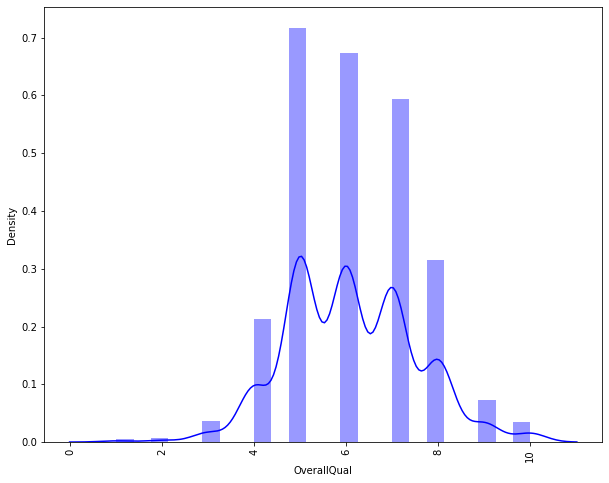

...

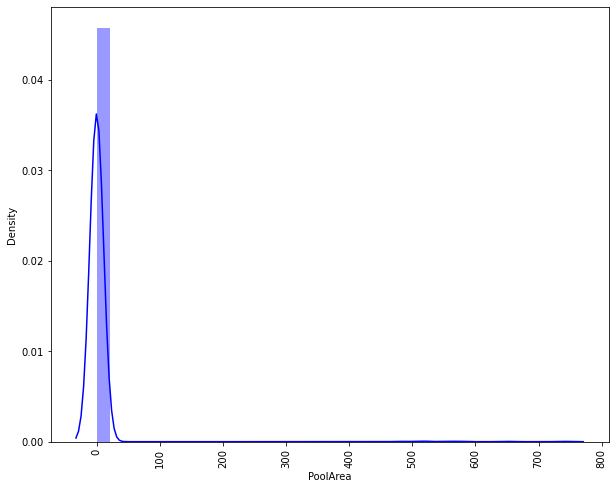

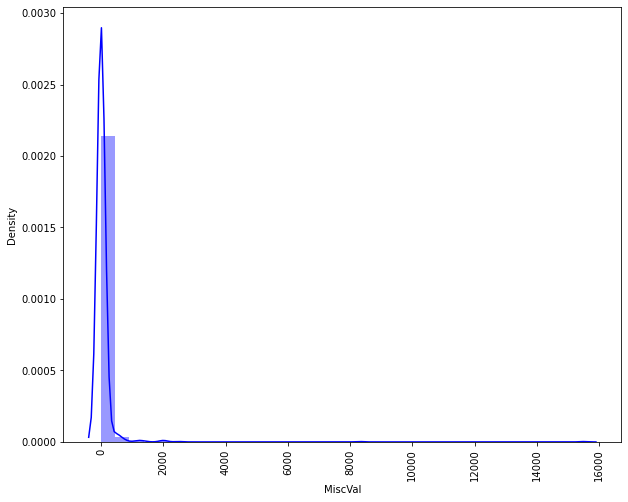

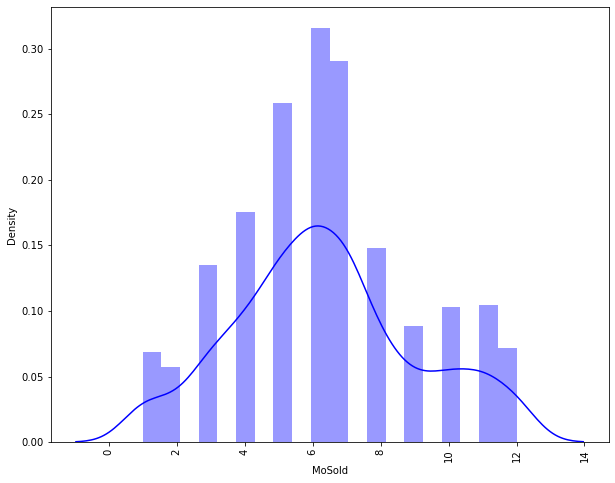

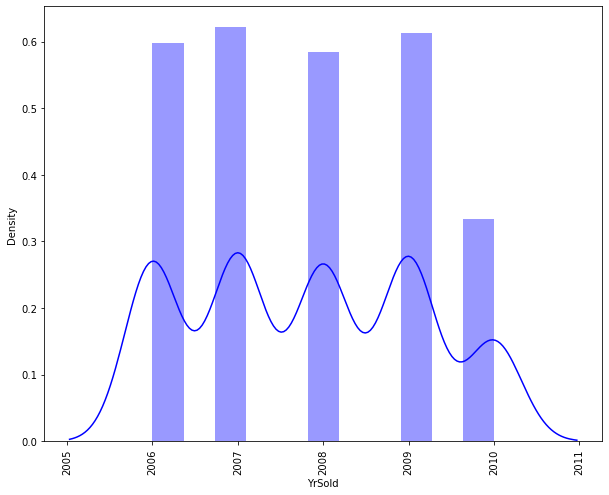

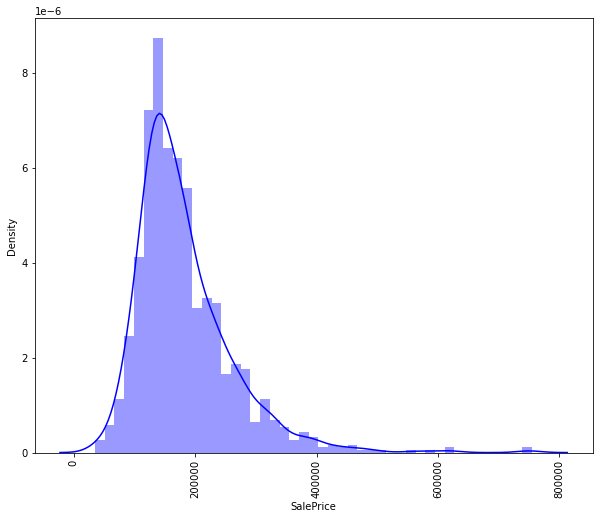

In [458]:
print("----------------------------------UNIVARIATE ANALYSIS FOR NUMERICAL VARIABLES(Distplot)------------------------------------")
def generate_plot_numerical_1():
    for gg1 in df.select_dtypes(include=['number']):
        plt.figure(figsize=(10,8))
        dist_ = sns.distplot(df[gg1],color='blue')
        plt.xlabel(gg1)
        plt.xticks(rotation=90)
generate_plot_numerical_1()

# BIVARIATE ANALYSIS

In [459]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,60.0,4928,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,1,2010,COD,Normal,190000
4,422,20,RL,60.0,16635,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2009,WD,Normal,215000


Here the target variable is SalePrice

I will plot bar plot for dataset df with hue being the target variable

-----------------------------------BIVARIATE ANALYSIS(Barplot)------------------------------------


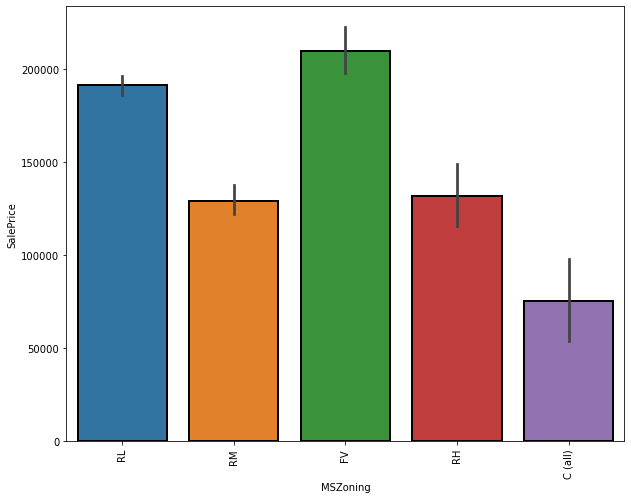

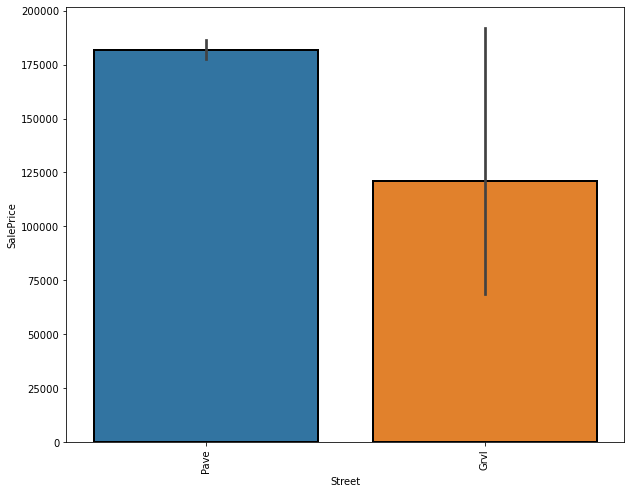

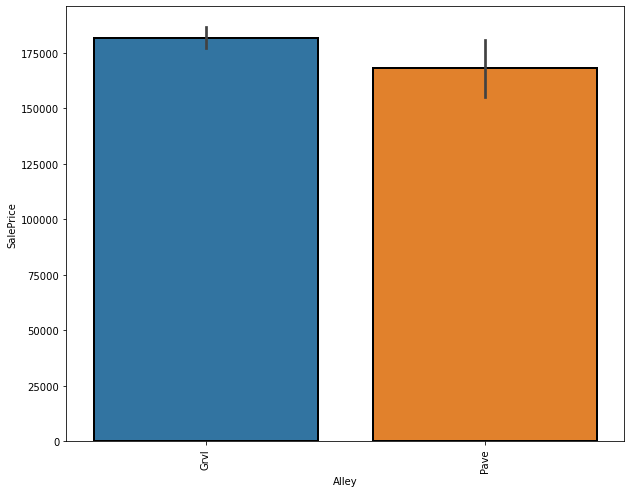

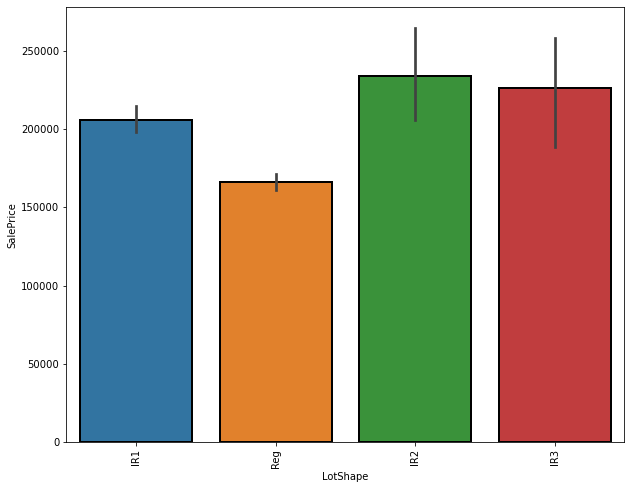

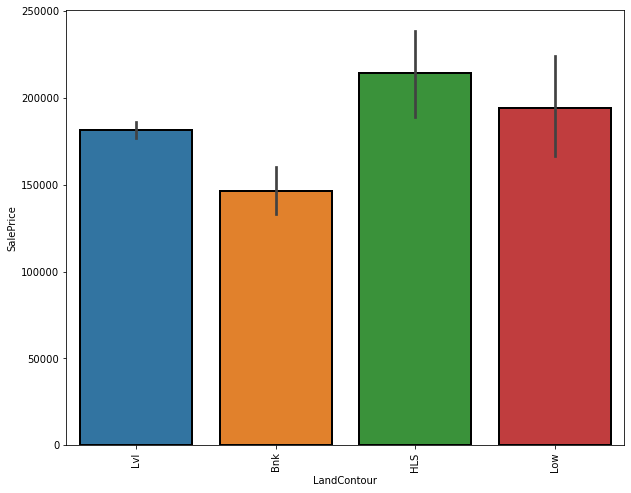

...

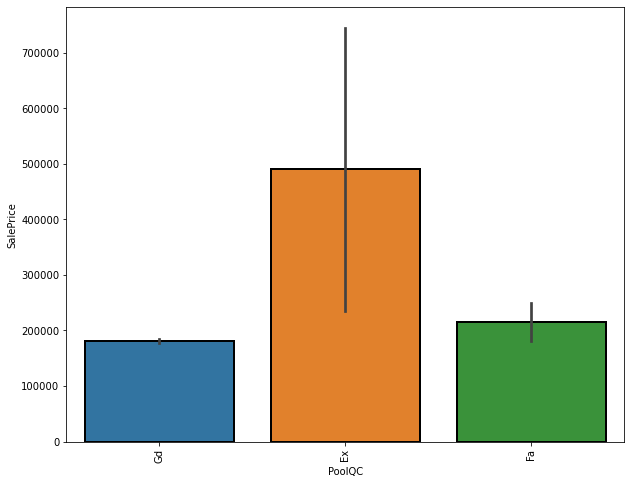

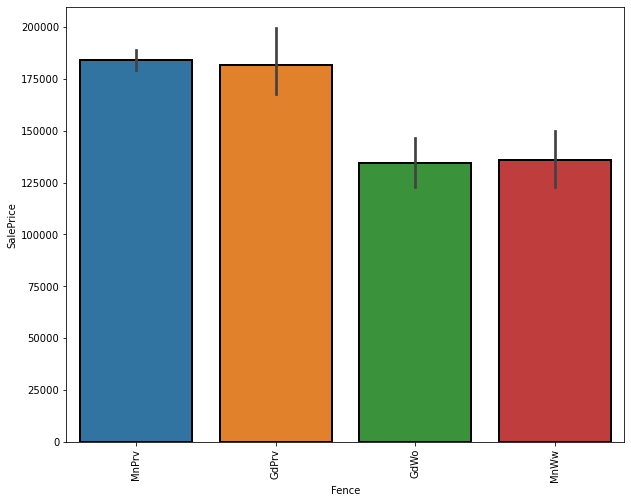

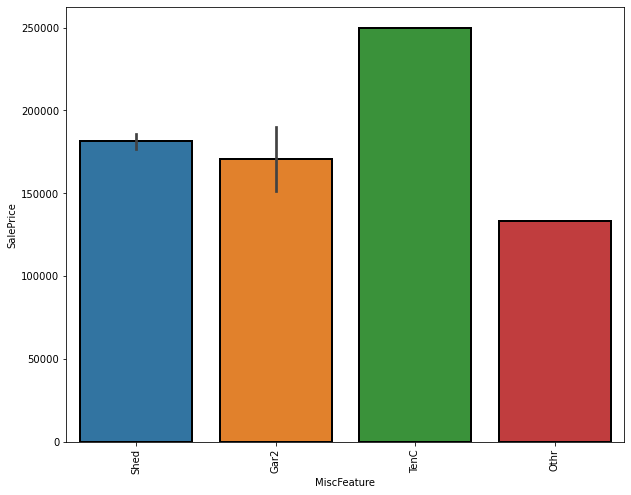

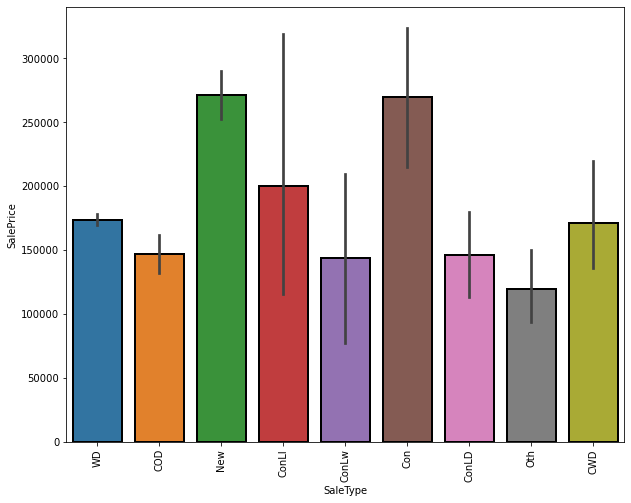

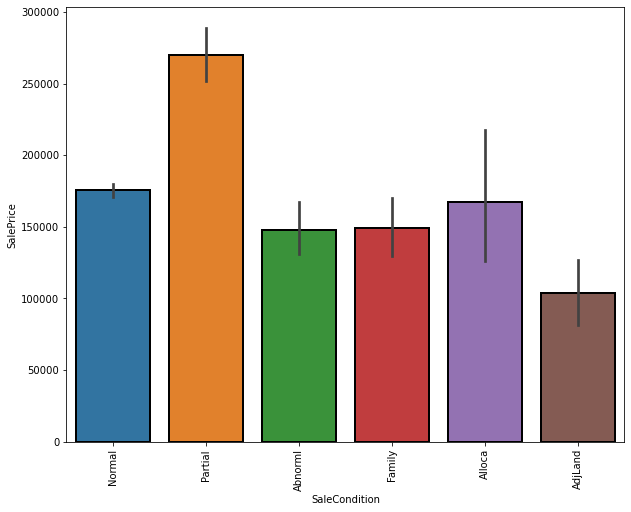

In [460]:
print("-----------------------------------BIVARIATE ANALYSIS(Barplot)------------------------------------")
def generate_barplot():
    for b in df.select_dtypes(include=['O']):
        plt.figure(figsize=(10,8))
        bar_ = sns.barplot(df[b],df['SalePrice'],edgecolor='black',linewidth=2)
        plt.xlabel(b)
        plt.xticks(rotation=90)
generate_barplot()

Plotting line plot for categorical variable with SalesPrice

-----------------------------------BIVARIATE ANALYSIS(LinePlot)------------------------------------


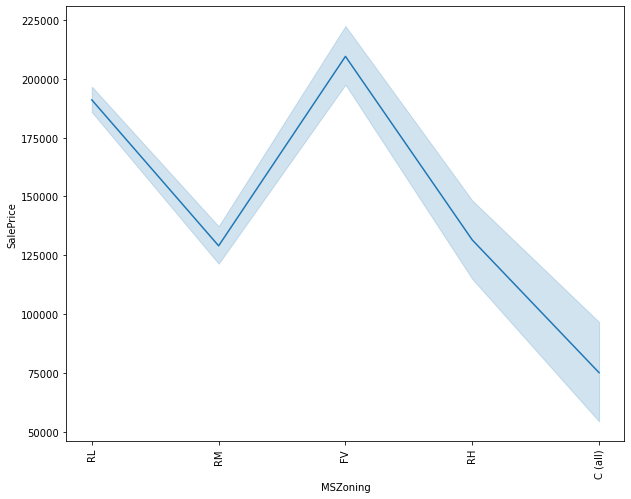

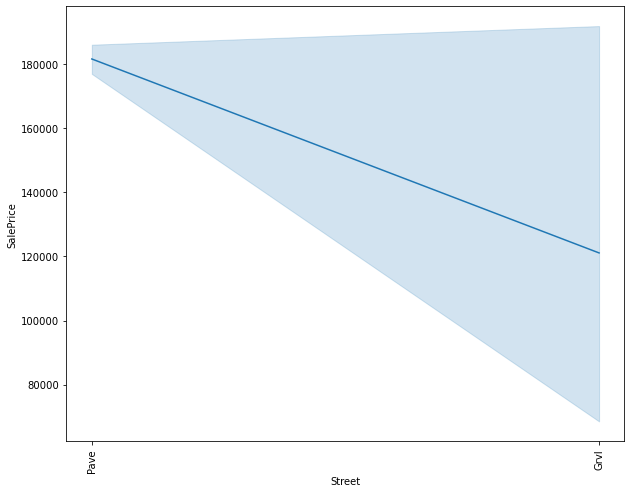

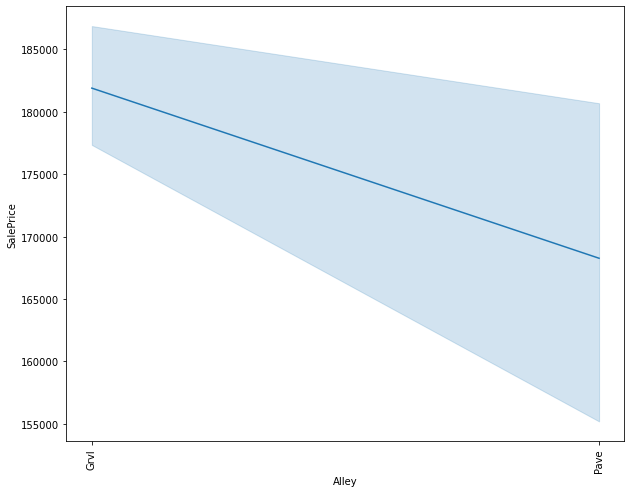

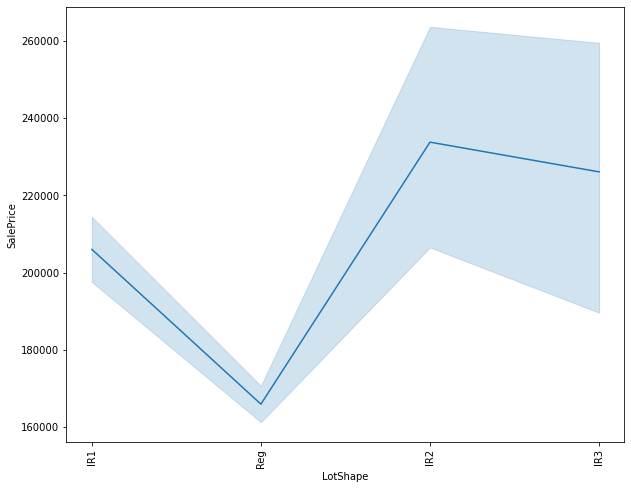

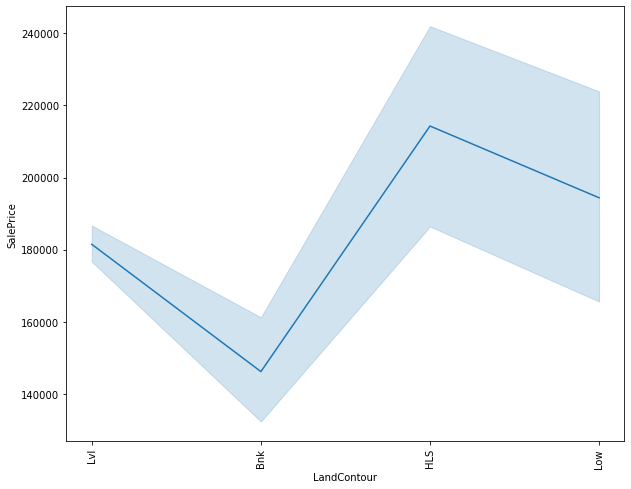

...

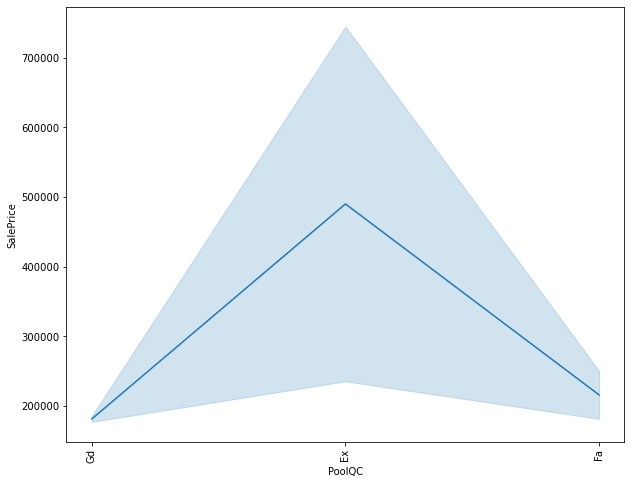

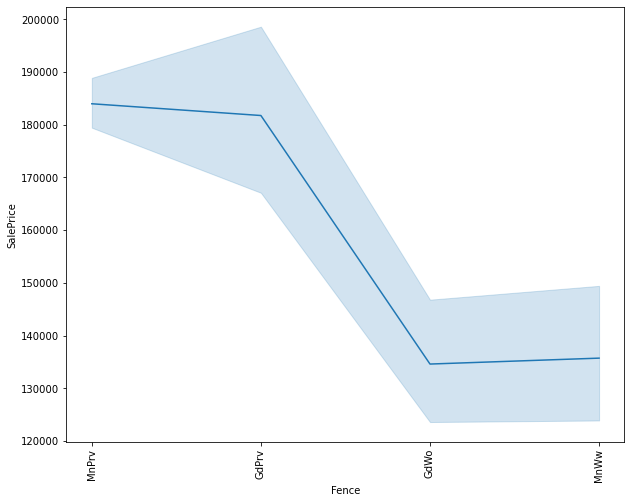

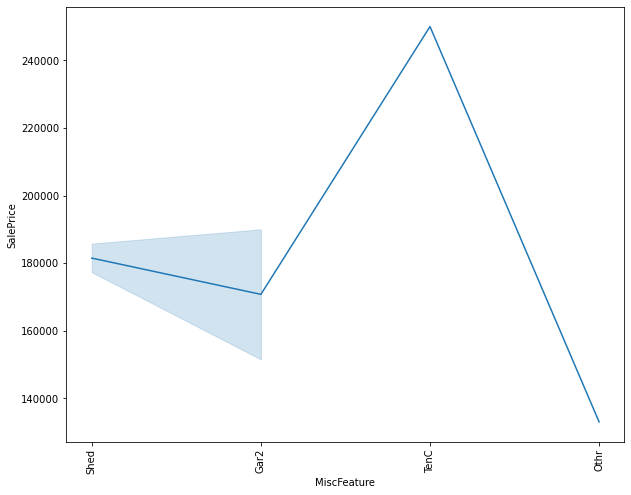

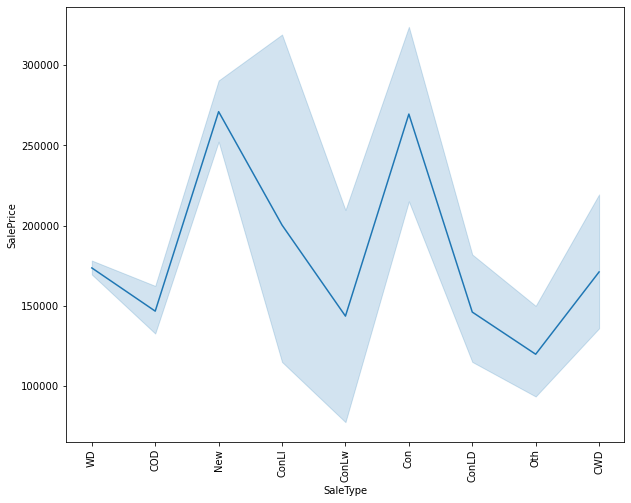

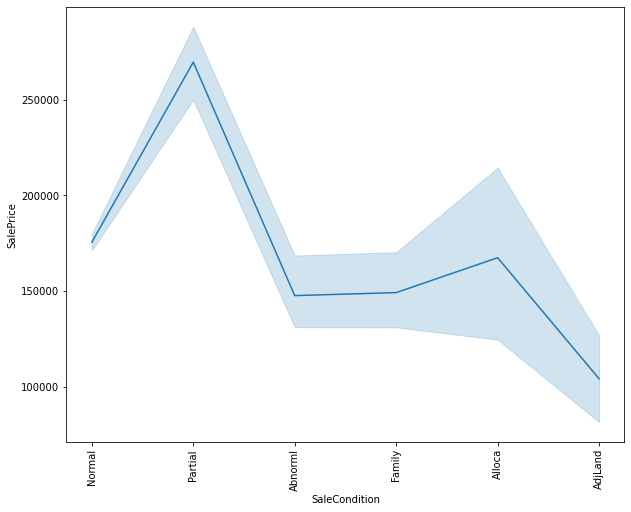

In [461]:
print("-----------------------------------BIVARIATE ANALYSIS(LinePlot)------------------------------------")
def generate_lineplot():
    for l in df.select_dtypes(include=['O']):
        plt.figure(figsize=(10,8))
        line_ = sns.lineplot(df[l],df['SalePrice'])
        plt.xlabel(l)
        plt.xticks(rotation=90)
generate_lineplot()

Plotting line plot for numerical variable with SalesPrice

-----------------------------------BIVARIATE ANALYSIS(LinePlot)------------------------------------


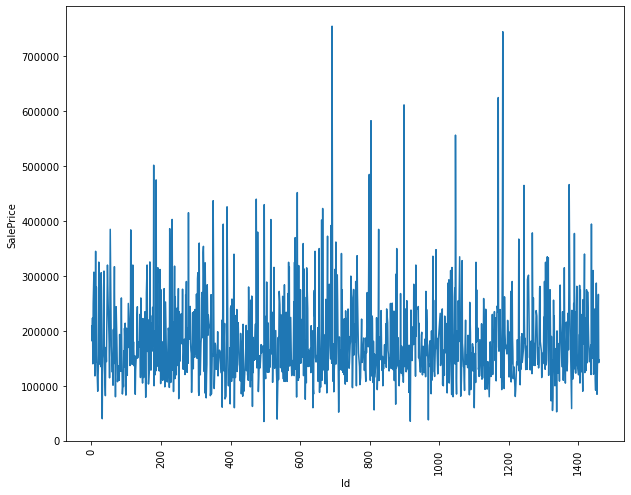

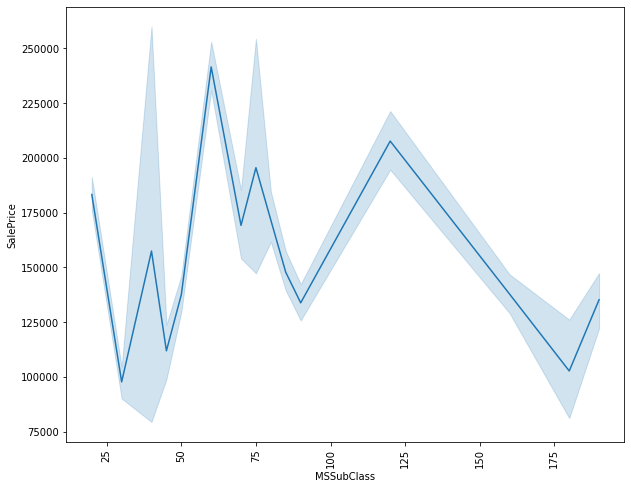

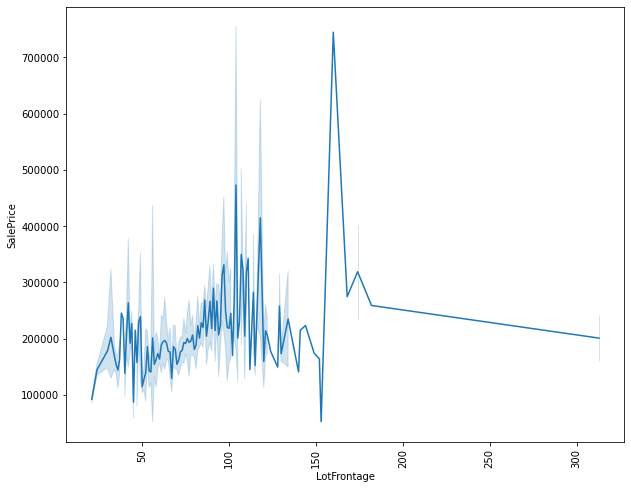

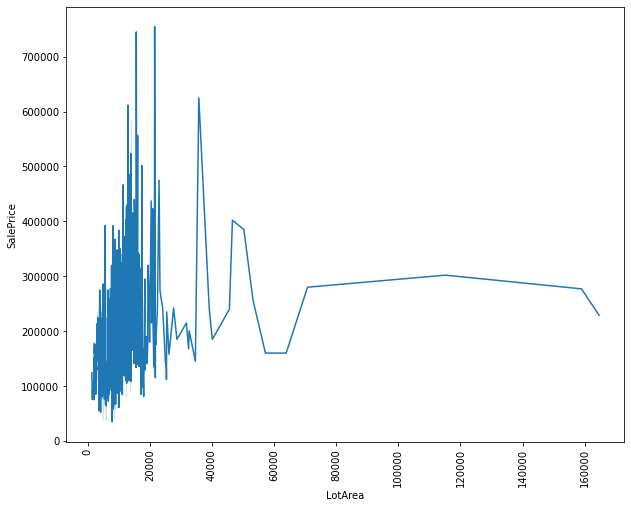

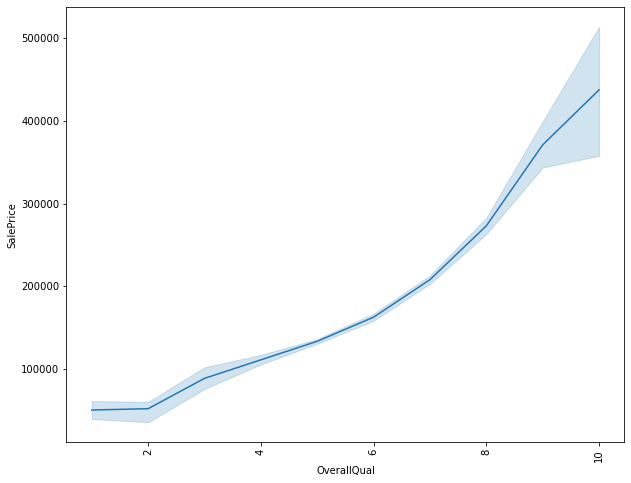

...

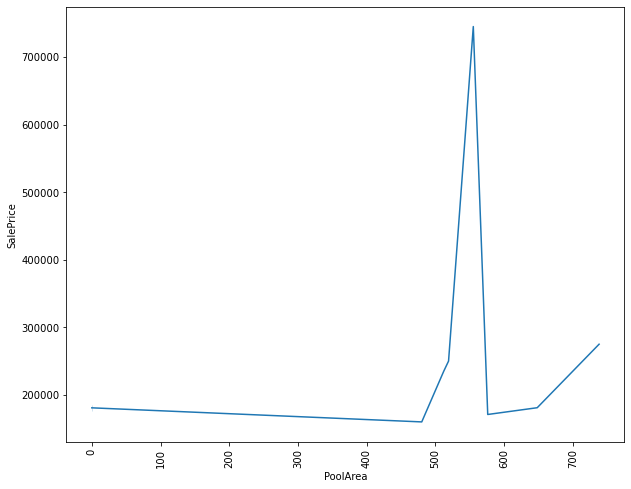

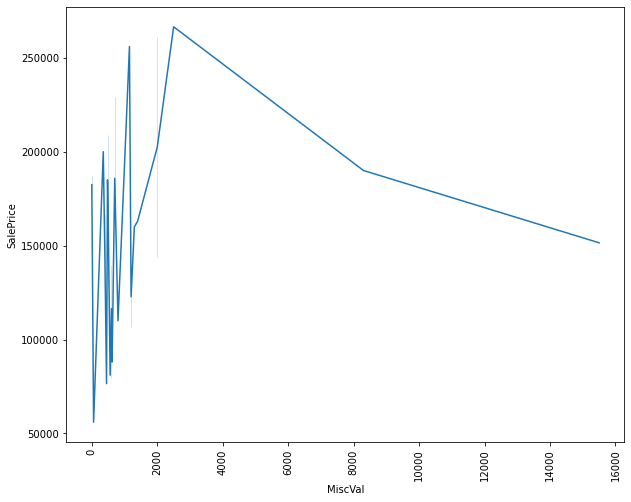

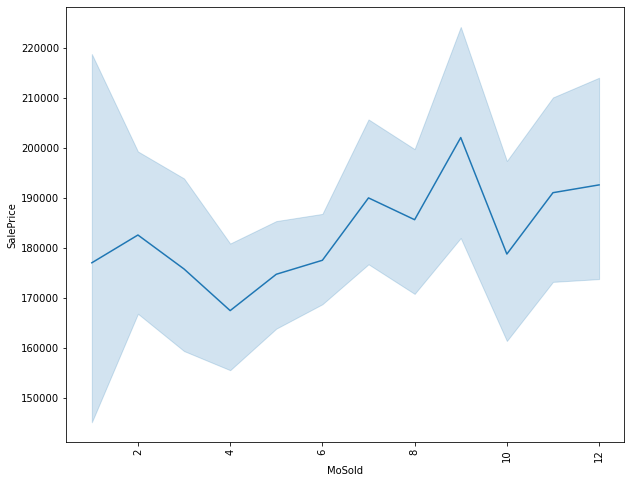

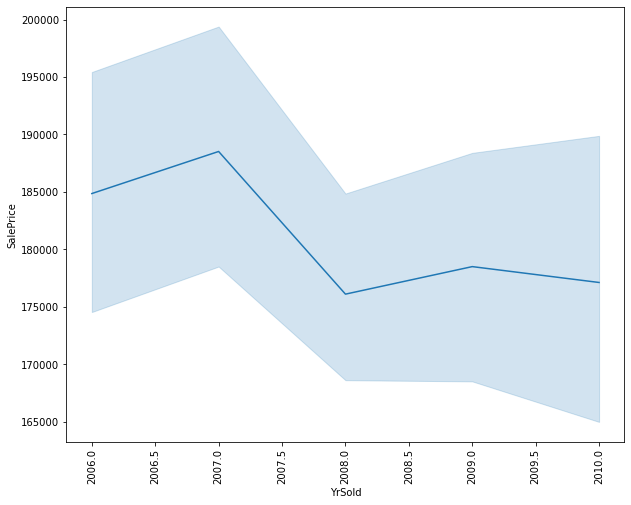

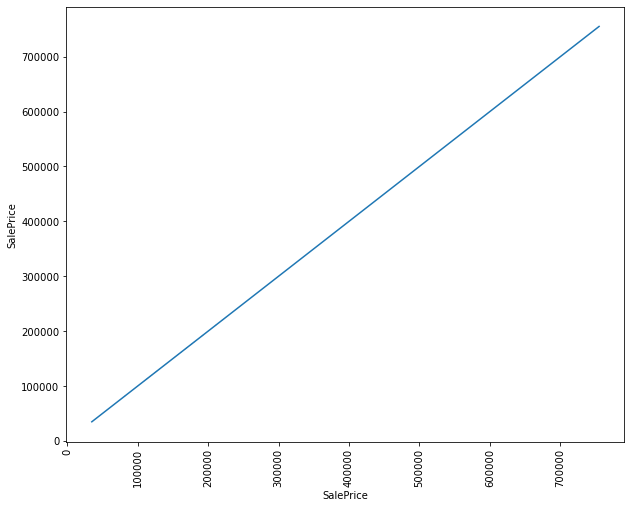

In [462]:
print("-----------------------------------BIVARIATE ANALYSIS(LinePlot)------------------------------------")
def generate_lineplot_numerical():
    for lm in df.select_dtypes(include=['number']):
        plt.figure(figsize=(10,8))
        line_m = sns.lineplot(df[lm],df['SalePrice'])
        plt.xlabel(lm)
        plt.xticks(rotation=90)
generate_lineplot_numerical()

Plotting joint plot for categorical variables with Sales Price

-----------------------------------BIVARIATE ANALYSIS(JointPlot)------------------------------------


<Figure size 720x576 with 0 Axes>

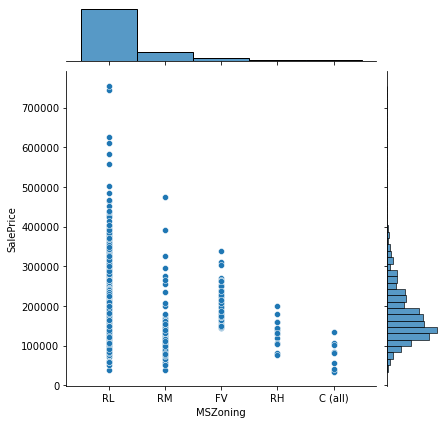

<Figure size 720x576 with 0 Axes>

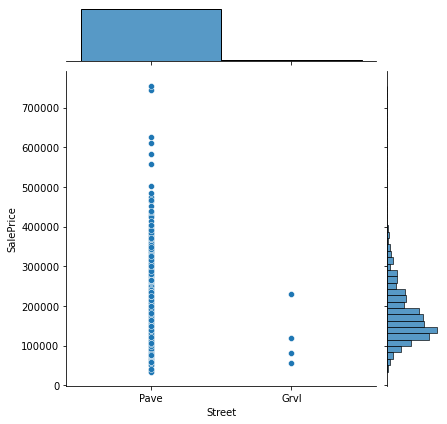

<Figure size 720x576 with 0 Axes>

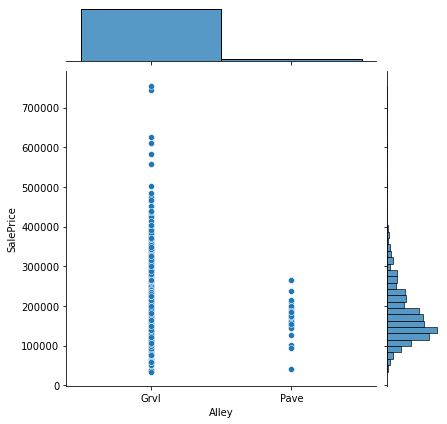

<Figure size 720x576 with 0 Axes>

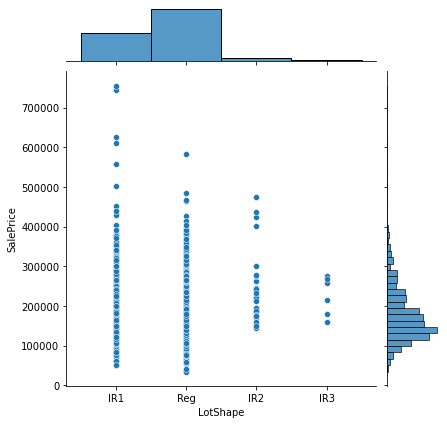

<Figure size 720x576 with 0 Axes>

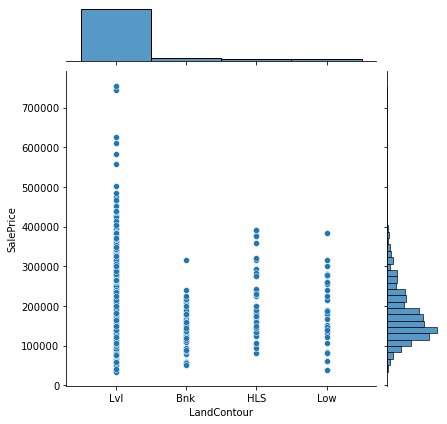

<Figure size 720x576 with 0 Axes>

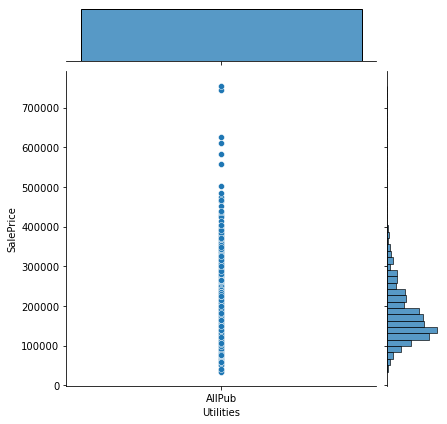

<Figure size 720x576 with 0 Axes>

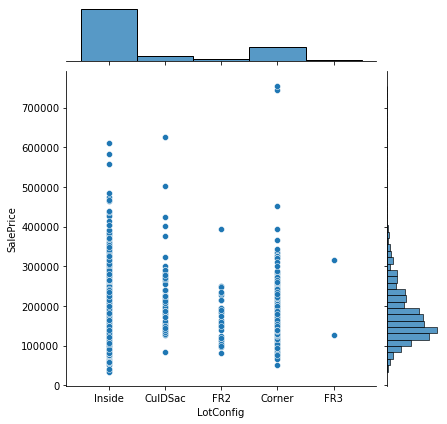

<Figure size 720x576 with 0 Axes>

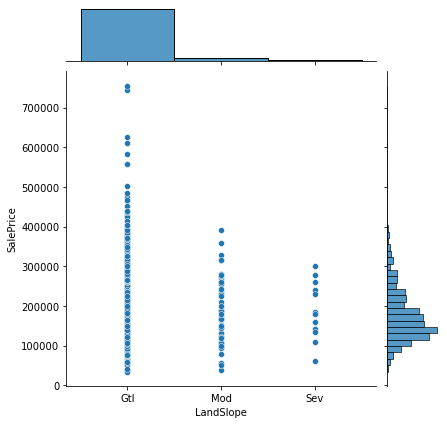

<Figure size 720x576 with 0 Axes>

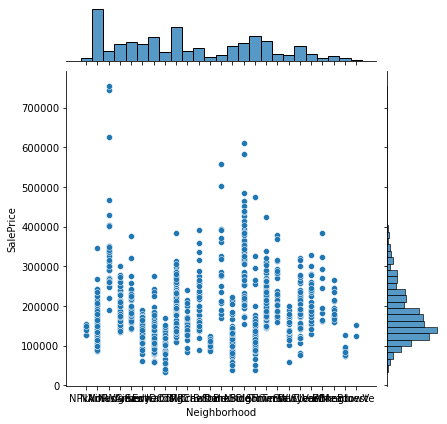

<Figure size 720x576 with 0 Axes>

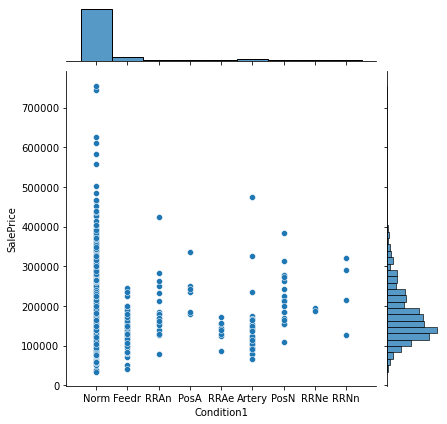

<Figure size 720x576 with 0 Axes>

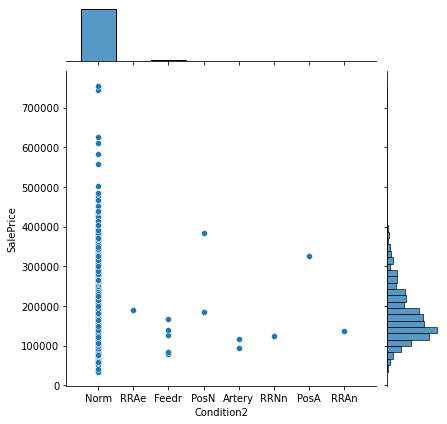

<Figure size 720x576 with 0 Axes>

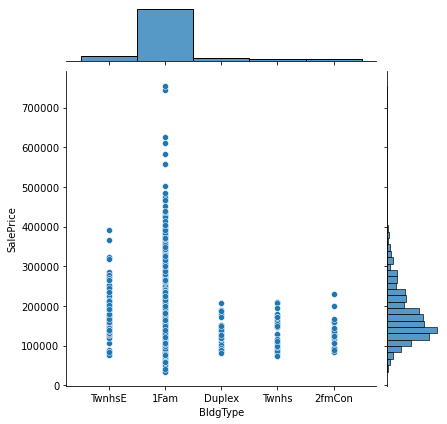

<Figure size 720x576 with 0 Axes>

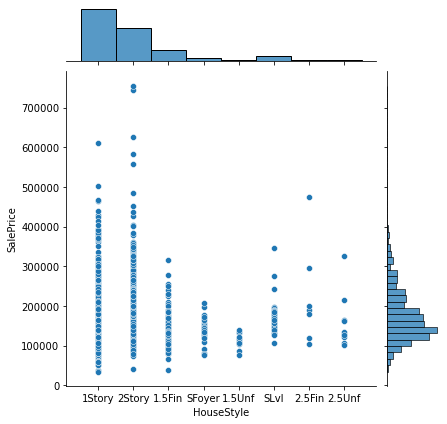

<Figure size 720x576 with 0 Axes>

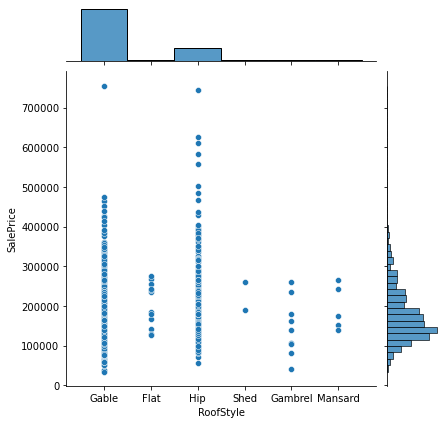

<Figure size 720x576 with 0 Axes>

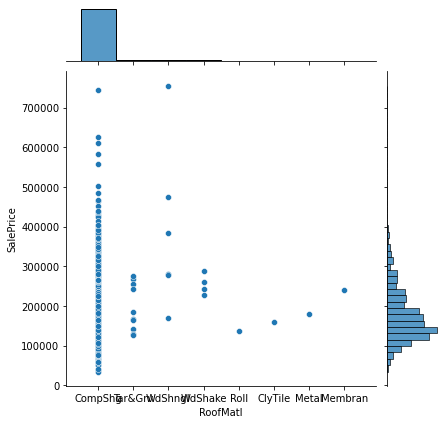

<Figure size 720x576 with 0 Axes>

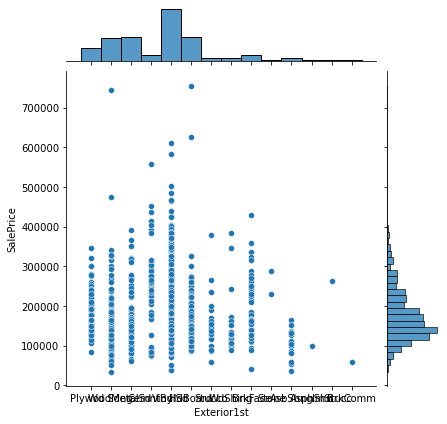

<Figure size 720x576 with 0 Axes>

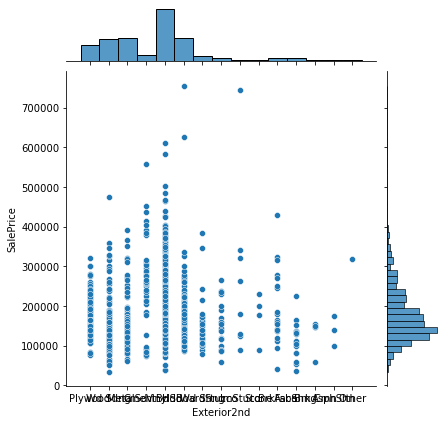

<Figure size 720x576 with 0 Axes>

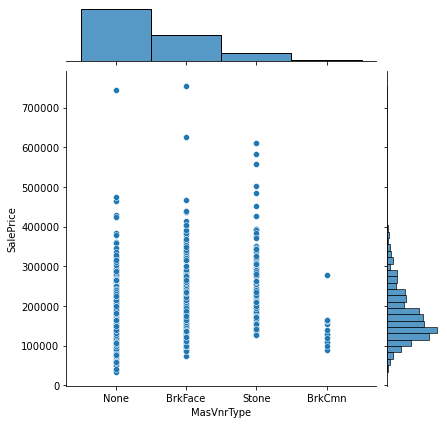

<Figure size 720x576 with 0 Axes>

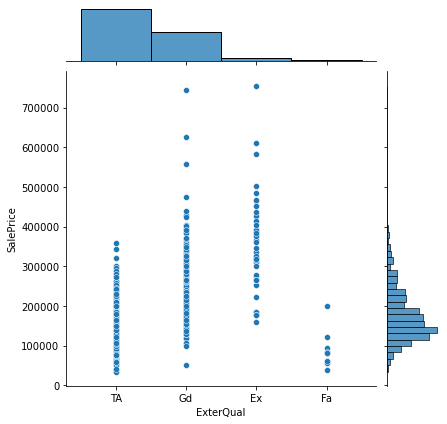

<Figure size 720x576 with 0 Axes>

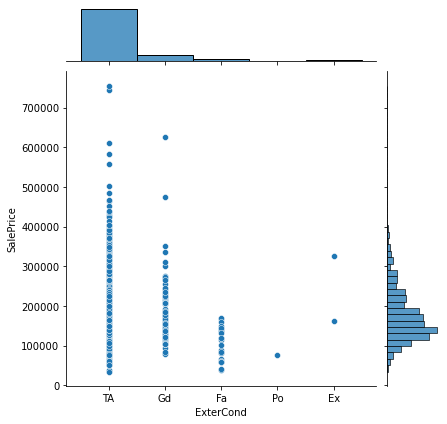

<Figure size 720x576 with 0 Axes>

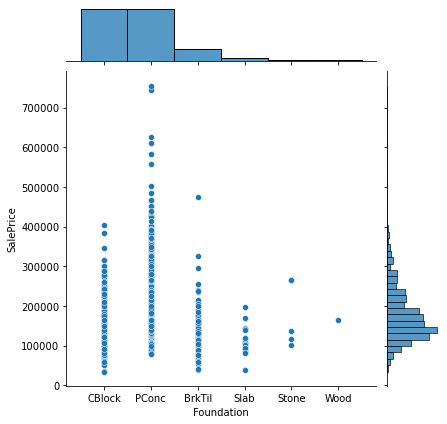

<Figure size 720x576 with 0 Axes>

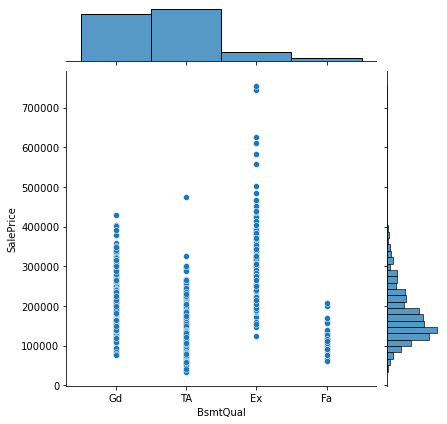

<Figure size 720x576 with 0 Axes>

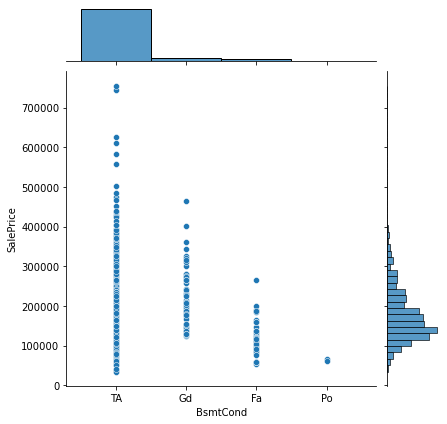

<Figure size 720x576 with 0 Axes>

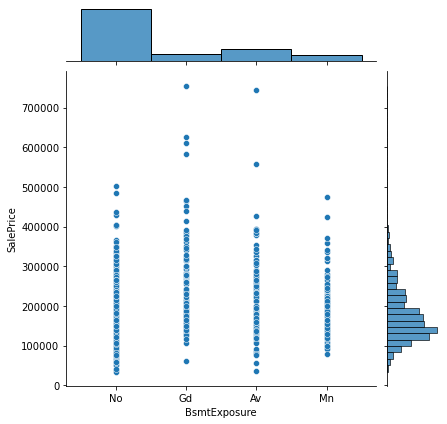

<Figure size 720x576 with 0 Axes>

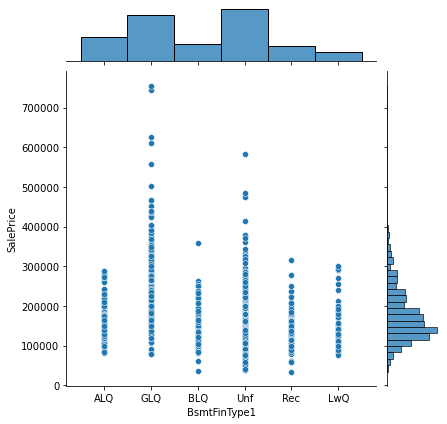

<Figure size 720x576 with 0 Axes>

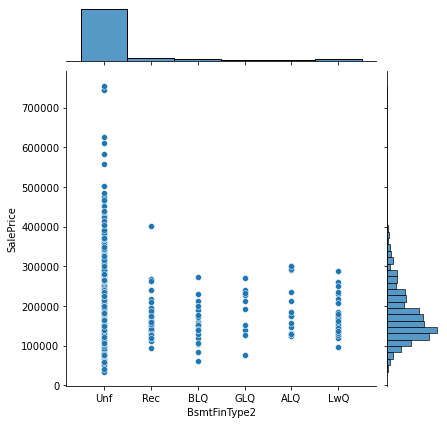

<Figure size 720x576 with 0 Axes>

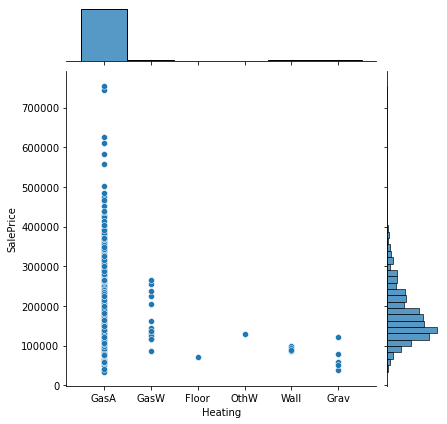

<Figure size 720x576 with 0 Axes>

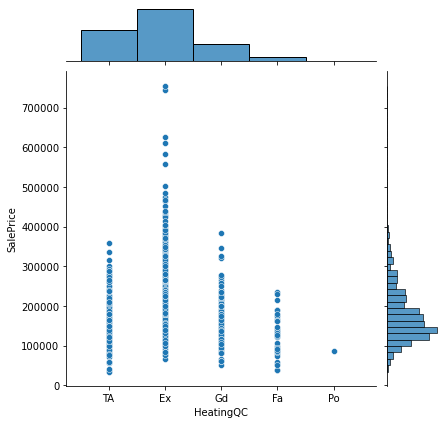

<Figure size 720x576 with 0 Axes>

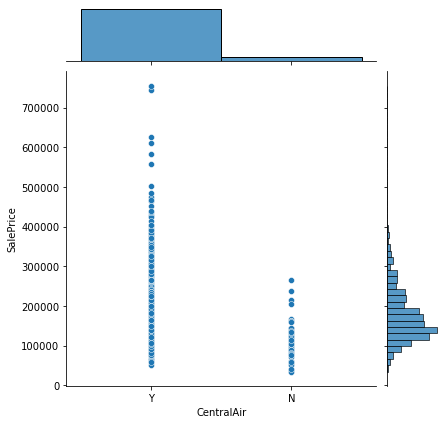

<Figure size 720x576 with 0 Axes>

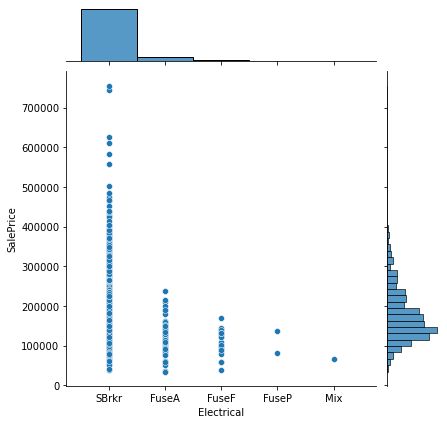

<Figure size 720x576 with 0 Axes>

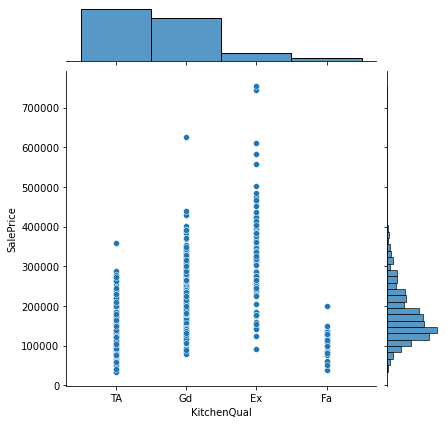

<Figure size 720x576 with 0 Axes>

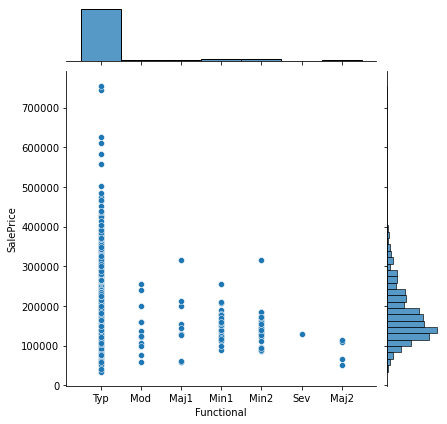

<Figure size 720x576 with 0 Axes>

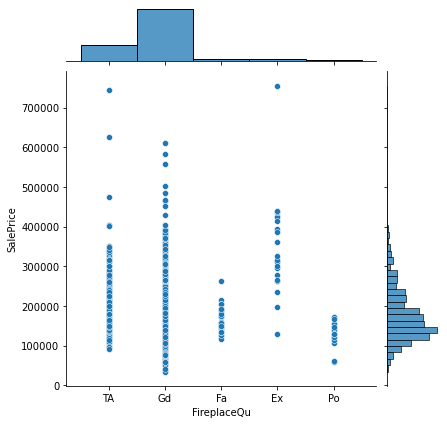

<Figure size 720x576 with 0 Axes>

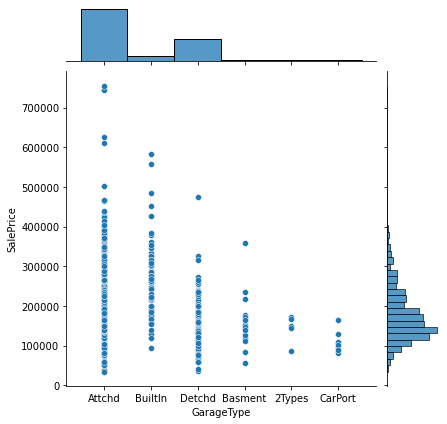

<Figure size 720x576 with 0 Axes>

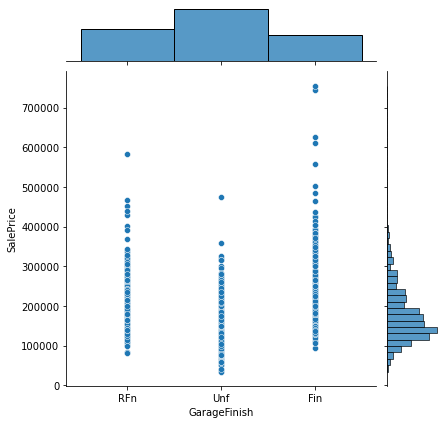

<Figure size 720x576 with 0 Axes>

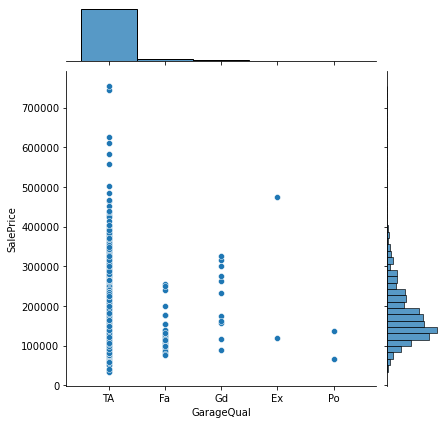

<Figure size 720x576 with 0 Axes>

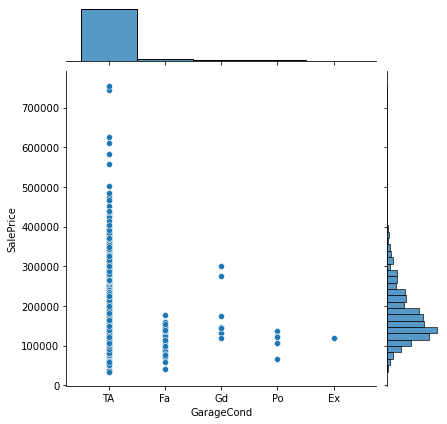

<Figure size 720x576 with 0 Axes>

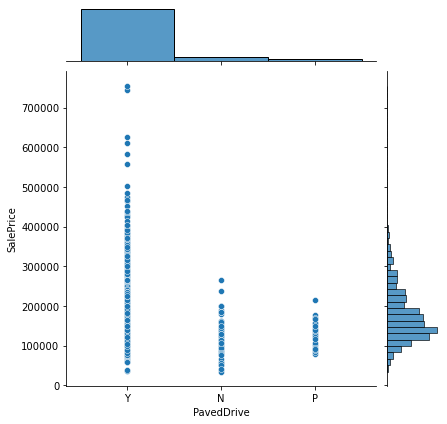

<Figure size 720x576 with 0 Axes>

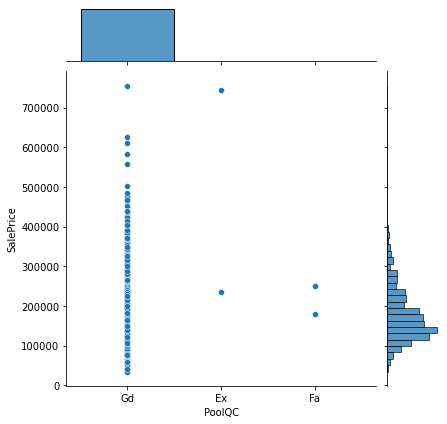

<Figure size 720x576 with 0 Axes>

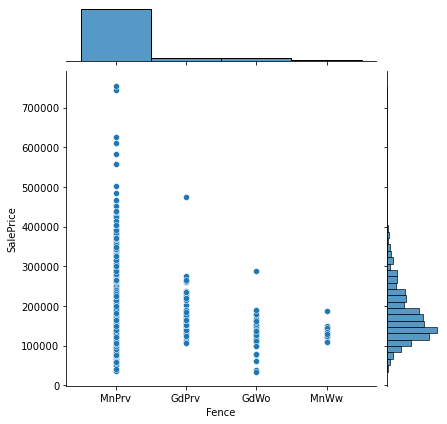

<Figure size 720x576 with 0 Axes>

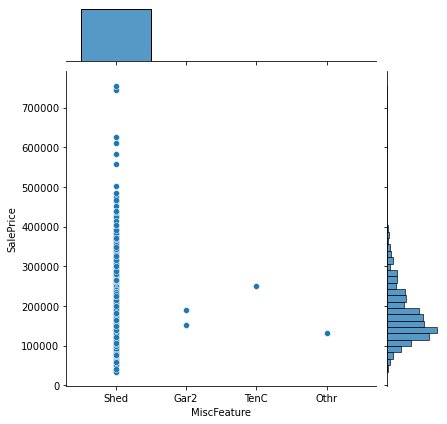

<Figure size 720x576 with 0 Axes>

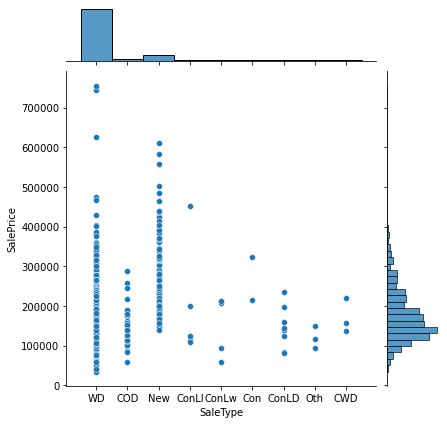

<Figure size 720x576 with 0 Axes>

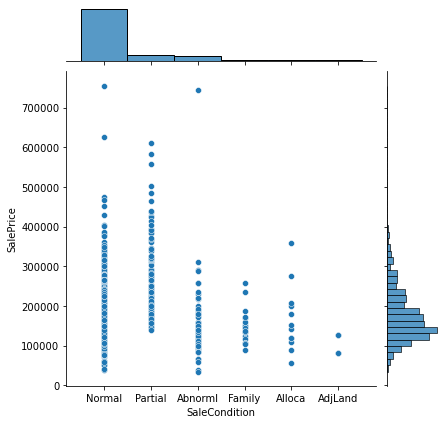

In [463]:
print("-----------------------------------BIVARIATE ANALYSIS(JointPlot)------------------------------------")
def generate_jointplot():
    for j in df.select_dtypes(include=['O']):
        plt.figure(figsize=(10,8))
        joint = sns.jointplot(df[j],df['SalePrice'])
        plt.xlabel(j)
generate_jointplot()

Plotting jointplot for numerical variables with Salesprice

-----------------------------------BIVARIATE ANALYSIS(JointPlot)------------------------------------


<Figure size 720x576 with 0 Axes>

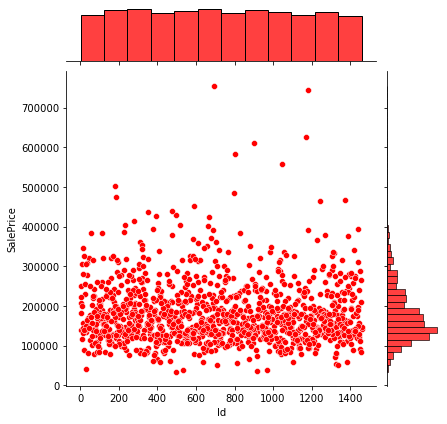

<Figure size 720x576 with 0 Axes>

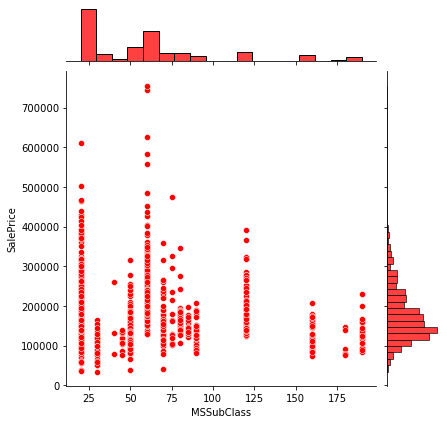

<Figure size 720x576 with 0 Axes>

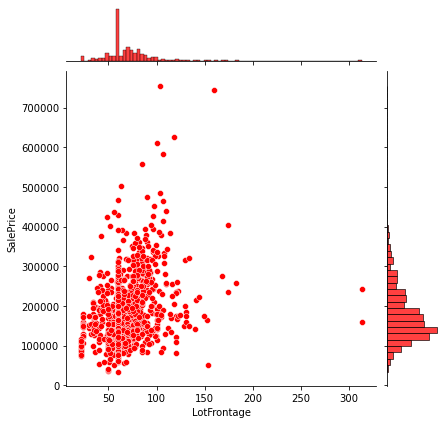

<Figure size 720x576 with 0 Axes>

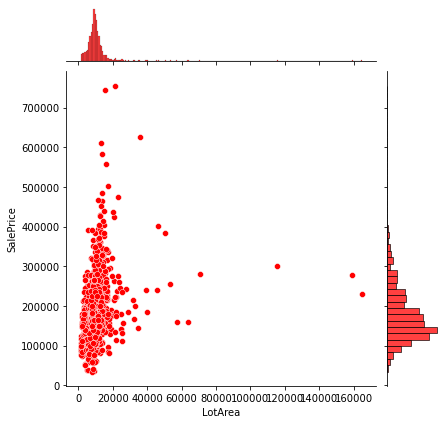

<Figure size 720x576 with 0 Axes>

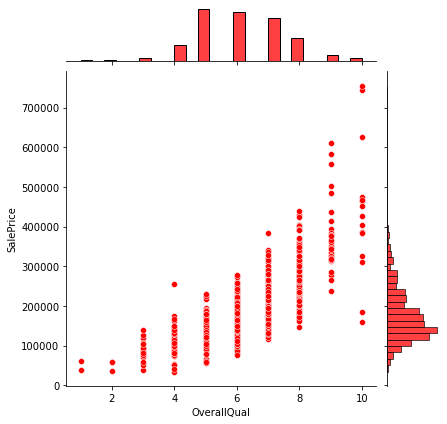

<Figure size 720x576 with 0 Axes>

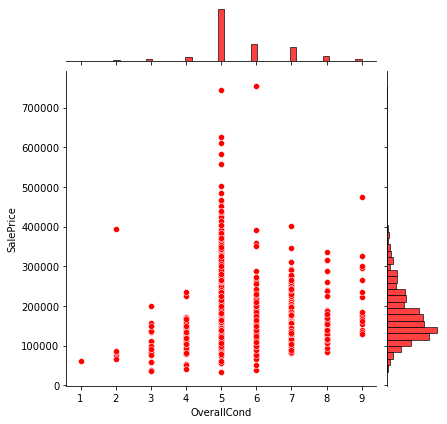

<Figure size 720x576 with 0 Axes>

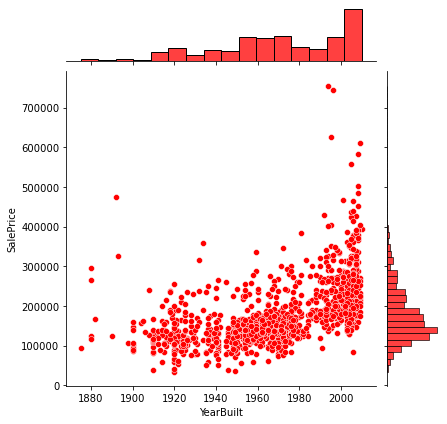

<Figure size 720x576 with 0 Axes>

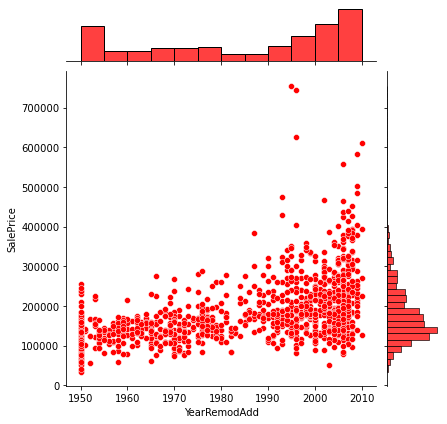

<Figure size 720x576 with 0 Axes>

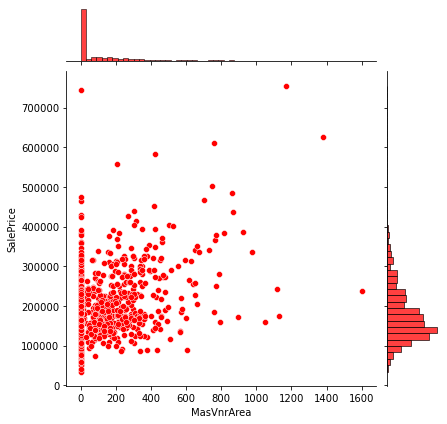

<Figure size 720x576 with 0 Axes>

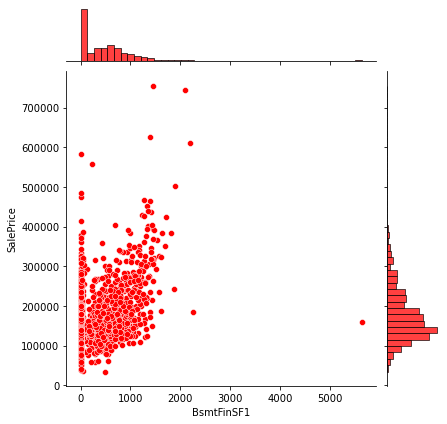

<Figure size 720x576 with 0 Axes>

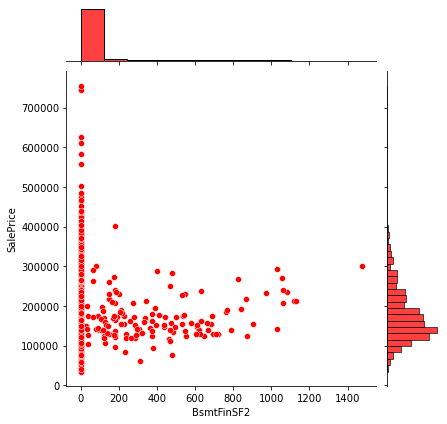

<Figure size 720x576 with 0 Axes>

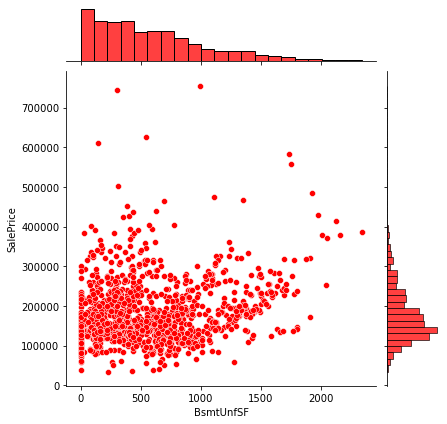

<Figure size 720x576 with 0 Axes>

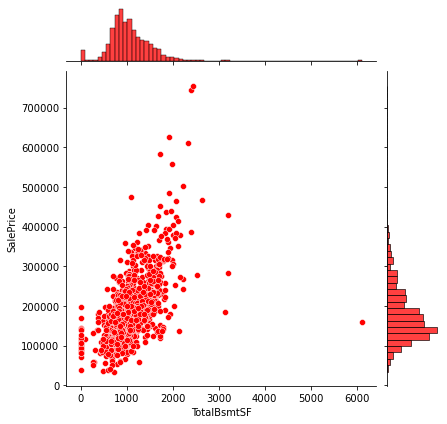

<Figure size 720x576 with 0 Axes>

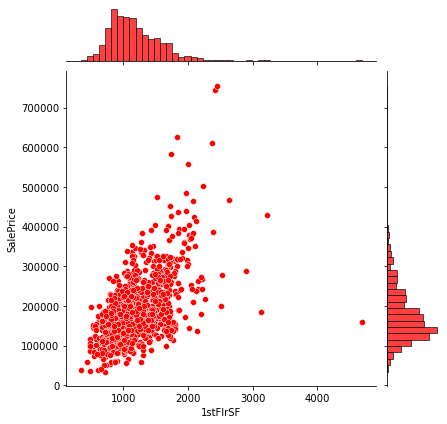

<Figure size 720x576 with 0 Axes>

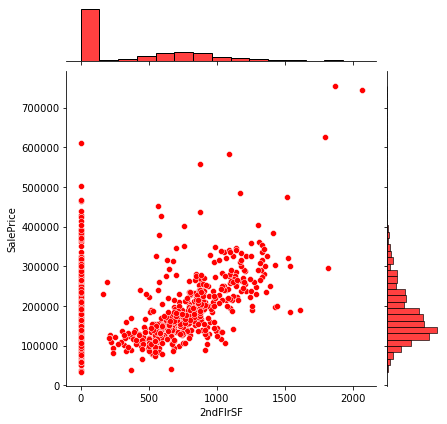

<Figure size 720x576 with 0 Axes>

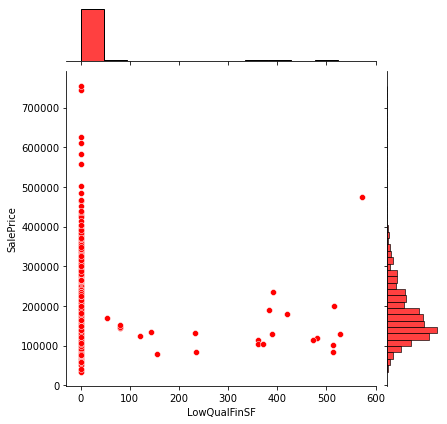

<Figure size 720x576 with 0 Axes>

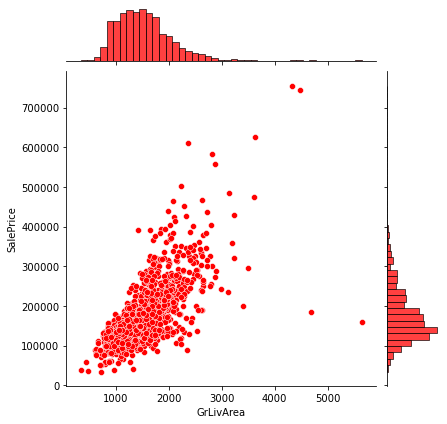

<Figure size 720x576 with 0 Axes>

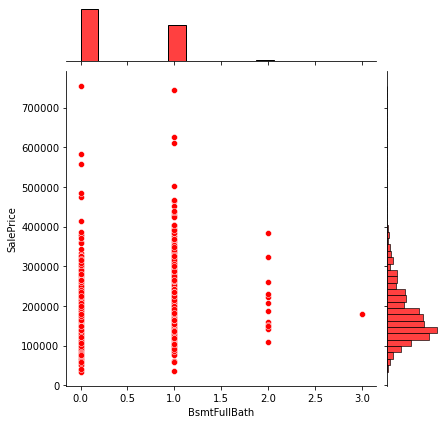

<Figure size 720x576 with 0 Axes>

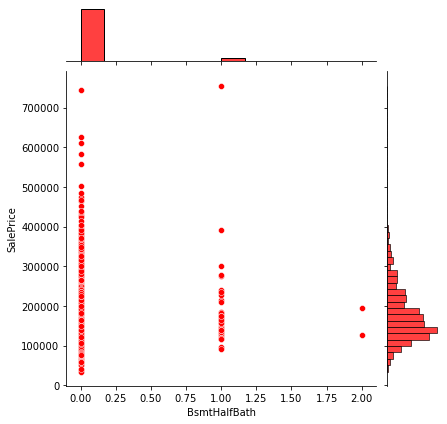

<Figure size 720x576 with 0 Axes>

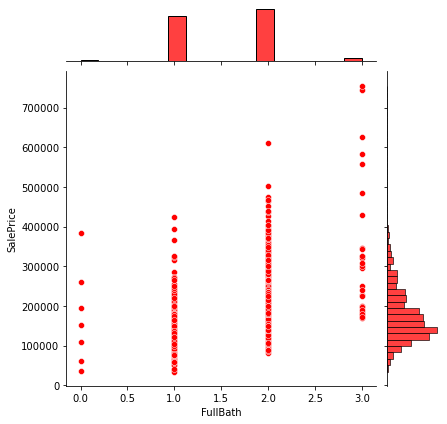

<Figure size 720x576 with 0 Axes>

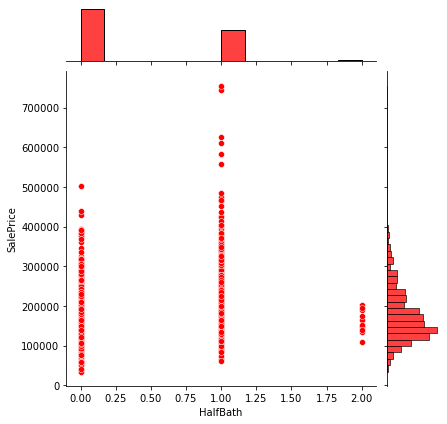

<Figure size 720x576 with 0 Axes>

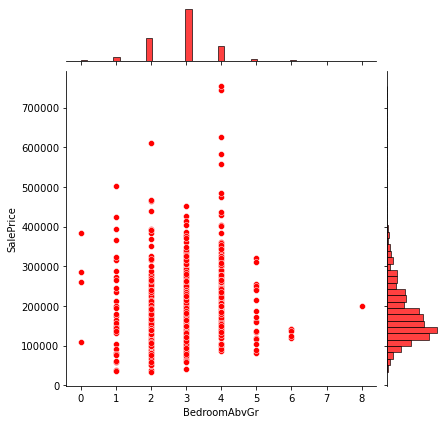

<Figure size 720x576 with 0 Axes>

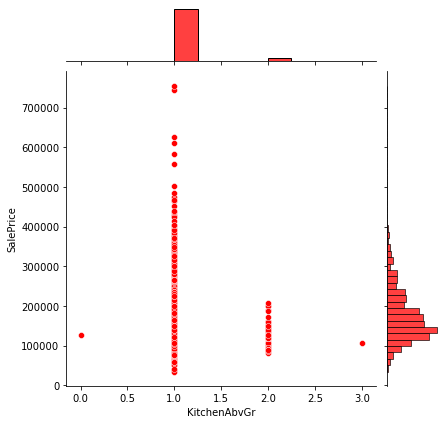

<Figure size 720x576 with 0 Axes>

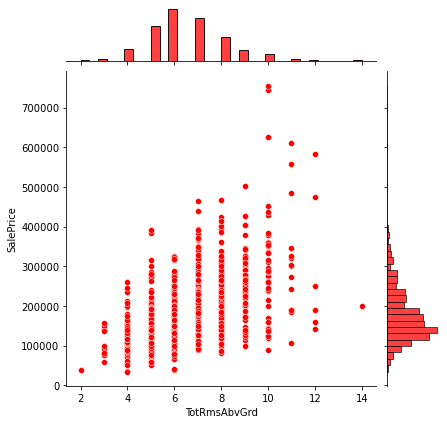

<Figure size 720x576 with 0 Axes>

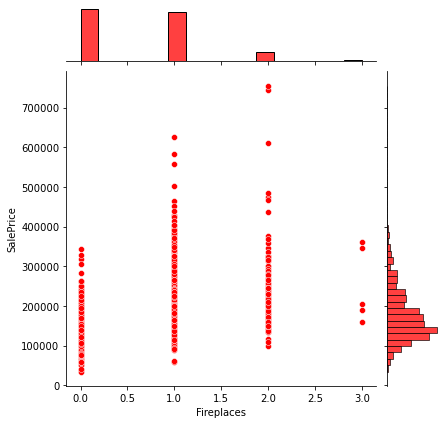

<Figure size 720x576 with 0 Axes>

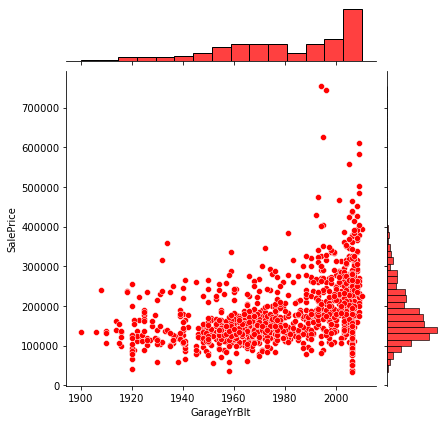

<Figure size 720x576 with 0 Axes>

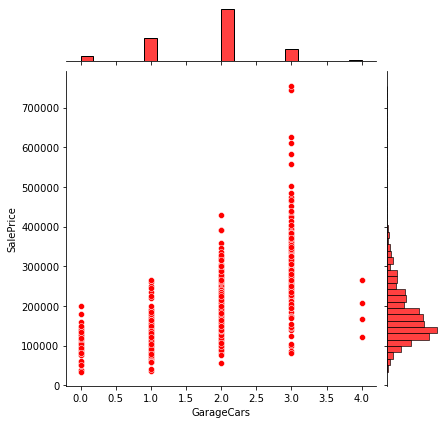

<Figure size 720x576 with 0 Axes>

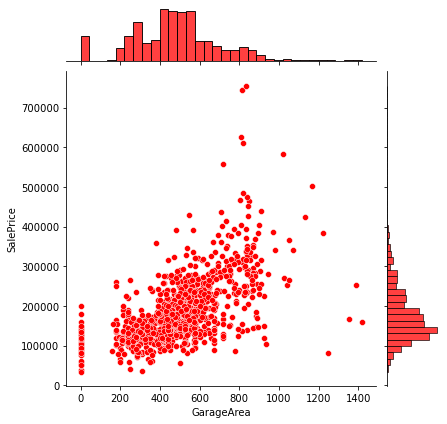

<Figure size 720x576 with 0 Axes>

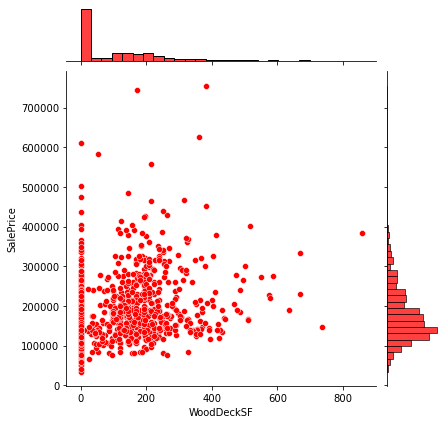

<Figure size 720x576 with 0 Axes>

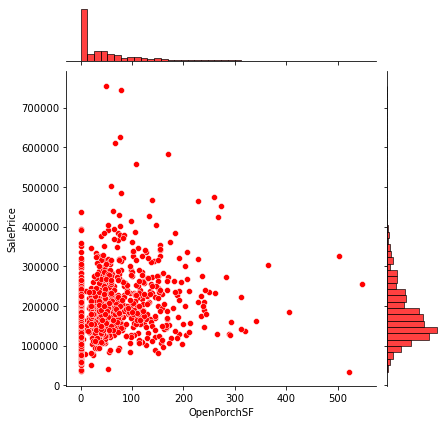

<Figure size 720x576 with 0 Axes>

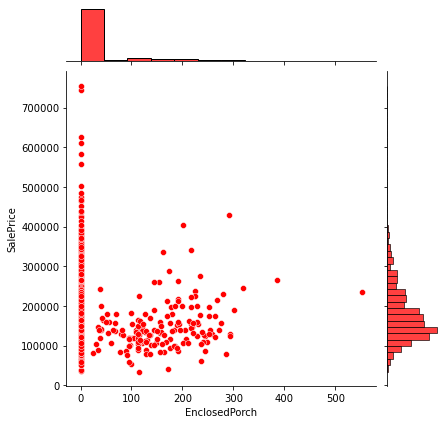

<Figure size 720x576 with 0 Axes>

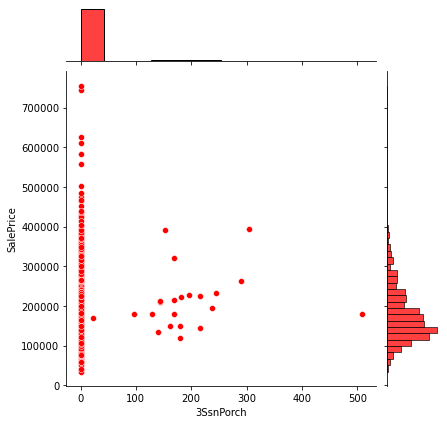

<Figure size 720x576 with 0 Axes>

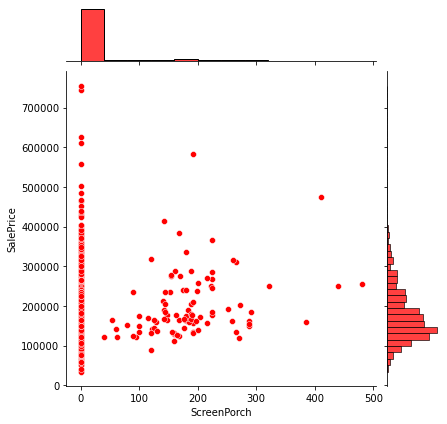

<Figure size 720x576 with 0 Axes>

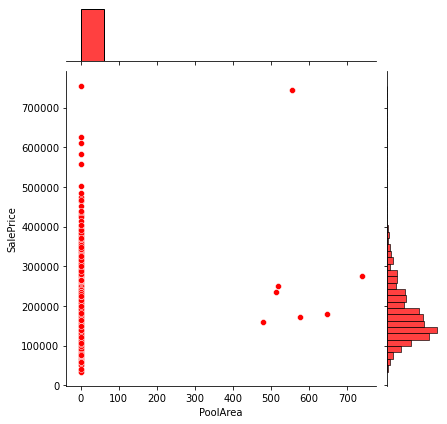

<Figure size 720x576 with 0 Axes>

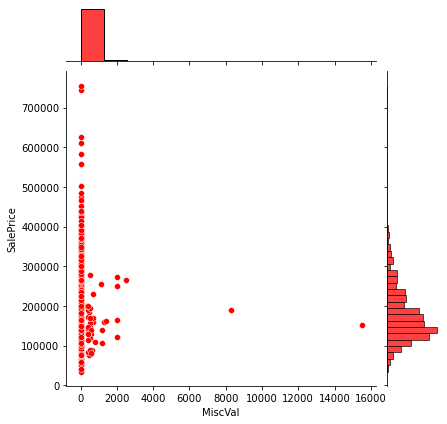

<Figure size 720x576 with 0 Axes>

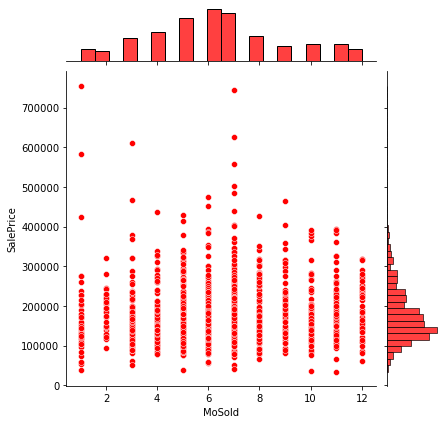

<Figure size 720x576 with 0 Axes>

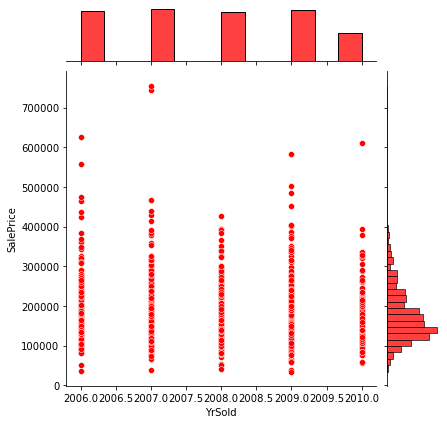

<Figure size 720x576 with 0 Axes>

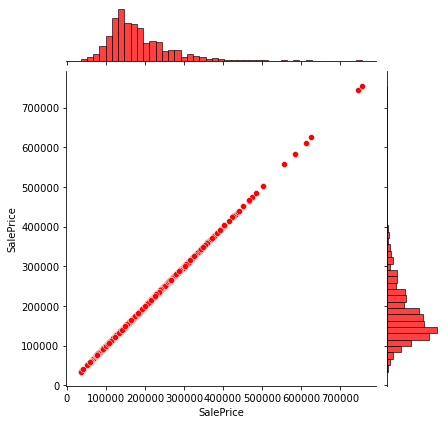

In [464]:
print("-----------------------------------BIVARIATE ANALYSIS(JointPlot)------------------------------------")
def generate_jointplot_numerical():
    for jj in df.select_dtypes(include=['number']):
        plt.figure(figsize=(10,8))
        joint_numerical = sns.jointplot(df[jj],df['SalePrice'],color='red')
        plt.xlabel(jj)
generate_jointplot_numerical()

I have completed the visualization part.

# Outliers

I will check for outliers

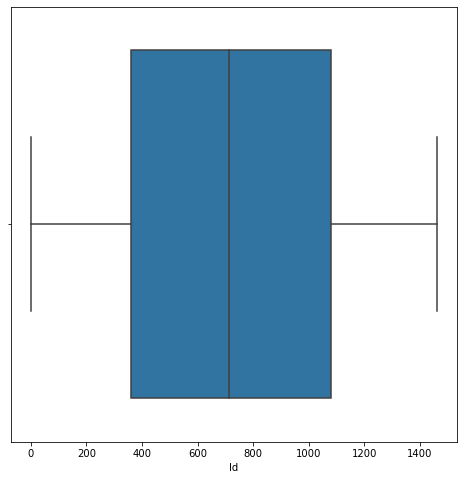

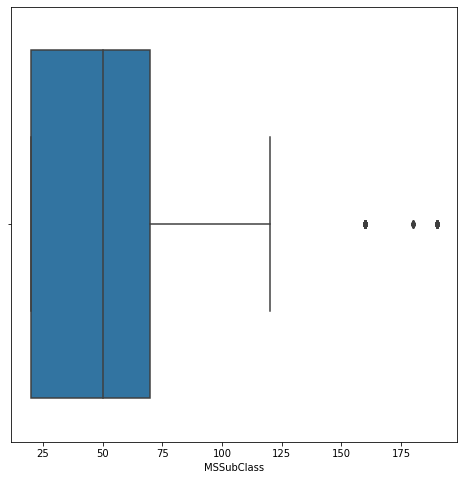

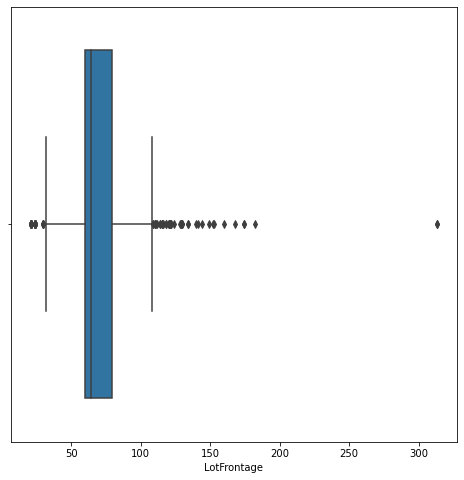

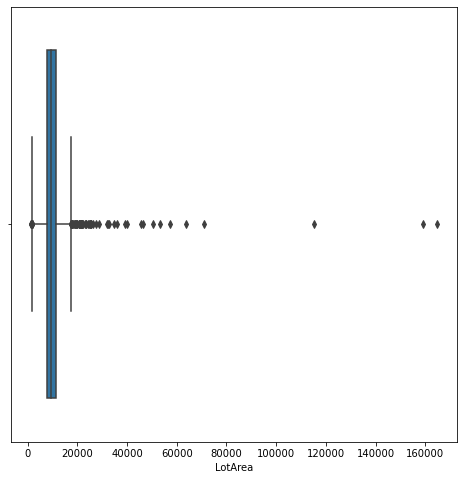

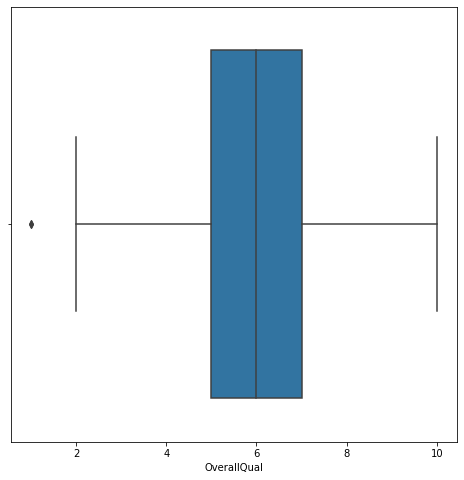

...

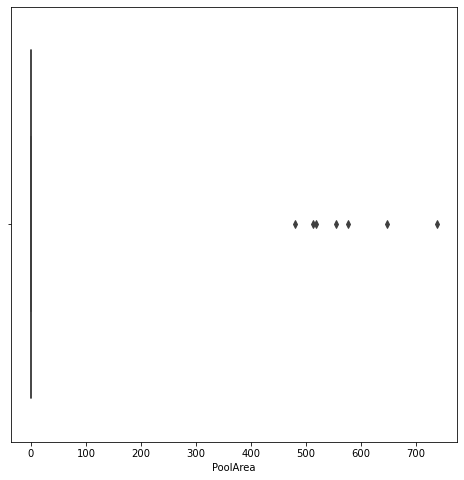

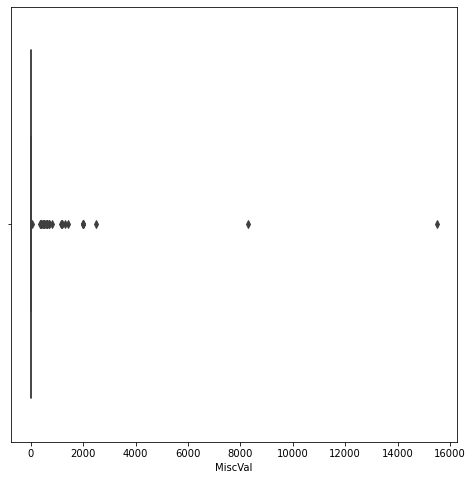

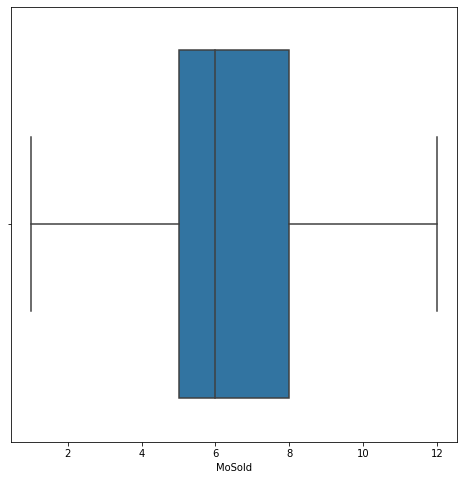

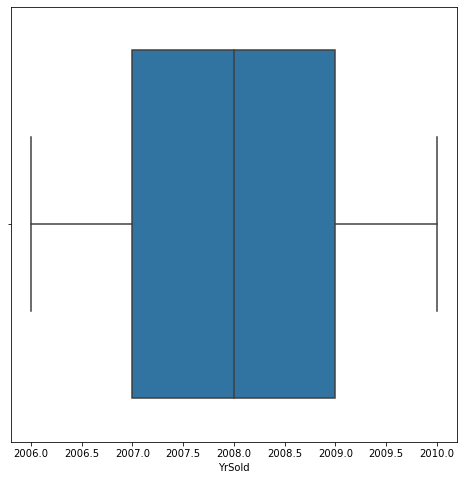

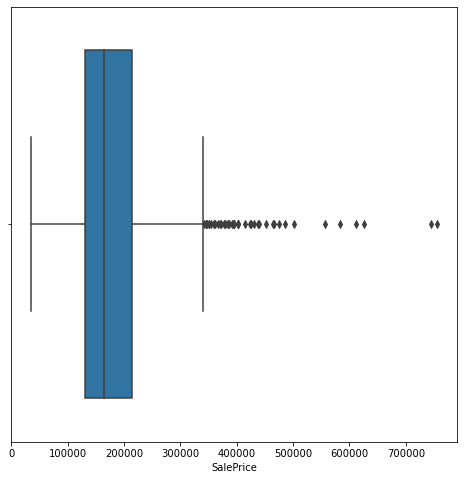

In [465]:
def outlier_detection():
    for o in df.select_dtypes(include=['number']):
        plt.figure(figsize=(8,8))
        outlier = sns.boxplot(df[o])
outlier_detection()

I will use Z score to remove outliers

In [466]:
from scipy.stats import zscore

In [467]:
z = np.abs(zscore(df.select_dtypes(include=['number'])))
z

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1.435487,1.508301,0.393187,0.620616,0.075169,0.530217,0.168236,0.421565,0.558343,0.702161,...,0.762907,2.387850,0.364375,0.125172,0.273377,0.076845,0.087131,1.617822,0.605487,0.676310
1,0.396325,0.877042,1.140103,0.600903,1.364138,0.359572,0.030885,0.710356,0.558343,0.202665,...,0.120585,2.417992,0.364375,0.125172,3.795117,0.076845,0.087131,1.361470,0.605487,1.094234
2,0.165545,0.077095,1.008678,0.063075,0.644484,0.530217,0.831975,0.589202,0.558343,0.902279,...,0.664476,1.257525,0.364375,0.125172,0.273377,0.076845,0.087131,0.128176,0.605487,1.116872
3,1.476354,0.877042,1.578185,0.141424,0.075169,0.359572,0.201423,0.373434,2.076985,0.562795,...,0.762907,1.136957,0.364375,0.125172,0.273377,0.076845,0.087131,1.990233,1.651563,0.107788
4,0.726321,0.877042,0.393187,0.686902,0.075169,1.249361,0.201423,0.733598,0.133430,1.732609,...,1.140270,0.701705,0.364375,0.125172,0.273377,0.076845,0.087131,0.128176,0.899213,0.423957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,1.046046,0.877042,0.393187,0.074355,0.794823,0.530217,0.130446,0.854752,0.388145,0.011404,...,0.762907,0.701705,0.364375,0.125172,0.273377,0.076845,0.087131,1.617822,1.651563,0.752191
1164,0.408999,0.877042,0.086529,0.190733,1.514476,0.530217,0.727811,0.877993,0.558343,0.961639,...,0.762907,0.745111,0.364375,0.125172,0.273377,0.076845,0.087131,0.500587,0.899213,0.929245
1165,1.269614,2.462438,1.970284,0.916362,0.075169,0.359572,0.168236,0.421565,0.558343,0.262233,...,0.073005,0.701705,0.364375,0.125172,0.273377,0.076845,0.087131,0.244236,0.899213,0.417052
1166,1.666266,0.315629,0.831269,0.221670,1.514476,1.420006,1.690232,1.672992,0.558343,0.961639,...,0.762907,0.112129,2.358693,0.125172,0.273377,0.076845,0.087131,0.244236,0.146863,1.789224


In [468]:
threshold = 3
df1 = df[(z < 3).all(axis=1)]
df1

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,60.0,4928,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,2,2007,WD,Normal,128000
2,793,60,RL,92.0,9920,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,1,2010,COD,Normal,190000
5,1197,60,RL,58.0,14054,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,11,2006,New,Partial,219210
6,561,20,RL,60.0,11341,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,5,2010,WD,Normal,121500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,60.0,9819,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,Grvl,Reg,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,Grvl,Reg,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,7,2008,WD,Normal,40000


In [469]:
print(df.shape)# shape of the original data 
print(df1.shape)# shape of the data after using zscore to remove outliers

(1168, 81)
(803, 81)


In [470]:
# reassigning the changed dataframe name to our original dataframe name
df = df1.copy()

df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,60.0,4928,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,2,2007,WD,Normal,128000
2,793,60,RL,92.0,9920,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,1,2010,COD,Normal,190000
5,1197,60,RL,58.0,14054,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,11,2006,New,Partial,219210
6,561,20,RL,60.0,11341,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,5,2010,WD,Normal,121500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,60.0,9819,Pave,Grvl,IR1,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,Grvl,Reg,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,Grvl,Reg,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,Gd,MnPrv,Shed,0,7,2008,WD,Normal,40000


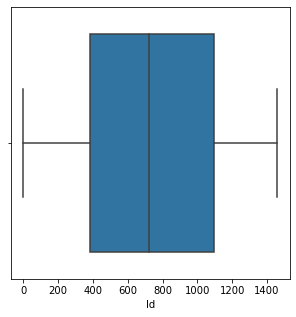

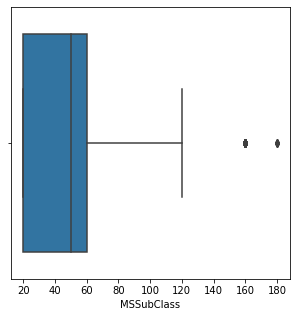

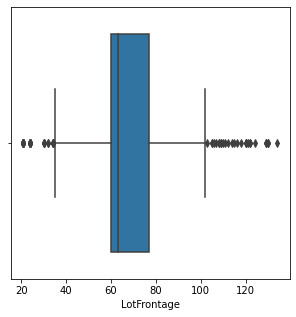

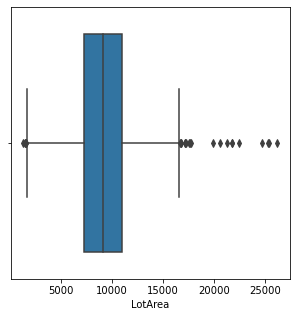

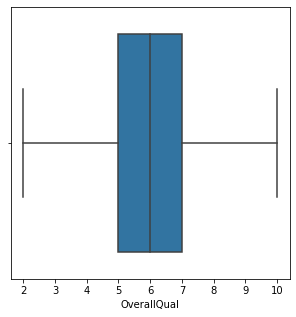

...

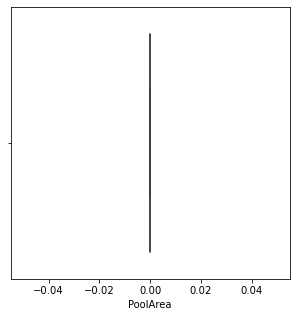

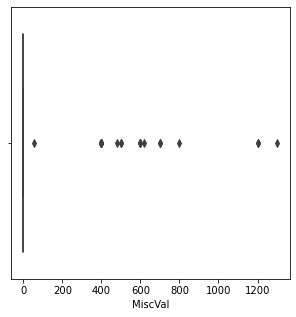

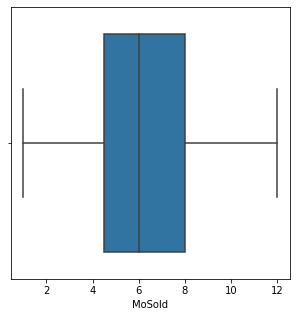

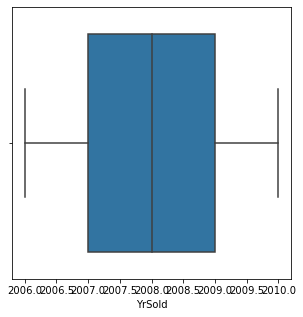

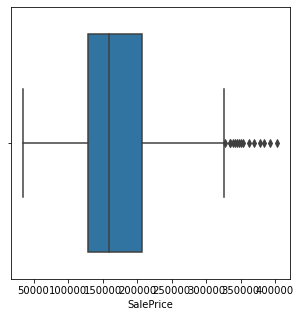

In [471]:
#Outlier Detection after removing outliers
def outlier_detection():
    for o in df.select_dtypes(include=['number']):
        plt.figure(figsize=(5,5))
        outlier = sns.boxplot(df[o])
outlier_detection()

# Encoding

Converting categorical variables to numerical variables

In [472]:
df.select_dtypes(include=['O']).head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,Grvl,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,...,Attchd,RFn,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
2,RL,Pave,Grvl,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,...,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
3,RL,Pave,Grvl,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,...,Attchd,RFn,TA,TA,Y,Gd,MnPrv,Shed,COD,Normal
5,RL,Pave,Grvl,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,...,BuiltIn,Fin,TA,TA,Y,Gd,MnPrv,Shed,New,Partial
6,RL,Pave,Grvl,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,...,Detchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal


In [473]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

In [474]:
#Label Encoder ---  converts categorical to numerical variables
for feature in df.select_dtypes(include=['O']):
    df[feature] = le.fit_transform(df[feature])
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,3,60.0,4928,1,0,0,3,0,...,0,0,2,0,0,2,2007,8,4,128000
2,793,60,3,92.0,9920,1,0,0,3,0,...,0,0,2,0,0,6,2007,8,4,269790
3,110,20,3,105.0,11751,1,0,0,3,0,...,0,0,2,0,0,1,2010,0,4,190000
5,1197,60,3,58.0,14054,1,0,0,3,0,...,0,0,2,0,0,11,2006,6,5,219210
6,561,20,3,60.0,11341,1,0,0,3,0,...,0,0,2,0,0,5,2010,8,4,121500


In [475]:
print(df.dtypes.to_string())

Id                 int64
MSSubClass         int64
MSZoning           int32
LotFrontage      float64
LotArea            int64
Street             int32
Alley              int32
LotShape           int32
LandContour        int32
Utilities          int32
LotConfig          int32
LandSlope          int32
Neighborhood       int32
Condition1         int32
Condition2         int32
BldgType           int32
HouseStyle         int32
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle          int32
RoofMatl           int32
Exterior1st        int32
Exterior2nd        int32
MasVnrType         int32
MasVnrArea       float64
ExterQual          int32
ExterCond          int32
Foundation         int32
BsmtQual           int32
BsmtCond           int32
BsmtExposure       int32
BsmtFinType1       int32
BsmtFinSF1         int64
BsmtFinType2       int32
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating            int32


In [476]:
#shape of dataset after removal outliers and doing encoding
df.shape

(803, 81)

# Correlation Matrix

In [477]:
df.drop(['Utilities','BsmtHalfBath','KitchenAbvGr','PoolArea','PoolQC','MiscFeature'],axis=1,inplace=True)

In [478]:
df_corr = df.corr()
df_corr

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,1.000000,0.027127,-0.001802,-0.055899,0.013451,0.003879,0.001553,0.022979,-0.003956,0.015395,...,0.006690,0.016306,0.006563,0.050204,-0.032315,0.038990,-0.022905,0.061653,-0.055090,-0.050973
MSSubClass,0.027127,1.000000,-0.010197,-0.500591,-0.496996,-0.002003,0.253481,0.085173,0.077354,0.107858,...,-0.061425,-0.029907,-0.042824,0.045823,-0.052320,-0.027569,-0.000748,0.053242,-0.012545,-0.006743
MSZoning,-0.001802,-0.010197,1.000000,-0.099303,-0.074422,0.112332,-0.445345,0.050264,-0.008970,-0.035835,...,0.134954,0.000397,0.036609,-0.050974,0.040985,-0.056789,0.005358,0.108099,-0.012394,-0.226582
LotFrontage,-0.055899,-0.500591,-0.099303,1.000000,0.569870,-0.019573,-0.234256,-0.131389,0.020233,-0.163804,...,-0.010475,-0.002461,0.036840,-0.070533,0.004475,0.028672,-0.021256,-0.047763,0.109646,0.380449
LotArea,0.013451,-0.496996,-0.074422,0.569870,1.000000,-0.015913,-0.216218,-0.287613,-0.011686,-0.196897,...,-0.014432,0.010850,0.076755,-0.065049,0.033816,0.041269,-0.023444,-0.013323,0.080120,0.349659
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MoSold,0.038990,-0.027569,-0.056789,0.028672,0.041269,0.015093,-0.036782,-0.020534,-0.032863,0.020870,...,-0.078461,0.049320,-0.032181,-0.039357,0.008131,1.000000,-0.174124,-0.062565,0.026285,0.121261
YrSold,-0.022905,-0.000748,0.005358,-0.021256,-0.023444,-0.025556,-0.024845,-0.000219,0.013103,-0.017631,...,0.040341,-0.047323,0.052993,-0.014150,0.047623,-0.174124,1.000000,0.014115,-0.011773,-0.054073
SaleType,0.061653,0.053242,0.108099,-0.047763,-0.013323,-0.016188,0.005553,0.017124,-0.050320,0.030601,...,0.016041,-0.035308,0.016264,-0.051109,-0.001584,-0.062565,0.014115,1.000000,0.142960,-0.029953
SaleCondition,-0.055090,-0.012545,-0.012394,0.109646,0.080120,0.037607,-0.057139,-0.093529,0.036693,-0.002683,...,-0.037162,0.038886,-0.029073,0.052884,-0.019389,0.026285,-0.011773,0.142960,1.000000,0.271127


<AxesSubplot:>

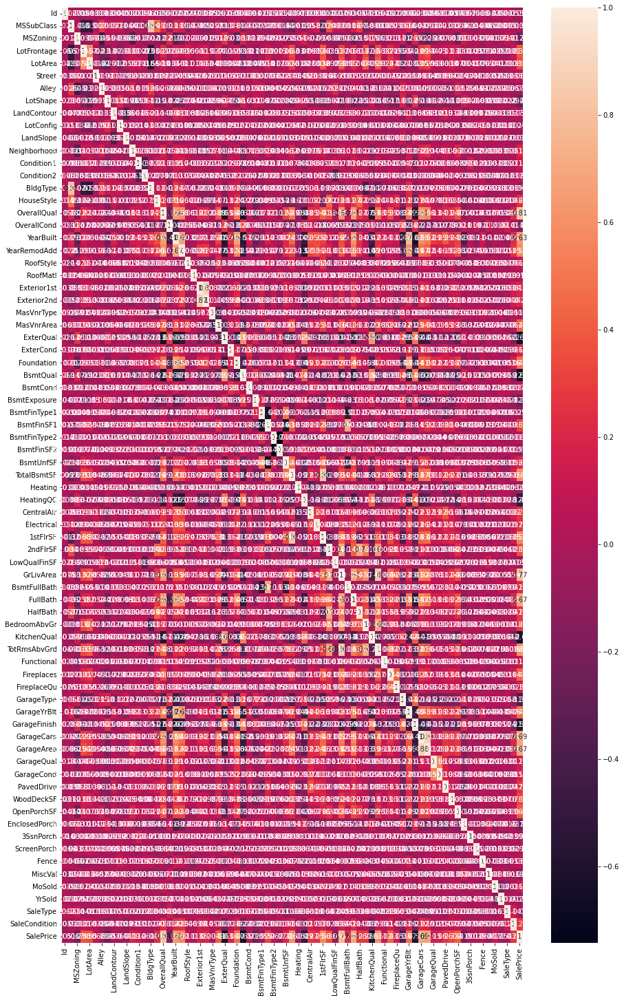

In [479]:
plt.figure(figsize=(15,25))
sns.heatmap(df_corr,annot=True)

# VIF

In [480]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df.values,i) for i in range(df.shape[1])]
vif['features'] = df.columns

print(vif.to_string())

             vif       features
0   4.436951e+00             Id
1   3.747178e+01     MSSubClass
2   4.195480e+01       MSZoning
3   2.993016e+01    LotFrontage
4   1.869115e+01        LotArea
5   4.644870e+02         Street
6   1.754817e+00          Alley
7   4.005350e+00       LotShape
8   2.604669e+01    LandContour
9   5.619131e+00      LotConfig
10  1.371967e+00      LandSlope
11  6.593546e+00   Neighborhood
12  9.882135e+00     Condition1
13  3.336901e+02     Condition2
14  1.177027e+01       BldgType
15  1.322628e+01     HouseStyle
16  1.014837e+02    OverallQual
17  6.434861e+01    OverallCond
18  4.605651e+04      YearBuilt
19  2.977870e+04   YearRemodAdd
20  5.350090e+00      RoofStyle
21  1.161892e+00       RoofMatl
22  4.211945e+01    Exterior1st
23  3.553099e+01    Exterior2nd
24  1.370036e+01     MasVnrType
25  2.406742e+00     MasVnrArea
26  5.457324e+01      ExterQual
27  3.384758e+01      ExterCond
28  1.462094e+01     Foundation
29  2.307940e+01       BsmtQual
30  2.90

# Feature Selection

In [481]:
from sklearn.feature_selection import SelectKBest,f_regression

In [482]:
X = df.drop(['SalePrice'],axis=1)
Y = df['SalePrice']

In [483]:
X.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,127,120,3,60.0,4928,1,0,0,3,4,...,205,0,0,0,2,0,2,2007,8,4
2,793,60,3,92.0,9920,1,0,0,3,1,...,130,0,0,0,2,0,6,2007,8,4
3,110,20,3,105.0,11751,1,0,0,3,4,...,122,0,0,0,2,0,1,2010,0,4
5,1197,60,3,58.0,14054,1,0,0,3,4,...,17,0,0,0,2,0,11,2006,6,5
6,561,20,3,60.0,11341,1,0,0,3,4,...,0,0,0,95,2,0,5,2010,8,4


In [484]:
Y.head()

0    128000
2    269790
3    190000
5    219210
6    121500
Name: SalePrice, dtype: int64

In [485]:
best_features = SelectKBest(score_func=f_regression,k=20)
fit = best_features.fit(X,Y)
df_scores = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(X.columns)

feature_scores = pd.concat([df_columns,df_scores],axis=1)
feature_scores.columns = ['Feature_Name','Score']

feature_scores.nlargest(20,'Score')

,Feature_Name,Score
16,OverallQual,1533.836386
45,GrLivArea,1135.956473
58,GarageCars,720.212045
47,FullBath,666.939842
59,GarageArea,656.215229
29,BsmtQual,586.265353
26,ExterQual,533.866344
18,YearBuilt,517.577103
51,TotRmsAbvGrd,461.761604
50,KitchenQual,451.360664


In [486]:
X = df[['OverallQual','GrLivArea','GarageCars','FullBath','GarageArea','BsmtQual','ExterQual','YearBuilt','TotRmsAbvGrd',
       'KitchenQual','TotalBsmtSF','GarageFinish','YearRemodAdd','1stFlrSF','HeatingQC','Foundation','GarageYrBlt',
       'Fireplaces','MasVnrArea','OpenPorchSF']]

In [487]:
X

,OverallQual,GrLivArea,GarageCars,FullBath,GarageArea,BsmtQual,ExterQual,YearBuilt,TotRmsAbvGrd,KitchenQual,TotalBsmtSF,GarageFinish,YearRemodAdd,1stFlrSF,HeatingQC,Foundation,GarageYrBlt,Fireplaces,MasVnrArea,OpenPorchSF
0,6,958,2,2,440,2,3,1976,5,3,1078,1,1976,958,3,1,1977.0,1,0.0,205
2,7,2013,2,2,455,2,2,1996,8,3,1117,2,1997,1127,0,2,1997.0,1,0.0,130
3,6,1844,2,2,546,2,3,1977,7,3,1844,1,1977,1844,0,1,1977.0,1,480.0,122
5,7,1863,3,2,660,2,2,2006,9,2,879,0,2006,879,0,2,2006.0,1,0.0,17
6,5,1392,2,1,528,2,3,1957,5,3,1392,2,1996,1392,3,1,1957.0,1,180.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,5,900,1,1,280,3,3,1967,5,3,882,2,1967,900,3,1,1970.0,0,31.0,0
1164,4,1126,2,2,520,3,3,1949,5,2,0,0,2003,1126,0,1,2002.0,0,0.0,96
1165,6,1456,2,2,440,2,3,1976,7,3,855,2,1976,855,3,1,1976.0,1,0.0,0
1166,4,1317,1,1,250,3,3,1920,6,3,649,2,1950,649,3,0,1920.0,0,0.0,54


In [488]:
X

,OverallQual,GrLivArea,GarageCars,FullBath,GarageArea,BsmtQual,ExterQual,YearBuilt,TotRmsAbvGrd,KitchenQual,TotalBsmtSF,GarageFinish,YearRemodAdd,1stFlrSF,HeatingQC,Foundation,GarageYrBlt,Fireplaces,MasVnrArea,OpenPorchSF
0,6,958,2,2,440,2,3,1976,5,3,1078,1,1976,958,3,1,1977.0,1,0.0,205
2,7,2013,2,2,455,2,2,1996,8,3,1117,2,1997,1127,0,2,1997.0,1,0.0,130
3,6,1844,2,2,546,2,3,1977,7,3,1844,1,1977,1844,0,1,1977.0,1,480.0,122
5,7,1863,3,2,660,2,2,2006,9,2,879,0,2006,879,0,2,2006.0,1,0.0,17
6,5,1392,2,1,528,2,3,1957,5,3,1392,2,1996,1392,3,1,1957.0,1,180.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,5,900,1,1,280,3,3,1967,5,3,882,2,1967,900,3,1,1970.0,0,31.0,0
1164,4,1126,2,2,520,3,3,1949,5,2,0,0,2003,1126,0,1,2002.0,0,0.0,96
1165,6,1456,2,2,440,2,3,1976,7,3,855,2,1976,855,3,1,1976.0,1,0.0,0
1166,4,1317,1,1,250,3,3,1920,6,3,649,2,1950,649,3,0,1920.0,0,0.0,54


In [489]:
X.skew()

OverallQual     0.014959
GrLivArea       0.551514
GarageCars     -0.342937
FullBath        0.032689
GarageArea     -0.034515
BsmtQual       -1.330739
ExterQual      -1.486416
YearBuilt      -0.583781
TotRmsAbvGrd    0.378751
KitchenQual    -1.414325
TotalBsmtSF     0.121094
GarageFinish   -0.408860
YearRemodAdd   -0.577825
1stFlrSF        0.645319
HeatingQC       0.377082
Foundation     -0.358147
GarageYrBlt    -0.781622
Fireplaces      0.598419
MasVnrArea      1.700077
OpenPorchSF     1.444519
dtype: float64

In [490]:
for index in X.skew().index:
    if X.skew().loc[index]>0.5:
        X[index]=np.sqrt(X[index])

In [491]:
X.skew()

OverallQual     0.014959
GrLivArea       0.193282
GarageCars     -0.342937
FullBath        0.032689
GarageArea     -0.034515
BsmtQual       -1.330739
ExterQual      -1.486416
YearBuilt      -0.583781
TotRmsAbvGrd    0.378751
KitchenQual    -1.414325
TotalBsmtSF     0.121094
GarageFinish   -0.408860
YearRemodAdd   -0.577825
1stFlrSF        0.298779
HeatingQC       0.377082
Foundation     -0.358147
GarageYrBlt    -0.781622
Fireplaces      0.151328
MasVnrArea      0.878626
OpenPorchSF     0.415864
dtype: float64

# Feature Scaling

I will be doing feature scaling to make the values in a standard range and all values should be in same unit.

In [492]:
from sklearn.preprocessing import StandardScaler

In [493]:
scalar = StandardScaler()

In [494]:
X_scaled = pd.DataFrame(scalar.fit_transform(X),columns=X.columns)
X_scaled

,OverallQual,GrLivArea,GarageCars,FullBath,GarageArea,BsmtQual,ExterQual,YearBuilt,TotRmsAbvGrd,KitchenQual,TotalBsmtSF,GarageFinish,YearRemodAdd,1stFlrSF,HeatingQC,Foundation,GarageYrBlt,Fireplaces,MasVnrArea,OpenPorchSF
0,-0.052074,-1.140752,0.337640,0.872413,-0.139622,-0.360775,0.738825,0.042543,-0.911331,0.838991,0.175669,-0.268310,-0.472534,-0.392340,1.367407,-0.668915,-0.184569,0.923274,-0.745728,2.110120
1,0.708201,1.316526,0.337640,0.872413,-0.064102,-0.360775,-0.918371,0.733382,1.226348,0.838991,0.285653,0.977084,0.531921,0.149466,-0.884188,0.819005,0.623329,0.923274,-0.745728,1.478891
2,-0.052074,0.976646,0.337640,0.872413,0.394051,-0.360775,0.738825,0.077085,0.513788,0.838991,2.335877,-0.268310,-0.424703,2.087911,-0.884188,-0.668915,-0.184569,0.923274,2.292489,1.401744
3,0.708201,1.015614,1.735191,0.872413,0.968001,-0.360775,-0.918371,1.078801,1.938908,-0.484604,-0.385534,-1.513704,0.962401,-0.662006,-0.884188,0.819005,0.986883,0.923274,-0.745728,-0.096690
4,-0.812348,-0.017982,0.337640,-1.041652,0.303427,-0.360775,0.738825,-0.613754,-0.911331,0.838991,1.061185,0.977084,0.484089,0.922836,1.367407,-0.668915,-0.992466,0.923274,1.114792,-0.989203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
798,-0.812348,-1.308794,-1.059911,-1.041652,-0.945167,0.893347,0.738825,-0.268335,-0.911331,0.838991,-0.377074,0.977084,-0.903014,-0.589179,1.367407,-0.668915,-0.467333,-0.962306,0.026382,-0.989203
799,-1.572622,-0.680841,0.337640,0.872413,0.263150,0.893347,0.738825,-0.890089,-0.911331,-0.484604,-2.864415,-1.513704,0.818907,0.146384,-0.884188,-0.668915,0.825303,-0.962306,-0.745728,1.131723
800,-0.052074,0.131779,0.337640,0.872413,-0.139622,-0.360775,0.738825,0.042543,0.513788,0.838991,-0.453217,0.977084,-0.472534,-0.746310,1.367407,-0.668915,-0.224964,0.923274,-0.745728,-0.989203
801,-1.572622,-0.197934,-1.059911,-1.041652,-1.096206,0.893347,0.738825,-1.891806,-0.198771,0.838991,-1.034160,0.977084,-1.716144,-1.525102,1.367407,-2.156836,-2.487077,-0.962306,-0.745728,0.601492


# VIF

In [495]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(X_scaled.values,i) for i in range(X_scaled.shape[1])]
vif['features'] = X_scaled.columns

print(vif.to_string())

         vif      features
0   3.474703   OverallQual
1   5.665457     GrLivArea
2   5.437743    GarageCars
3   2.929234      FullBath
4   4.764374    GarageArea
5   2.023065      BsmtQual
6   2.450267     ExterQual
7   4.976598     YearBuilt
8   3.398096  TotRmsAbvGrd
9   1.962629   KitchenQual
10  4.274862   TotalBsmtSF
11  1.916772  GarageFinish
12  2.388049  YearRemodAdd
13  3.907659      1stFlrSF
14  1.711964     HeatingQC
15  2.179463    Foundation
16  2.968036   GarageYrBlt
17  1.463443    Fireplaces
18  1.345148    MasVnrArea
19  1.455232   OpenPorchSF


# Model Bulding

In [496]:
X_scaled

,OverallQual,GrLivArea,GarageCars,FullBath,GarageArea,BsmtQual,ExterQual,YearBuilt,TotRmsAbvGrd,KitchenQual,TotalBsmtSF,GarageFinish,YearRemodAdd,1stFlrSF,HeatingQC,Foundation,GarageYrBlt,Fireplaces,MasVnrArea,OpenPorchSF
0,-0.052074,-1.140752,0.337640,0.872413,-0.139622,-0.360775,0.738825,0.042543,-0.911331,0.838991,0.175669,-0.268310,-0.472534,-0.392340,1.367407,-0.668915,-0.184569,0.923274,-0.745728,2.110120
1,0.708201,1.316526,0.337640,0.872413,-0.064102,-0.360775,-0.918371,0.733382,1.226348,0.838991,0.285653,0.977084,0.531921,0.149466,-0.884188,0.819005,0.623329,0.923274,-0.745728,1.478891
2,-0.052074,0.976646,0.337640,0.872413,0.394051,-0.360775,0.738825,0.077085,0.513788,0.838991,2.335877,-0.268310,-0.424703,2.087911,-0.884188,-0.668915,-0.184569,0.923274,2.292489,1.401744
3,0.708201,1.015614,1.735191,0.872413,0.968001,-0.360775,-0.918371,1.078801,1.938908,-0.484604,-0.385534,-1.513704,0.962401,-0.662006,-0.884188,0.819005,0.986883,0.923274,-0.745728,-0.096690
4,-0.812348,-0.017982,0.337640,-1.041652,0.303427,-0.360775,0.738825,-0.613754,-0.911331,0.838991,1.061185,0.977084,0.484089,0.922836,1.367407,-0.668915,-0.992466,0.923274,1.114792,-0.989203
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
798,-0.812348,-1.308794,-1.059911,-1.041652,-0.945167,0.893347,0.738825,-0.268335,-0.911331,0.838991,-0.377074,0.977084,-0.903014,-0.589179,1.367407,-0.668915,-0.467333,-0.962306,0.026382,-0.989203
799,-1.572622,-0.680841,0.337640,0.872413,0.263150,0.893347,0.738825,-0.890089,-0.911331,-0.484604,-2.864415,-1.513704,0.818907,0.146384,-0.884188,-0.668915,0.825303,-0.962306,-0.745728,1.131723
800,-0.052074,0.131779,0.337640,0.872413,-0.139622,-0.360775,0.738825,0.042543,0.513788,0.838991,-0.453217,0.977084,-0.472534,-0.746310,1.367407,-0.668915,-0.224964,0.923274,-0.745728,-0.989203
801,-1.572622,-0.197934,-1.059911,-1.041652,-1.096206,0.893347,0.738825,-1.891806,-0.198771,0.838991,-1.034160,0.977084,-1.716144,-1.525102,1.367407,-2.156836,-2.487077,-0.962306,-0.745728,0.601492


In [497]:
Y.head()

0    128000
2    269790
3    190000
5    219210
6    121500
Name: SalePrice, dtype: int64

In [498]:
#import required libraries

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import cross_val_score,KFold,ShuffleSplit

# Linear Regression
First we will start with Linear Regression to find the best random state for building our Linear Regression Model.

In [502]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.30, random_state=i)
    lr=LinearRegression()
    lr.fit(x_train, y_train)
    y_lr = lr.predict(x_test)
    lr_r2 = r2_score(y_test, y_lr)
    
    if lr_r2>maxAccuracy:
        maxAccuracy=lr_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.892936965315257  on Random State 55


In [503]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.30, random_state=55)

#training our model
lr=LinearRegression()
lr.fit(x_train, y_train)

#Predicting y_test
y_lr = lr.predict(x_test)
lr_r2 = r2_score(y_test, y_lr)

#R2 Score
print("R2 score : ", lr_r2*100)

#Cross Validation Score
cross_val_lr = cross_val_score(lr,X_scaled,Y,cv=5)
print(cross_val_lr)
print("Cross Validation Score : ",cross_val_lr.mean()*100)

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_lr))
print("Mean Square Error : ",mean_squared_error(y_test,y_lr))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_lr)))

R2 score :  89.2936965315257
[0.85748973 0.90165847 0.84863998 0.86601646 0.80875789]
Cross Validation Score :  85.6512504721638
Mean Absolute Error : 17075.19933841226
Mean Square Error :  508951851.2489534
Root Mean Square Error : 22559.96124218642


In [504]:
#K-fold cross validation
K_fold = KFold(5)
print(K_fold)
l1 = cross_val_score(lr,X_scaled,Y,cv=K_fold)
print(l1)
print("K-Fold Cross Validation Score : " , l1.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.85748973 0.90165847 0.84863998 0.86601646 0.80875789]
K-Fold Cross Validation Score :  85.6512504721638


In [505]:
#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
l2 = cross_val_score(lr,X_scaled,Y,cv=shuffle)
print(l2)
print("Shuffle Split : ",l2.mean()*100)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.83452347 0.81899445 0.84556419 0.84588235 0.86686897]
Shuffle Split :  84.2366684365846


# Decision Tree

In [506]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=i)
    dt=DecisionTreeRegressor()
    dt.fit(x_train, y_train)
    y_dt = dt.predict(x_test)
    dt_r2 = r2_score(y_test, y_dt)
    
    if dt_r2>maxAccuracy:
        maxAccuracy=dt_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.8001668997881757  on Random State 64


In [507]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=67)

#training our model
dt=DecisionTreeRegressor()
dt.fit(x_train, y_train)

#Predicting y_test
y_dt = dt.predict(x_test)
dt_r2 = r2_score(y_test, y_dt)

#R2 Score
print("R2 score : ", dt_r2*100)

#Cross Validation Score
cross_val_dt = cross_val_score(dt,X_scaled,Y,cv=5)
print(cross_val_dt)
print("Cross Validation Score : ",cross_val_dt.mean()*100)

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_dt))
print("Mean Square Error : ",mean_squared_error(y_test,y_dt))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_dt)))

R2 score :  77.75040809052895
[0.62942145 0.75687501 0.68868365 0.57167325 0.63775259]
Cross Validation Score :  65.68811916168143
Mean Absolute Error : 21661.551867219918
Mean Square Error :  879780564.7385892
Root Mean Square Error : 29661.095137209435


In [508]:
K_fold = KFold(5)
print(K_fold)
l11 = cross_val_score(dt,X,Y,cv=K_fold)
print(l11)
print("K-Fold Cross Validation Score : " , l11.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.60520684 0.761296   0.68438987 0.67615293 0.69274793]
K-Fold Cross Validation Score :  68.39587151934914


In [509]:
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
l21 = cross_val_score(dt,X,Y,cv=shuffle)
print(l21)
print("Shuffle Split : ",l21.mean()*100)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.62173377 0.68051051 0.69881022 0.7115051  0.63352339]
Shuffle Split :  66.92165970459102


# KNN

In [510]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.30, random_state=i)
    knn=KNeighborsRegressor()
    knn.fit(x_train, y_train)
    y_knn = knn.predict(x_test)
    knn_r2 = r2_score(y_test, y_knn)
    
    if knn_r2>maxAccuracy:
        maxAccuracy=knn_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.8721716877237353  on Random State 81


In [511]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.30, random_state=81)

#training our model
knn=KNeighborsRegressor()
knn.fit(x_train, y_train)

#Predicting y_test
y_knn = knn.predict(x_test)
knn_r2 = r2_score(y_test, y_knn)

#R2 Score
print("R2 score : ", knn_r2*100)

#Cross Validation Score
cross_val_knn = cross_val_score(knn,X_scaled,Y,cv=5)
print(cross_val_knn)
print("Cross Validation Score : ",cross_val_knn.mean()*100)

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_knn))
print("Mean Square Error : ",mean_squared_error(y_test,y_knn))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_knn)))

R2 score :  87.21716877237353
[0.85149839 0.8800854  0.78956883 0.81631759 0.76721691]
Cross Validation Score :  82.09374257460694
Mean Absolute Error : 16694.312033195023
Mean Square Error :  481886299.55352694
Root Mean Square Error : 21951.908790661622


In [512]:
#K-Fold
K_fold = KFold(5)
print(K_fold)
k = cross_val_score(knn,X_scaled,Y,cv=K_fold)
print(k)
print("K-Fold Cross Validation Score : " , k.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.85149839 0.8800854  0.78956883 0.81631759 0.76721691]
K-Fold Cross Validation Score :  82.09374257460694


In [513]:
#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
k1 = cross_val_score(knn,X_scaled,Y,cv=shuffle)
print(k1)
print("Shuffle Split : ",k1.mean()*100)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.80037837 0.86346968 0.78309377 0.83624344 0.80870919]
Shuffle Split :  81.83788890201498


# SVR

In [514]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.30, random_state=i)
    svr=SVR()
    svr.fit(x_train, y_train)
    y_svr = svr.predict(x_test)
    svr_r2 = r2_score(y_test, y_svr)
    
    if svr_r2>maxAccuracy:
        maxAccuracy=svr_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.0010744051281690314  on Random State 19


In [515]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled, Y, test_size=0.30, random_state=19)

#training our model
svr=SVR()
svr.fit(x_train, y_train)

#Predicting y_test
y_svr = svr.predict(x_test)
svr_r2 = r2_score(y_test, y_svr)

#R2 Score
print("R2 score : ", svr_r2*100)

#Cross Validation Score
cross_val_svr = cross_val_score(svr,X_scaled,Y,cv=5)
print(cross_val_svr)
print("Cross Validation Score : ",cross_val_svr.mean()*100)

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_svr))
print("Mean Square Error : ",mean_squared_error(y_test,y_svr))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_svr)))

R2 score :  0.10744051281690314
[-0.000283   -0.12197869 -0.01545254 -0.10236721 -0.01877176]
Cross Validation Score :  -5.177063816535852
Mean Absolute Error : 46737.70760985306
Mean Square Error :  3416941074.4322276
Root Mean Square Error : 58454.60695644294


In [516]:
#K-Fold
K_fold = KFold(5)
print(K_fold)
s = cross_val_score(svr,X_scaled,Y,cv=K_fold)
print(s)
print("K-Fold Cross Validation Score : " , s.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[-0.000283   -0.12197869 -0.01545254 -0.10236721 -0.01877176]
K-Fold Cross Validation Score :  -5.177063816535852


In [517]:
#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
s1 = cross_val_score(svr,X_scaled,Y,cv=shuffle)
print(s1)
print("Shuffle Split : ",s1.mean()*100)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[-0.090425   -0.09511239 -0.046233   -0.06874402 -0.07479356]
Shuffle Split :  -7.506159384414461


# Random Forest

In [518]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=i)
    rf=RandomForestRegressor()
    rf.fit(x_train, y_train)
    y_rf = rf.predict(x_test)
    rf_r2 = r2_score(y_test, y_rf)
    
    if rf_r2>maxAccuracy:
        maxAccuracy=rf_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.8825108698659434  on Random State 77


In [519]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=77)

#training our model
rf=RandomForestRegressor()
rf.fit(x_train, y_train)

#Predicting y_test
y_rf = rf.predict(x_test)
rf_r2 = r2_score(y_test, y_rf)

#R2 Score
print("R2 score : ", rf_r2*100)

#Cross Validation Score
cross_val_rf = cross_val_score(rf,X,Y,cv=5)
print(cross_val_rf)
print("Cross Validation Score : ",cross_val_rf.mean()*100)

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_rf))
print("Mean Square Error : ",mean_squared_error(y_test,y_rf))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_rf)))

R2 score :  88.60869413047931
[0.84801785 0.88272338 0.84806705 0.83238085 0.80816588]
Cross Validation Score :  84.38710017168886
Mean Absolute Error : 16209.932780082987
Mean Square Error :  481051971.228459
Root Mean Square Error : 21932.897009480053


In [520]:
#K-Fold
K_fold = KFold(5)
print(K_fold)
r = cross_val_score(rf,X,Y,cv=K_fold)
print(r)
print("K-Fold Cross Validation Score : " , r.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.85605318 0.8880852  0.84516778 0.84653466 0.80212603]
K-Fold Cross Validation Score :  84.75933693026106


In [521]:
#Shuffle Split
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
r1 = cross_val_score(rf,X,Y,cv=shuffle)
print(r1)
print("Shuffle Split : ",r1.mean()*100)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.83438836 0.83563366 0.83482977 0.84533923 0.78418818]
Shuffle Split :  82.68758397949449


# ADA Boost

In [522]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=i)
    ad=AdaBoostRegressor()
    ad.fit(x_train, y_train)
    y_ad = ad.predict(x_test)
    ad_r2 = r2_score(y_test, y_ad)
    
    if ad_r2>maxAccuracy:
        maxAccuracy=ad_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.8600350323435387  on Random State 77


In [523]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=99)

#training our model
ad=AdaBoostRegressor()
ad.fit(x_train, y_train)

#Predicting y_test
y_ad = ad.predict(x_test)
ad_r2 = r2_score(y_test, y_ad)

#R2 Score
print("R2 score : ", ad_r2*100)

#Cross Validation Score
cross_score_ad = cross_val_score(ad,X,Y,cv=5)
print(cross_score_ad)
print("Cross Validation Score : ",cross_score_ad.mean()*100)

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_ad))
print("Mean Square Error : ",mean_squared_error(y_test,y_ad))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_ad)))

R2 score :  83.77191022035797
[0.81733686 0.85893795 0.81287372 0.81045356 0.78564047]
Cross Validation Score :  81.7048512560287
Mean Absolute Error : 19255.67200090899
Mean Square Error :  714623774.1994919
Root Mean Square Error : 26732.4479649637


In [524]:
K_fold = KFold(5)
print(K_fold)
a = cross_val_score(ad,X,Y,cv=K_fold)
print(a)
print("K-Fold Cross Validation Score : " , a.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.83138182 0.85523245 0.79822449 0.81660375 0.78941429]
K-Fold Cross Validation Score :  81.81713618706358


In [525]:
shuffle = ShuffleSplit(n_splits=5,test_size=0.25)
print(shuffle)
a1 = cross_val_score(ad,X,Y,cv=shuffle)
print(a1)
print("Shuffle Split : ",a1.mean()*100)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.25, train_size=None)
[0.8609175  0.84057867 0.82970209 0.83652761 0.8290785 ]
Shuffle Split :  83.93608746773694


# Gradient Boost

In [526]:
maxAccuracy=0
maxRandomState=0

for i in range(1, 100):
    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=i)
    gb=GradientBoostingRegressor()
    gb.fit(x_train, y_train)
    y_gb = gb.predict(x_test)
    gb_r2 = r2_score(y_test, y_gb)
    
    if gb_r2>maxAccuracy:
        maxAccuracy=gb_r2
        maxRandomState=i

print("Best r2 score is", maxAccuracy ," on Random State", maxRandomState)

Best r2 score is 0.8937964409614864  on Random State 77


In [527]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=77)

#training our model
gb=GradientBoostingRegressor()
gb.fit(x_train, y_train)

#Predicting y_test
y_gb = gb.predict(x_test)
gb_r2 = r2_score(y_test, y_gb)

#R2 Score
print("R2 score : ", gb_r2)

#Cross Validation Score
cross_score_gb = cross_val_score(gb,X,Y,cv=5)
print(cross_score_gb)
print("Cross Validation Score : ",cross_score_gb.mean()*100)

#Error Estimation Methods
print("Mean Absolute Error :",mean_absolute_error(y_test,y_gb))
print("Mean Square Error : ",mean_squared_error(y_test,y_gb))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,y_gb)))

R2 score :  0.8954359989010091
[0.86041538 0.89485928 0.81771176 0.85471534 0.82430913]
Cross Validation Score :  85.04021758815541
Mean Absolute Error : 16020.299263448127
Mean Square Error :  441571137.00890183
Root Mean Square Error : 21013.594100222403


In [528]:
K_fold = KFold(5)
print(K_fold)
g = cross_val_score(gb,X,Y,cv=K_fold)
print(g)
print("K-Fold Cross Validation Score : " , g.mean()*100)

KFold(n_splits=5, random_state=None, shuffle=False)
[0.85965046 0.8957087  0.81925899 0.85501168 0.82492617]
K-Fold Cross Validation Score :  85.09112009922936


In [529]:
shuffle = ShuffleSplit(n_splits=5,test_size=0.30)
print(shuffle)
g1 = cross_val_score(gb,X,Y,cv=shuffle)
print(g1)
print("Shuffle Split : ",g1.mean()*100)

ShuffleSplit(n_splits=5, random_state=None, test_size=0.3, train_size=None)
[0.86708599 0.86641925 0.85544286 0.85869524 0.86083469]
Shuffle Split :  86.16956078774987


I have selected Random Forest Regressor has my best model because it has a very good accuracy.

# Hyperparameter Tuning

In [530]:
from sklearn.model_selection import GridSearchCV

In [531]:
#Choosing Random Forest Regressor 
params = {
    'criterion' : ['absolute_error','poisson'],
    'max_depth' : [2,3,4],
    'min_samples_split' : [2,3,4],
    'max_features' : ['sqrt','log2']
}


In [532]:
grid_random = GridSearchCV(RandomForestRegressor(),param_grid=params,cv=5)
grid_random

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['absolute_error', 'poisson'],
                         'max_depth': [2, 3, 4],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [2, 3, 4]})

In [533]:
grid_random.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['absolute_error', 'poisson'],
                         'max_depth': [2, 3, 4],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_split': [2, 3, 4]})

In [534]:
grid_random.best_params_

{'criterion': 'poisson',
 'max_depth': 4,
 'max_features': 'log2',
 'min_samples_split': 3}

In [535]:
grid_random.best_estimator_

RandomForestRegressor(criterion='poisson', max_depth=4, max_features='log2',
                      min_samples_split=3)

In [536]:
grid_random.best_score_

0.8079669355340894

In [537]:
random_hyperparameter = RandomForestRegressor(criterion='poisson',max_depth=4,max_features='sqrt',min_samples_split=2)
print(random_hyperparameter)
print("------------------------------------------------------------------------")
random_hyperparameter.fit(x_train,y_train)
random_hyperparameter_pred = random_hyperparameter.predict(x_test)
print(random_hyperparameter_pred)
print("------------------------------------------------------------------------")
print("R2 Score : ",r2_score(y_test,random_hyperparameter_pred)*100)
print("Cross Validation Score : ",cross_val_score(RandomForestRegressor(),X,Y,cv=5).mean()*100)
print("Mean Absolute Error :",mean_absolute_error(y_test,random_hyperparameter_pred))
print("Mean Square Error : ",mean_squared_error(y_test,random_hyperparameter_pred))
print("Root Mean Square Error :",np.sqrt(mean_squared_error(y_test,random_hyperparameter_pred)))
print("------------------------------------------------------------------------")

RandomForestRegressor(criterion='poisson', max_depth=4, max_features='sqrt')
------------------------------------------------------------------------
[211232.47518278 281815.57531807 166357.4354238  144077.54025672
 284650.80127796 128614.89988546 197961.77408803 206583.16579724
 159431.87728346 165144.3632724  257012.25859501 109497.63984183
 199408.24941421 111200.23721161 216710.89251688 215549.00214344
 128559.52684383 284509.022      125450.40853696 122687.03785242
 113124.20176663  95896.6277616  191489.27577448 285593.63687162
 182667.57956148 139462.42299715 102031.27299553 217159.26917372
 246319.97766392 165327.75851125 155431.13126841 136710.24901233
 145050.07614765 122864.97678596 154966.04384261 123173.15348472
 178153.49961083 273139.40579627 118081.31516718 132208.31746476
 123173.62407663 279690.21168805 133021.8060787  140988.15392621
 200105.70315136 158801.68301051 203421.15323179 152512.19569293
 216994.34596041 211374.0753902  219556.06908052 125020.76846505
 1873

# Saving the best model

In [538]:
import pickle

In [539]:
filename = 'Housing.pkl'

In [540]:
pickle.dump(random_hyperparameter,open(filename,'wb'))

# Test Data

I will do data preprocessing on test data for prediction

In [541]:
df_test = pd.read_csv('C:/Users/User/Desktop/Data Science/Internship_28/Project-Housing_splitted/test.csv')

df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal


In [542]:
#shape of test dataset
df_test.shape

(292, 80)

In [543]:
#column names
df_test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [544]:
#datatype of dataset
print(df_test.dtypes.to_string())

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


Checking for missing values

In [545]:
print(df_test.isnull().sum().to_string())

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

Treating missing values 

Missing values are present in LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,FireplaceQu,GarageType ,GarageYrBlt ,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature

In [546]:
null_values_test = df_test[['LotFrontage','Alley','MasVnrType','MasVnrArea','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','Electrical','FireplaceQu',
                  'GarageType' ,'GarageYrBlt' ,'GarageFinish','GarageQual','GarageCond','PoolQC','Fence','MiscFeature']]

In [547]:
null_values_test

,LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,86.0,NaN,Stone,200.0,Ex,TA,Gd,GLQ,Unf,SBrkr,Gd,Attchd,2005.0,Fin,TA,TA,NaN,NaN,NaN
1,NaN,NaN,None,0.0,Gd,TA,Av,GLQ,Unf,SBrkr,Ex,Attchd,1984.0,RFn,TA,TA,NaN,NaN,NaN
2,NaN,NaN,None,0.0,Gd,TA,Av,Unf,Unf,SBrkr,TA,Attchd,2001.0,RFn,TA,TA,NaN,NaN,NaN
3,75.0,NaN,None,0.0,TA,TA,No,Rec,Unf,SBrkr,Gd,Attchd,1941.0,Unf,TA,TA,NaN,NaN,NaN
4,86.0,NaN,Stone,74.0,Gd,TA,Mn,Unf,Unf,SBrkr,Gd,BuiltIn,2007.0,Fin,TA,TA,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,78.0,NaN,Stone,468.0,Gd,TA,No,GLQ,Unf,SBrkr,Gd,Attchd,2007.0,RFn,TA,TA,NaN,NaN,NaN
288,57.0,NaN,None,0.0,Gd,TA,No,GLQ,Unf,SBrkr,NaN,Detchd,1996.0,Unf,TA,TA,NaN,NaN,NaN
289,NaN,NaN,BrkFace,180.0,TA,TA,No,ALQ,Unf,SBrkr,TA,Attchd,1970.0,Fin,TA,TA,NaN,NaN,Shed
290,50.0,NaN,None,0.0,TA,TA,No,ALQ,Unf,SBrkr,Gd,Detchd,1950.0,Unf,TA,TA,NaN,NaN,NaN


In [548]:
null_values_test.dtypes

LotFrontage     float64
Alley            object
MasVnrType       object
MasVnrArea      float64
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
BsmtFinType2     object
Electrical       object
FireplaceQu      object
GarageType       object
GarageYrBlt     float64
GarageFinish     object
GarageQual       object
GarageCond       object
PoolQC          float64
Fence            object
MiscFeature      object
dtype: object

The above null values columns have 15 object datatype and 4 float datatype.

In [549]:
si = SimpleImputer(strategy='most_frequent')
si

SimpleImputer(strategy='most_frequent')

In [550]:
for col in null_values_test.select_dtypes(include=['O']):
    print(df_test[col].value_counts())
    print('-'*20)

Grvl    9
Pave    5
Name: Alley, dtype: int64
--------------------
None       168
BrkFace     91
Stone       30
BrkCmn       2
Name: MasVnrType, dtype: int64
--------------------
TA    132
Gd    120
Ex     27
Fa      6
Name: BsmtQual, dtype: int64
--------------------
TA    270
Gd      9
Fa      6
Name: BsmtCond, dtype: int64
--------------------
No    197
Av     41
Gd     26
Mn     21
Name: BsmtExposure, dtype: int64
--------------------
GLQ    88
Unf    85
ALQ    46
BLQ    27
Rec    24
LwQ    15
Name: BsmtFinType1, dtype: int64
--------------------
Unf    254
Rec     11
BLQ      9
LwQ      6
ALQ      3
GLQ      2
Name: BsmtFinType2, dtype: int64
--------------------
SBrkr    264
FuseA     20
FuseF      6
FuseP      1
Name: Electrical, dtype: int64
--------------------
Gd    79
TA    61
Fa     8
Ex     3
Po     2
Name: FireplaceQu, dtype: int64
--------------------
Attchd     179
Detchd      73
BuiltIn     18
Basment      3
2Types       1
CarPort      1
Name: GarageType, dtype: int64


In [554]:
print(df_test.isnull().sum().to_string())

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley              0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         0
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [556]:
df_test.drop(['PoolQC'],axis=1,inplace=True)

In [557]:
df_test['LotFrontage'].value_counts()

60.0    32
85.0    14
50.0    13
70.0    12
21.0     9
        ..
77.0     1
71.0     1
59.0     1
36.0     1
69.0     1
Name: LotFrontage, Length: 65, dtype: int64

In [558]:
df_test['LotFrontage'] = df_test['LotFrontage'].fillna(df_test['LotFrontage'].mean())

In [559]:
df_test['LotFrontage'].isnull().sum()

0

In [560]:
df_test['MasVnrArea'].value_counts()

0.0      169
200.0      3
108.0      3
270.0      3
16.0       3
        ... 
32.0       1
116.0      1
298.0      1
579.0      1
408.0      1
Name: MasVnrArea, Length: 104, dtype: int64

In [561]:
df_test['MasVnrArea'] = df_test['MasVnrArea'].fillna(df_test['MasVnrArea'].mean())

In [562]:
df_test['MasVnrArea'].isnull().sum()

0

In [563]:
df_test['GarageYrBlt'].value_counts()

2004.0    17
2005.0    14
2003.0    13
1977.0    11
1976.0     9
          ..
1931.0     1
1955.0     1
1951.0     1
1924.0     1
1985.0     1
Name: GarageYrBlt, Length: 71, dtype: int64

In [564]:
df_test['GarageYrBlt'] = df_test['GarageYrBlt'].fillna(df_test['GarageYrBlt'].mean())

In [565]:
df_test['GarageYrBlt'].isnull().sum()

0

In [566]:
print(df_test.isnull().sum().to_string())

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [567]:
#Updated test dataset
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.000000,14157,Pave,Grvl,IR1,HLS,AllPub,...,0,0,0,MnPrv,Shed,0,7,2007,WD,Normal
1,1018,120,RL,66.425101,5814,Pave,Grvl,IR1,Lvl,AllPub,...,0,0,0,MnPrv,Shed,0,8,2009,COD,Abnorml
2,929,20,RL,66.425101,11838,Pave,Grvl,Reg,Lvl,AllPub,...,0,0,0,MnPrv,Shed,0,6,2009,WD,Normal
3,1148,70,RL,75.000000,12000,Pave,Grvl,Reg,Bnk,AllPub,...,0,0,0,MnPrv,Shed,0,7,2009,WD,Normal
4,1227,60,RL,86.000000,14598,Pave,Grvl,IR1,Lvl,AllPub,...,0,0,0,MnPrv,Shed,0,1,2008,WD,Normal


# Outliers

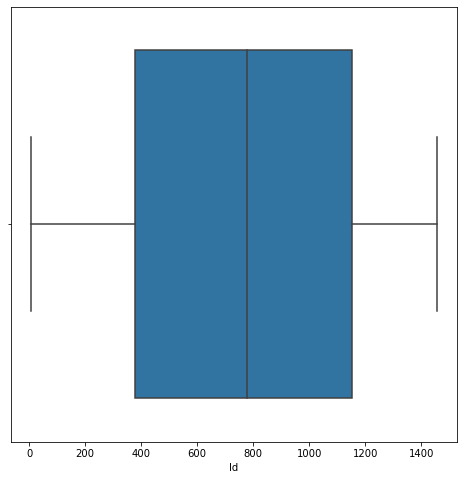

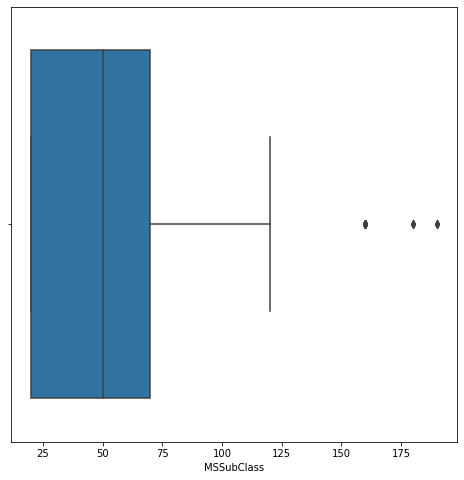

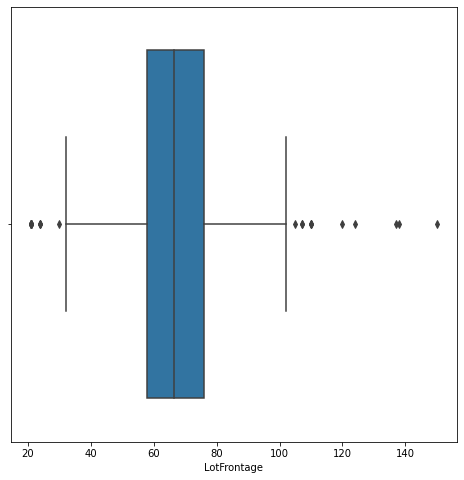

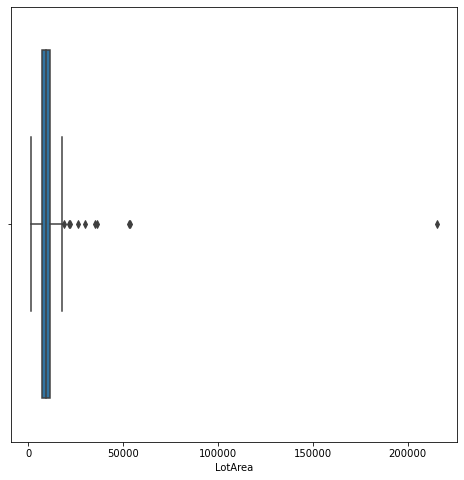

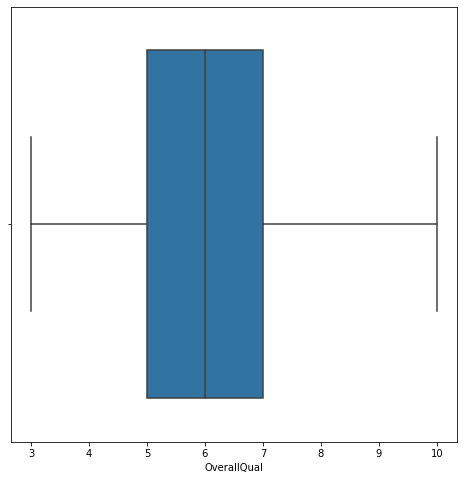

...

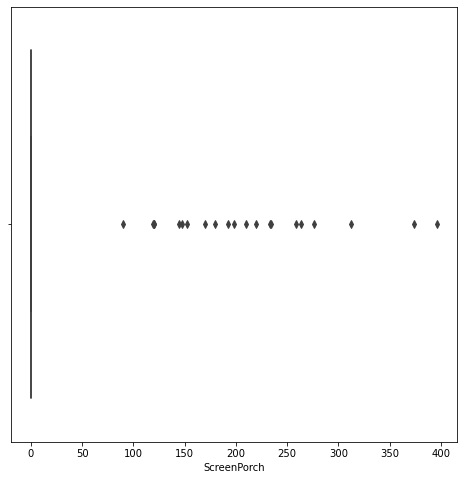

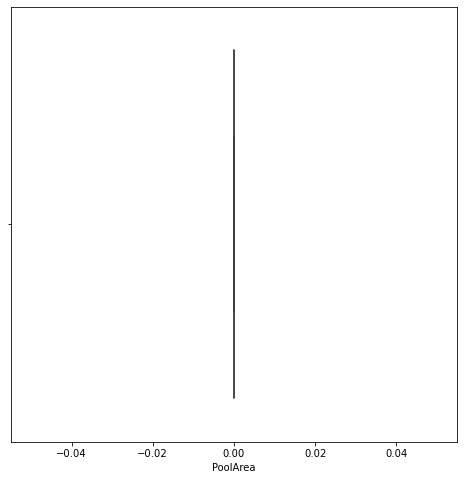

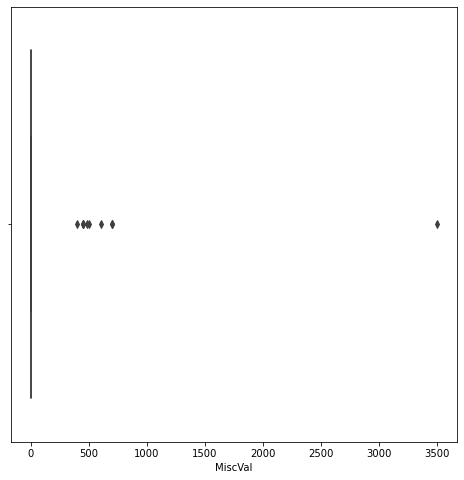

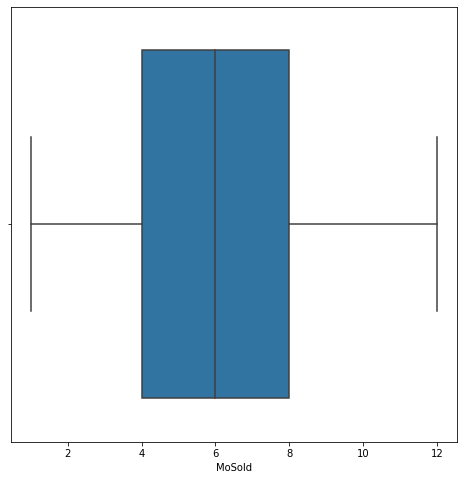

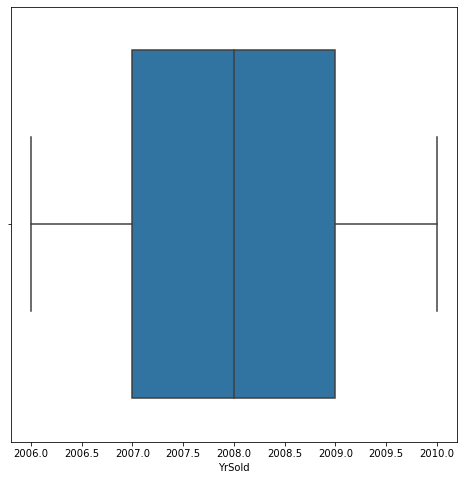

In [569]:
def outlier_detection():
    for o in df_test.select_dtypes(include=['number']):
        plt.figure(figsize=(8,8))
        outlier = sns.boxplot(df_test[o])
outlier_detection()

# Encoding

In [574]:
le = LabelEncoder()

In [575]:
#Label Encoder ---  converts categorical to numerical variables
for feature in df_test.select_dtypes(include=['O']):
    df_test[feature] = le.fit_transform(df_test[feature])
df_test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,2,86.000000,14157,1,0,0,1,0,...,0,0,0,2,1,0,7,2007,5,2
1,1018,120,2,66.425101,5814,1,0,0,3,0,...,0,0,0,2,1,0,8,2009,0,0
2,929,20,2,66.425101,11838,1,0,3,3,0,...,0,0,0,2,1,0,6,2009,5,2
3,1148,70,2,75.000000,12000,1,0,3,0,0,...,0,0,0,2,1,0,7,2009,5,2
4,1227,60,2,86.000000,14598,1,0,0,3,0,...,0,0,0,2,1,0,1,2008,5,2


# Correlation Matrix

In [576]:
df_test_corr = df_test.corr()
df_test_corr

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
Id,1.000000,0.035247,-0.087799,-0.016505,-0.045497,0.025743,0.041420,0.066225,-0.018921,2.508333e-02,...,-0.134738,-0.012348,NaN,-0.063382,0.006628,-0.073024,0.015132,0.034579,-0.016369,0.016243
MSSubClass,0.035247,1.000000,0.266517,-0.454786,-0.186654,0.004588,0.031969,0.176681,0.068736,-5.018279e-02,...,-0.045672,-0.072139,NaN,-0.055548,-0.177833,0.137542,-0.004079,0.044441,-0.105307,-0.010155
MSZoning,-0.087799,0.266517,1.000000,-0.335754,-0.117968,-0.063162,-0.037882,0.167716,-0.099137,-1.682458e-02,...,-0.023665,-0.059479,NaN,0.000271,-0.105995,0.090554,0.074308,-0.072716,0.123993,0.005290
LotFrontage,-0.016505,-0.454786,-0.335754,1.000000,0.370091,-0.056531,-0.100772,-0.147720,-0.086163,7.751122e-18,...,0.111523,0.068553,NaN,0.075733,-0.010509,0.031567,-0.045333,0.059745,0.034876,0.037168
LotArea,-0.045497,-0.186654,-0.117968,0.370091,1.000000,-0.069626,-0.035848,-0.110574,-0.131482,1.643004e-02,...,0.007832,0.090367,NaN,0.034390,0.022224,-0.020398,-0.034709,0.041735,0.037096,0.030689
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MiscVal,-0.073024,0.137542,0.090554,0.031567,-0.020398,0.010465,-0.016634,0.017304,0.037718,-7.387495e-03,...,0.103201,-0.032592,NaN,-0.004223,-0.909990,1.000000,0.009583,0.140017,0.029021,0.018734
MoSold,0.015132,-0.004079,0.074308,-0.045333,-0.034709,0.036965,0.122333,0.033461,0.037564,-1.107504e-01,...,0.062146,-0.012744,NaN,-0.033700,-0.016236,0.009583,1.000000,-0.149289,0.044305,0.087636
YrSold,0.034579,0.044441,-0.072716,0.059745,0.041735,-0.040272,0.034023,0.097144,0.064777,5.062251e-02,...,0.036249,-0.014433,NaN,0.013676,-0.095012,0.140017,-0.149289,1.000000,-0.097726,-0.083345
SaleType,-0.016369,-0.105307,0.123993,0.034876,0.037096,-0.019125,-0.005107,0.072375,0.056451,-3.806956e-01,...,0.018988,-0.032347,NaN,-0.047881,-0.013500,0.029021,0.044305,-0.097726,1.000000,0.349621


<AxesSubplot:>

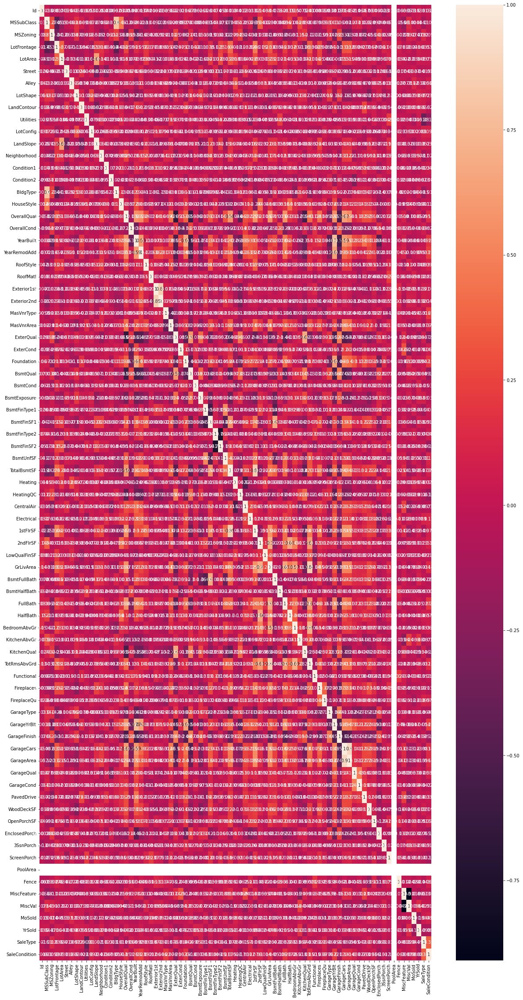

In [577]:
plt.figure(figsize=(20,40))
sns.heatmap(df_test_corr,annot=True)

Dropping PoolArea which has no values,So dropping poolArea will be efficient.

In [578]:
df_test.drop(['PoolArea'],axis=1,inplace=True)

# VIF

Checking vif to ensure that the variables are not multicollinear with each other

In [579]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df_test.values,i) for i in range(df_test.shape[1])]
vif['features'] = df_test.columns

print(vif.to_string())

             vif       features
0   5.250411e+00             Id
1   3.362528e+01     MSSubClass
2   4.162645e+01       MSZoning
3   3.341611e+01    LotFrontage
4   4.215737e+00        LotArea
5   2.442393e+02         Street
6   1.505320e+00          Alley
7   5.122503e+00       LotShape
8   3.056184e+01    LandContour
9   1.823713e+00      Utilities
10  6.920771e+00      LotConfig
11  2.890780e+00      LandSlope
12  7.990144e+00   Neighborhood
13  9.329859e+00     Condition1
14  1.541112e+00     Condition2
15  9.540045e+00       BldgType
16  1.072498e+01     HouseStyle
17  1.144755e+02    OverallQual
18  9.214579e+01    OverallCond
19  4.435051e+04      YearBuilt
20  3.813951e+04   YearRemodAdd
21  6.650057e+00      RoofStyle
22  1.424757e+00       RoofMatl
23  6.385675e+01    Exterior1st
24  5.829251e+01    Exterior2nd
25  1.957858e+01     MasVnrType
26  3.335690e+00     MasVnrArea
27  6.931699e+01      ExterQual
28  1.126694e+02      ExterCond
29  1.326531e+01     Foundation
30  2.24

In [580]:
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,2,86.000000,14157,1,0,0,1,0,...,0,0,0,2,1,0,7,2007,5,2
1,1018,120,2,66.425101,5814,1,0,0,3,0,...,0,0,0,2,1,0,8,2009,0,0
2,929,20,2,66.425101,11838,1,0,3,3,0,...,0,0,0,2,1,0,6,2009,5,2
3,1148,70,2,75.000000,12000,1,0,3,0,0,...,0,0,0,2,1,0,7,2009,5,2
4,1227,60,2,86.000000,14598,1,0,0,3,0,...,0,0,0,2,1,0,1,2008,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,2,78.000000,10206,1,0,3,3,0,...,0,0,0,2,1,0,10,2008,5,2
288,1048,20,2,57.000000,9245,1,0,1,3,0,...,0,0,0,2,1,0,2,2008,5,2
289,17,20,2,66.425101,11241,1,0,0,3,0,...,0,0,0,2,1,700,3,2010,5,2
290,523,50,3,50.000000,5000,1,0,3,3,0,...,36,0,0,2,1,0,10,2006,5,2


Checking for skewness in my test dataset

In [581]:
df_test.skew()

Id               -0.108806
MSSubClass        1.358597
MSZoning          0.187174
LotFrontage       0.466813
LotArea          12.781805
                   ...    
MiscVal          13.264758
MoSold            0.186504
YrSold            0.018412
SaleType         -5.489874
SaleCondition    -2.161104
Length: 78, dtype: float64

# PowerTransformer

The skewness for the test dataset is very large for some variables.I will use PowerTransformer to make sure the data will be Gaussian type.

In [582]:
from sklearn.preprocessing import PowerTransformer

pt_test = PowerTransformer()

In [583]:
df_test = pd.DataFrame(pt_test.fit_transform(df_test),columns=df_test.columns)

In [584]:
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,-0.879807,-1.149768,-0.283165,0.982253,0.842656,0.083045,-0.131991,-1.392667,-3.162098,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,0.318910,-0.650290,0.299220,0.012811
1,0.625162,1.337666,-0.283165,0.035790,-0.739104,0.083045,-0.131991,-1.392667,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,0.661063,0.863849,-3.414879,-2.554820
2,0.448645,-1.149768,-0.283165,0.035790,0.524304,0.083045,-0.131991,0.748880,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,-0.033863,0.863849,0.299220,0.012811
3,0.876033,0.705404,-0.283165,0.457389,0.548484,0.083045,-0.131991,0.748880,-3.163564,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,0.318910,0.863849,0.299220,0.012811
4,1.024890,0.507343,-0.283165,0.982253,0.897263,0.083045,-0.131991,-1.392667,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,-2.066617,0.107403,0.299220,0.012811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,-1.644185,-1.149768,-0.283165,0.602205,0.260474,0.083045,-0.131991,0.748880,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,1.319000,0.107403,0.299220,0.012811
288,0.683753,-1.149768,-0.283165,-0.442471,0.084663,0.083045,-0.131991,-0.809912,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,-1.604637,0.107403,0.299220,0.012811
289,-1.931828,-1.149768,-0.283165,0.035790,0.432254,0.083045,-0.131991,-1.392667,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,5.310367,-1.179475,1.619043,0.299220,0.012811
290,-0.423440,0.262613,1.799353,-0.809541,-1.006703,0.083045,-0.131991,0.748880,0.319149,-0.058621,...,2.540755,-0.083045,-0.278372,0.141976,0.058621,-0.188311,1.319000,-1.409242,0.299220,0.012811


# Feature Scaling

I will be doing feature scaling to make the values in a standard range and all values should be in same unit.

In [587]:
scalar = StandardScaler()
df_test = pd.DataFrame(scalar.fit_transform(df_test), columns=df_test.columns)

In [588]:
df_test

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,EnclosedPorch,3SsnPorch,ScreenPorch,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,-0.879807,-1.149768,-0.283165,0.982253,0.842656,0.083045,-0.131991,-1.392667,-3.162098,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,0.318910,-0.650289,0.299220,0.012811
1,0.625162,1.337666,-0.283165,0.035790,-0.739104,0.083045,-0.131991,-1.392667,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,0.661063,0.863849,-3.414879,-2.554820
2,0.448645,-1.149768,-0.283165,0.035790,0.524304,0.083045,-0.131991,0.748880,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,-0.033863,0.863849,0.299220,0.012811
3,0.876033,0.705404,-0.283165,0.457389,0.548484,0.083045,-0.131991,0.748880,-3.163564,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,0.318910,0.863849,0.299220,0.012811
4,1.024890,0.507343,-0.283165,0.982253,0.897263,0.083045,-0.131991,-1.392667,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,-2.066617,0.107404,0.299220,0.012811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,-1.644185,-1.149768,-0.283165,0.602205,0.260474,0.083045,-0.131991,0.748880,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,1.319000,0.107404,0.299220,0.012811
288,0.683753,-1.149768,-0.283165,-0.442471,0.084663,0.083045,-0.131991,-0.809912,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,-0.188311,-1.604637,0.107404,0.299220,0.012811
289,-1.931828,-1.149768,-0.283165,0.035790,0.432254,0.083045,-0.131991,-1.392667,0.319149,-0.058621,...,-0.392619,-0.083045,-0.278372,0.141976,0.058621,5.310367,-1.179475,1.619044,0.299220,0.012811
290,-0.423440,0.262613,1.799353,-0.809541,-1.006703,0.083045,-0.131991,0.748880,0.319149,-0.058621,...,2.540755,-0.083045,-0.278372,0.141976,0.058621,-0.188311,1.319000,-1.409241,0.299220,0.012811


# Feature Selection

I have selected those features which I have used to train my model on train dataset.So I will require same features to predict test values.

In [591]:
X_test = df_test[['OverallQual','GrLivArea','GarageCars','FullBath','GarageArea','BsmtQual','ExterQual','YearBuilt','TotRmsAbvGrd',
       'KitchenQual','TotalBsmtSF','GarageFinish','YearRemodAdd','1stFlrSF','HeatingQC','Foundation','GarageYrBlt',
       'Fireplaces','MasVnrArea','OpenPorchSF']]

In [592]:
X_test

,OverallQual,GrLivArea,GarageCars,FullBath,GarageArea,BsmtQual,ExterQual,YearBuilt,TotRmsAbvGrd,KitchenQual,TotalBsmtSF,GarageFinish,YearRemodAdd,1stFlrSF,HeatingQC,Foundation,GarageYrBlt,Fireplaces,MasVnrArea,OpenPorchSF
0,1.955022,0.943726,1.777376,0.777618,1.005556,-1.983887,-1.249653,1.222621,0.961793,-0.796820,1.931242,-1.435411,1.153837,1.814725,-0.919299,0.786288,1.230141,0.808861,1.182923,0.718308
1,1.365652,-0.077517,0.330046,-1.051784,0.533014,-0.593607,-1.249653,0.236597,-1.618327,-0.796820,0.451268,-0.322002,-0.278412,0.726749,0.916728,-0.490893,0.027527,0.808861,-0.846534,-1.111540
2,1.365652,0.729670,0.330046,0.777618,0.345151,-0.593607,-1.249653,1.013914,0.447622,-2.051384,1.587714,-0.322002,0.768563,1.586900,-0.919299,0.786288,0.971376,0.808861,-0.846534,1.278346
3,0.723224,0.334155,-0.988015,-1.051784,-1.014660,0.964252,0.730116,-1.113843,0.447622,-1.697344,-0.761116,0.984789,-1.524080,-0.705442,-0.919299,-0.490893,-1.519315,0.808861,-0.846534,-1.111540
4,0.015324,0.960645,1.777376,0.777618,0.972042,-0.593607,-1.249653,1.331019,1.420534,-0.796820,-0.297412,-1.435411,1.235800,-0.584696,-0.919299,0.786288,1.365358,0.808861,0.952580,0.218396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,1.365652,0.332268,1.777376,0.777618,1.344750,-0.593607,0.730116,1.331019,-0.137017,-0.796820,1.192686,-0.322002,1.235800,1.163629,-0.919299,0.786288,1.365358,0.808861,1.346700,1.056273
288,-0.775709,-1.007843,0.330046,-1.051784,0.988809,-0.593607,0.730116,0.673292,-0.814211,0.880621,-0.071527,0.984789,0.356052,-0.266685,-0.919299,0.786288,0.668692,-1.023536,-0.846534,-1.111540
289,0.015324,-0.966847,0.330046,-1.051784,0.158681,0.964252,0.730116,-0.287833,-0.814211,0.880621,-0.038996,-1.435411,-0.900731,-0.222862,-0.919299,-0.490893,-0.589109,0.808861,1.160601,-1.111540
290,0.015324,0.517140,0.330046,0.777618,-0.113440,0.964252,0.730116,-0.967568,0.447622,0.880621,-0.038996,0.984789,-1.524080,-0.222862,-0.919299,-0.490893,-1.272930,1.690566,-0.846534,0.352262


I will check vif for test dataset after applying feature scaling.

In [594]:
from statsmodels.stats.outliers_influence import variance_inflation_factor 

vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(X_test.values,i) for i in range(X_test.shape[1])]
vif['features'] = X_test.columns

print(vif.to_string())

         vif      features
0   3.275372   OverallQual
1   5.433388     GrLivArea
2   8.199461    GarageCars
3   2.555099      FullBath
4   6.476410    GarageArea
5   2.451881      BsmtQual
6   3.045392     ExterQual
7   6.728563     YearBuilt
8   3.772988  TotRmsAbvGrd
9   2.145609   KitchenQual
10  3.404080   TotalBsmtSF
11  1.897170  GarageFinish
12  2.510334  YearRemodAdd
13  3.737164      1stFlrSF
14  1.610935     HeatingQC
15  2.341852    Foundation
16  5.082412   GarageYrBlt
17  1.697336    Fireplaces
18  1.473577    MasVnrArea
19  1.296680   OpenPorchSF


With the usage of StandardScaler we have transformed all our feature values in a normalized format to avoid biases in our regression model.

Now I will use the df_test data and predict on my final model



In [589]:
#Final Model from my train dataset
random_hyperparameter

RandomForestRegressor(criterion='poisson', max_depth=4, max_features='sqrt')

In [593]:
#predicting values for test dataset

predicted_values = random_hyperparameter.predict(X_test)

data = pd.DataFrame(predicted_values,columns=['Predicted Sales Prices'])

data

,Predicted Sales Prices
0,115039.532566
1,99996.716554
2,105729.644157
3,101624.978793
4,115039.532566
...,...
287,115039.532566
288,96592.936454
289,101624.978793
290,104903.715145


Here we are using our best model algorithm to predict the target label and show it in a dataframe. This information can also be exported in a spread sheet if required.